In [1]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
%matplotlib inline  


/Users/chronowanderer/anaconda3/envs/tensorflow/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
%store -r numSeries
%store -r numPredict
%store -r TRAIN_SIZE
%store -r EFFECTIVE_COEFFICIENT
%store -r EFFECTIVE_LOC
%store -r tmax
%store -r h
%store -r lentmax

%store -r norm
%store -r a
%store -r sigma
%store -r Target
%store -r Response
%store -r Error
%store -r RTloc
%store -r Dat


In [3]:
FORECAST_MAX = 32
TIME_STEPS = 32
HIDDEN_UNITS = 64
SECOND_HIDDEN_UNITS = 32
INPUT_UNITS = 2
OUTPUT_UNITS = 2
BATCH_SIZE = 4
EPOCH = 10
look_back = TIME_STEPS
T = numpy.linspace(0, tmax, lentmax, endpoint = False)
DATA_i = 0
DATA_f = lentmax - 1


In [4]:
def atan_positive(x, y):
    if (x > 0) & (y > 0):
        theta = math.atan(y / x)
    elif (x == 0) & (y > 0):
        theta = math.pi / 2
    elif (x < 0):
        theta = math.pi + math.atan(y / x)
    elif (x == 0) & (y < 0):
        theta = 3 * math.pi / 2
    elif (x > 0) & (y <= 0):
        theta = 2 * math.pi + math.atan(y / x)
    return theta

def semicircular_error(r, t):
    e = r - t
    if e >= 90:
        e = e - 180
    elif e < -90:
        e = e + 180
    return e

def quardric_dance(o, i):
    delta = o - i
    if delta >= 90:
        return o - 180
    elif delta < -90:
        return o + 180
    return o


In [5]:
Dat = numpy.array(Dat) # all data
Data = Dat[0 : numSeries, :, :] # training & testing & sequently predicting
Data_p = Dat[numSeries : numSeries + numPredict, :, :] # complete prediction

dataset, dataset_t = [], []
for i in numpy.arange(numSeries):
    for j in numpy.arange(lentmax):
        dataset.append(Data[i, j])
        dataset_t.append(Data[i, j])
dataset = numpy.array(dataset)
dataset_p = []
for i in numpy.arange(numPredict):
    for j in numpy.arange(lentmax):
        dataset_p.append(Data_p[i, j])
        dataset_t.append(Data_p[i, j])
predict = numpy.array(dataset_p)
dataset_t = numpy.array(dataset_t)

print dataset.shape, predict.shape, dataset_t.shape


(1000000, 2) (200000, 2) (1200000, 2)


In [6]:
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset_t = scaler.fit_transform(dataset_t)
dataset = dataset_t[0:numSeries*lentmax, :]
predict = dataset_t[numSeries*lentmax:(numSeries+numPredict)*lentmax, :]


In [7]:
TOTAL_TIME = Data.shape[1]

# split into train and test sets
train_size = TRAIN_SIZE
test_size = TOTAL_TIME - train_size + look_back
train, test = [], []
for k in range(numSeries):
    kk = k * TOTAL_TIME
    for t in range(kk, kk+train_size):
        train.append(dataset[t, :])
    for t in range(kk+train_size-look_back, kk+TOTAL_TIME):
        test.append(dataset[t, :])
train = numpy.array(train)
test = numpy.array(test)
        
print train.shape, test.shape, predict.shape

# use this function to prepare the train and test datasets for modeling
trainX, trainY = [], []
for k in range(numSeries):
    kk = k * train_size
    for i in range(train_size - look_back):
        temp = train[(kk + i) : (kk + i + look_back), :]
        trainX.append(temp)
        trainY.append(train[kk + i + look_back, :])
    
trainX = numpy.array(trainX)
trainY = numpy.array(trainY)

# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], look_back, trainX.shape[2]))


(50000, 2) (966000, 2) (200000, 2)


In [8]:
# create and fit the LSTM network
model = Sequential()

#model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS)))
model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS), return_sequences=True))
model.add(LSTM(SECOND_HIDDEN_UNITS))

model.add(Dense(OUTPUT_UNITS))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs = EPOCH, batch_size = BATCH_SIZE, verbose = 2)


Epoch 1/10
 - 327s - loss: 2.3015e-04
Epoch 2/10
 - 324s - loss: 3.3459e-05
Epoch 3/10
 - 325s - loss: 2.6068e-05
Epoch 4/10
 - 325s - loss: 2.4365e-05
Epoch 5/10
 - 325s - loss: 2.3441e-05
Epoch 6/10
 - 325s - loss: 2.2734e-05
Epoch 7/10
 - 325s - loss: 2.1815e-05
Epoch 8/10
 - 325s - loss: 2.1590e-05
Epoch 9/10
 - 324s - loss: 2.1277e-05
Epoch 10/10
 - 325s - loss: 2.0572e-05


In [9]:
# prepare for the forecasting
trainPredict = model.predict(trainX)

# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform(trainY)
trainScore = math.sqrt(mean_squared_error(trainY, trainPredict))
print('Train Score: %.4f RMSE' % (trainScore))

# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(Data)
trainPredictPlot[:, :, :] = numpy.nan
for s in range(numSeries):
    for t in range(train_size - look_back):
        trainPredictPlot[s, t + look_back, :] = trainPredict[t + s * (train_size - look_back), :]


Train Score: 0.0373 RMSE


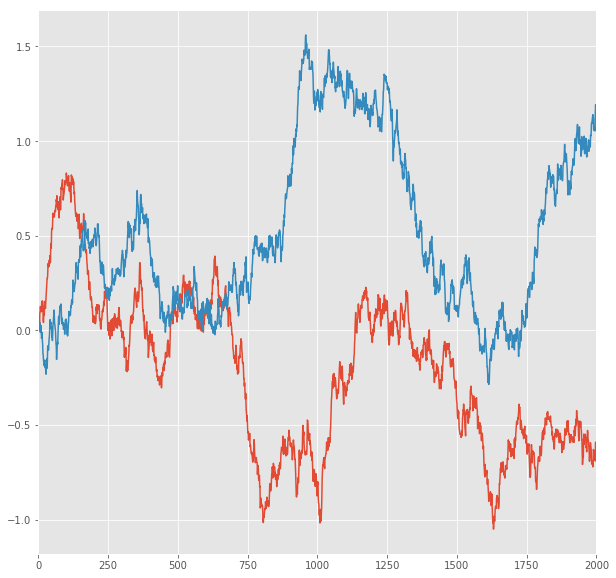

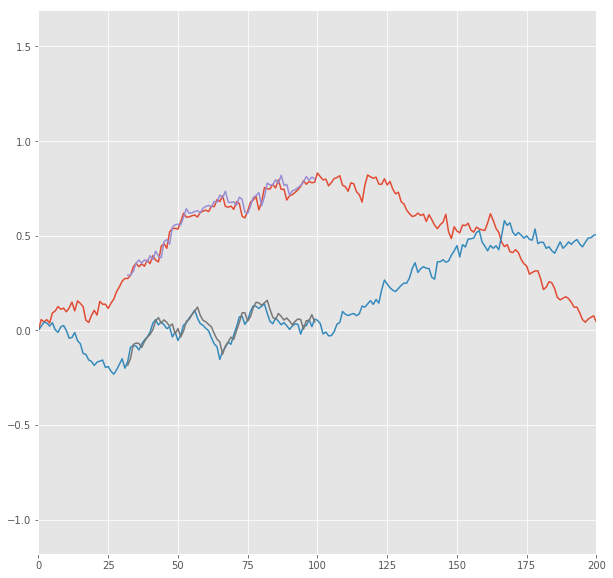

In [10]:
#lalala
plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, lentmax)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, TRAIN_SIZE + 100)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.plot(trainPredictPlot[loc, :, 0])
plt.plot(trainPredictPlot[loc, :, 1])
plt.show()


In [11]:
testX, predictX = [], []
for k in range(numSeries):
    kk = k * test_size
    for i in range(test_size - look_back):
        temp = test[(kk + i) : (kk + i + look_back), :]
        testX.append(temp)
for k in range(numPredict):
    kk = k * lentmax
    for i in range(lentmax - look_back):
        temp = predict[(kk + i) : (kk + i + look_back), :]
        predictX.append(temp)
testX = numpy.array(testX)
predictX = numpy.array(predictX)
testX = numpy.reshape(testX, (testX.shape[0], look_back, testX.shape[2]))
predictX = numpy.reshape(predictX, (predictX.shape[0], look_back, predictX.shape[2]))


1 -step(s) forecast:
Test Score for 1 -steps forecast: 0.0869 RMSE
Predict Score for 1 -steps forecast: 0.0867 RMSE
Error Test Score for 1 -steps forecast: 0.1432 RMSE
RT Test Score for 1 -steps forecast: 0.1035 RMSE
Error Test Corr for 1 -steps forecast: 0.9726
RT Test Corr for 1 -steps forecast: 0.9442


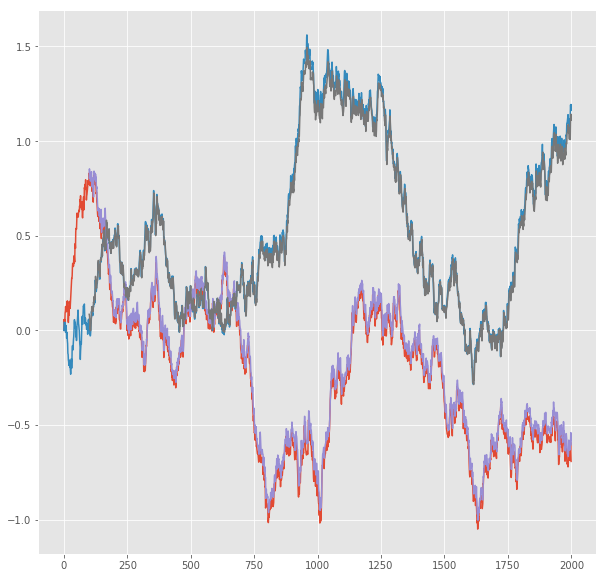

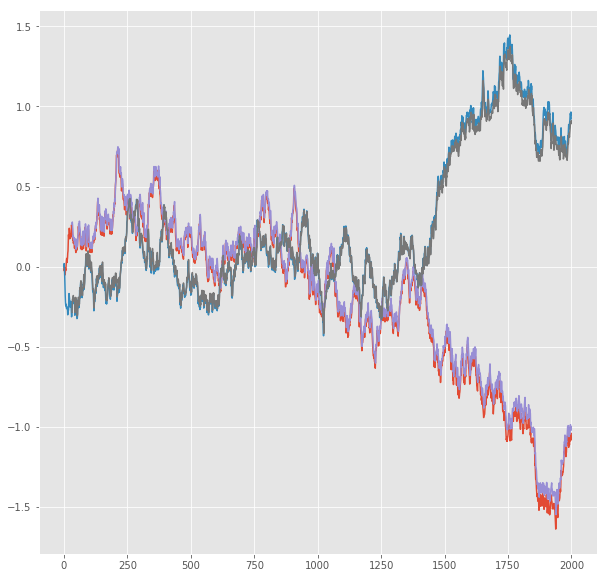

R^2 score for regression on Error: 0.9459
k = 0.9905


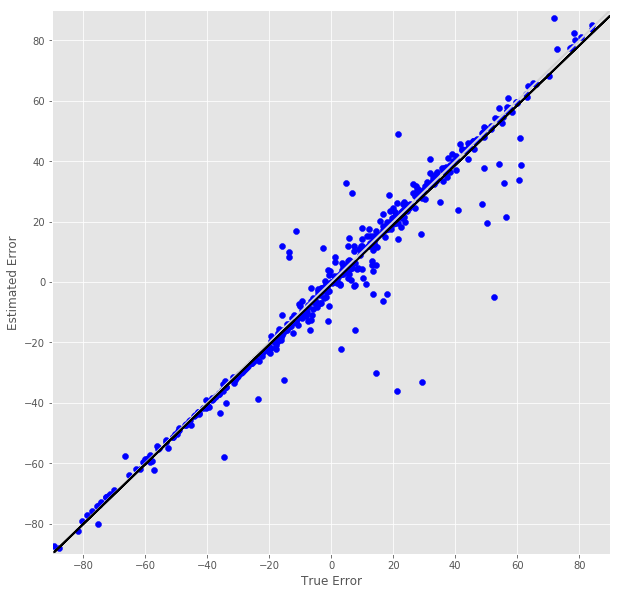

R^2 score for regression on RT: 0.8916
k = 1.0014


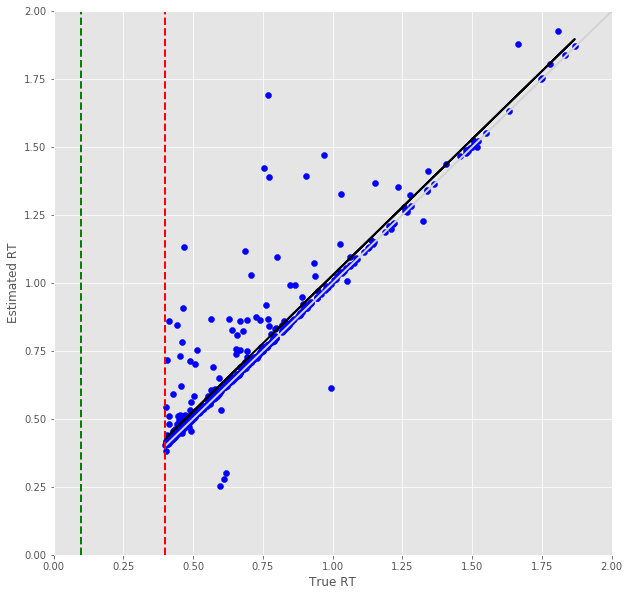

Error Prediction Score: 0.1291 RMSE
RT Prediction Score: 0.0932 RMSE
Error Prediction Corr: 0.9803
RT Prediction Corr: 0.9579
R^2 score for regression on Error: 0.9609
k = 0.9739


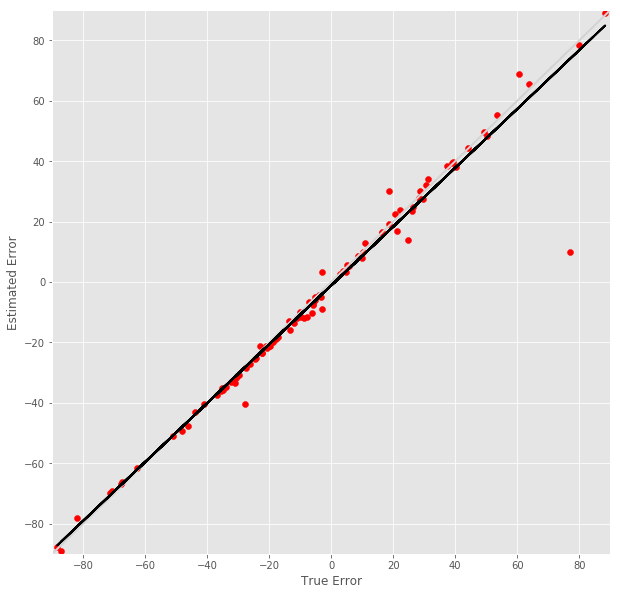

R^2 score for regression on RT: 0.9175
k = 0.9698


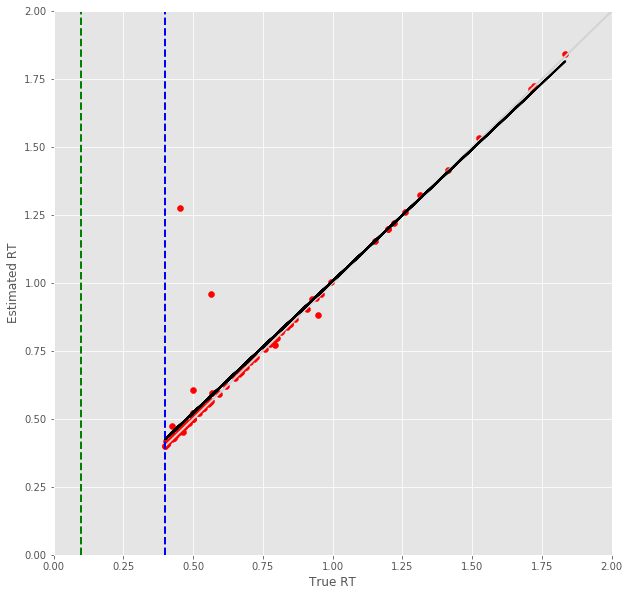

2 -step(s) forecast:
Test Score for 2 -steps forecast: 0.1475 RMSE
Predict Score for 2 -steps forecast: 0.1469 RMSE
Error Test Score for 2 -steps forecast: 0.1844 RMSE
RT Test Score for 2 -steps forecast: 0.1470 RMSE
Error Test Corr for 2 -steps forecast: 0.9557
RT Test Corr for 2 -steps forecast: 0.8920


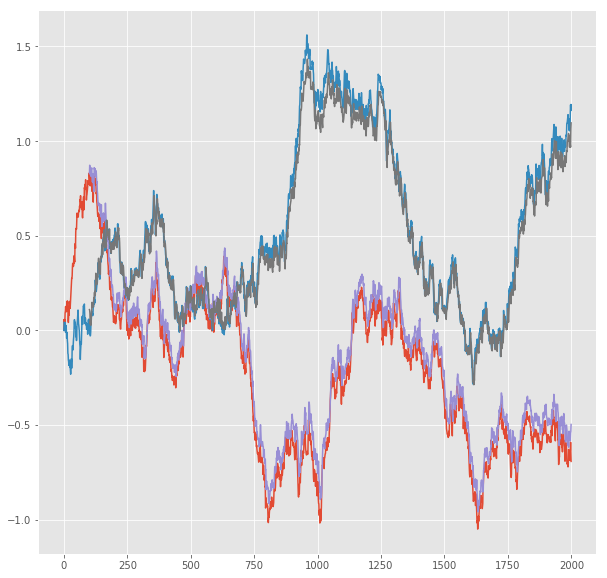

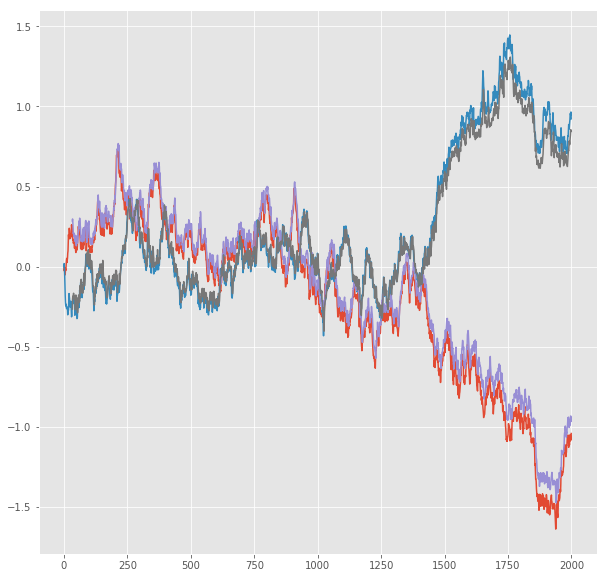

R^2 score for regression on Error: 0.9134
k = 0.9837


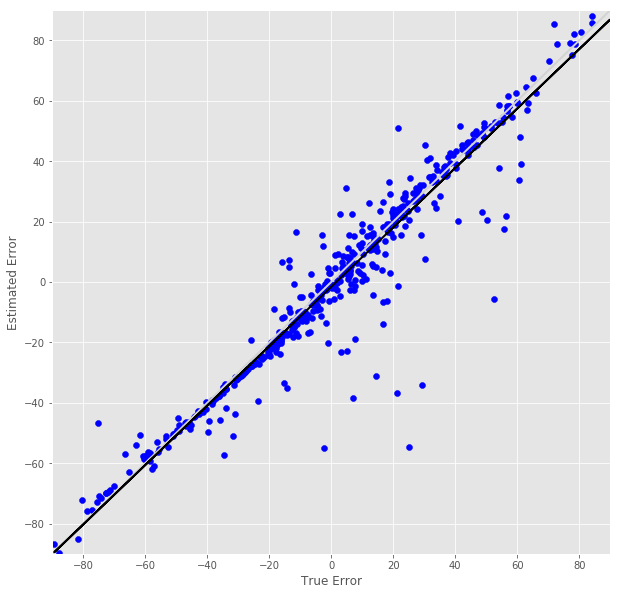

R^2 score for regression on RT: 0.7956
k = 0.9643


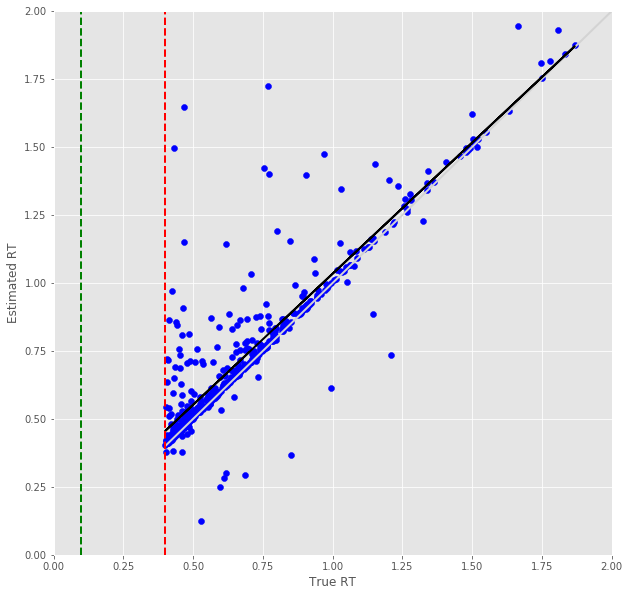

Error Prediction Score: 0.1471 RMSE
RT Prediction Score: 0.1116 RMSE
Error Prediction Corr: 0.9750
RT Prediction Corr: 0.9435
R^2 score for regression on Error: 0.9506
k = 0.9723


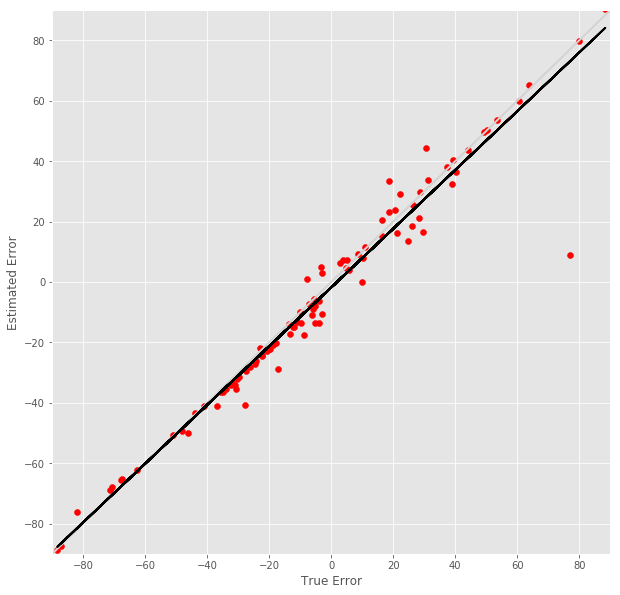

R^2 score for regression on RT: 0.8902
k = 0.9558


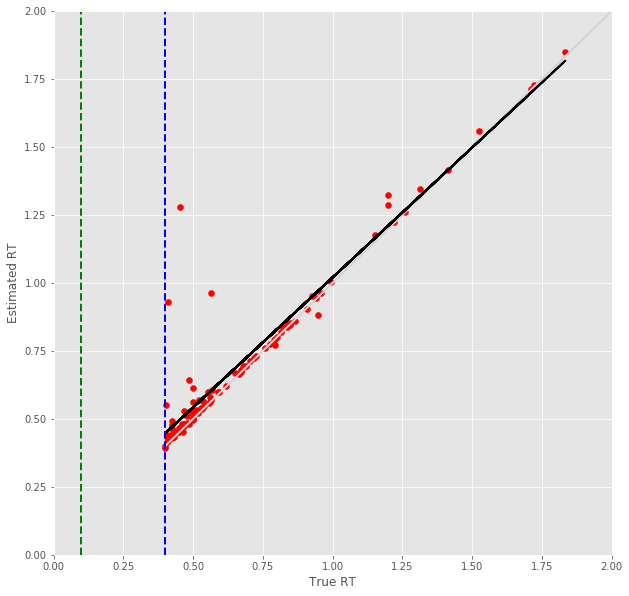

3 -step(s) forecast:
Test Score for 3 -steps forecast: 0.2015 RMSE
Predict Score for 3 -steps forecast: 0.2004 RMSE
Error Test Score for 3 -steps forecast: 0.2190 RMSE
RT Test Score for 3 -steps forecast: 0.1876 RMSE
Error Test Corr for 3 -steps forecast: 0.9386
RT Test Corr for 3 -steps forecast: 0.8250


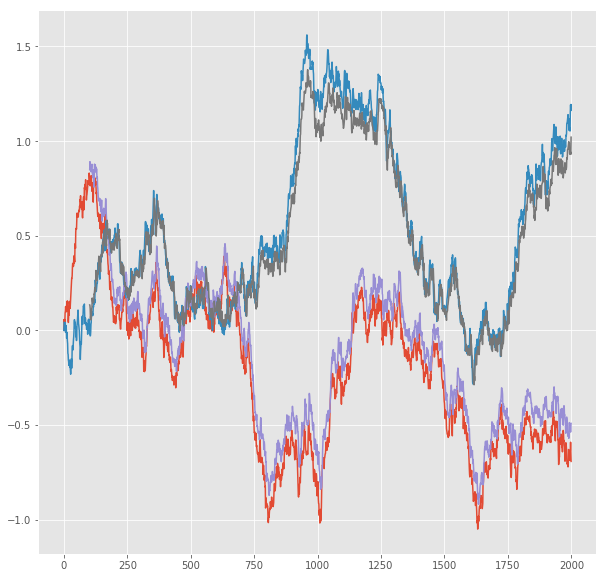

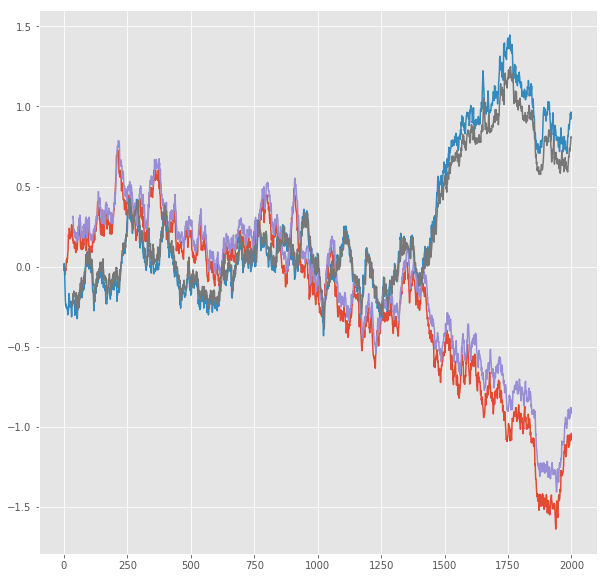

R^2 score for regression on Error: 0.8809
k = 0.9669


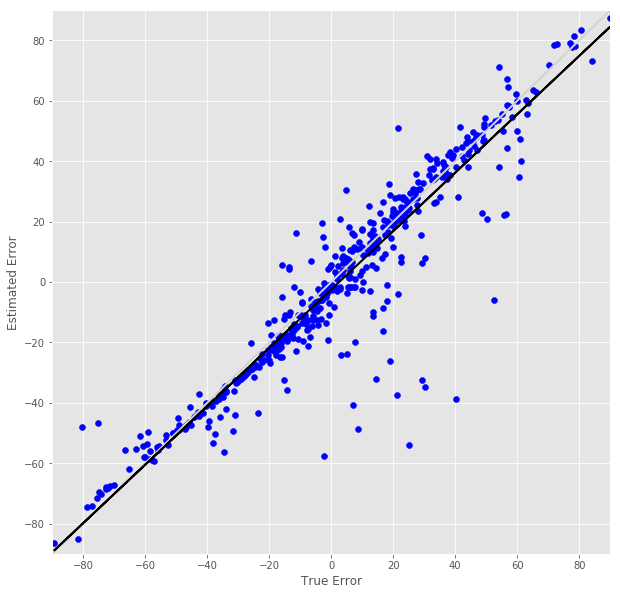

R^2 score for regression on RT: 0.6806
k = 0.9111


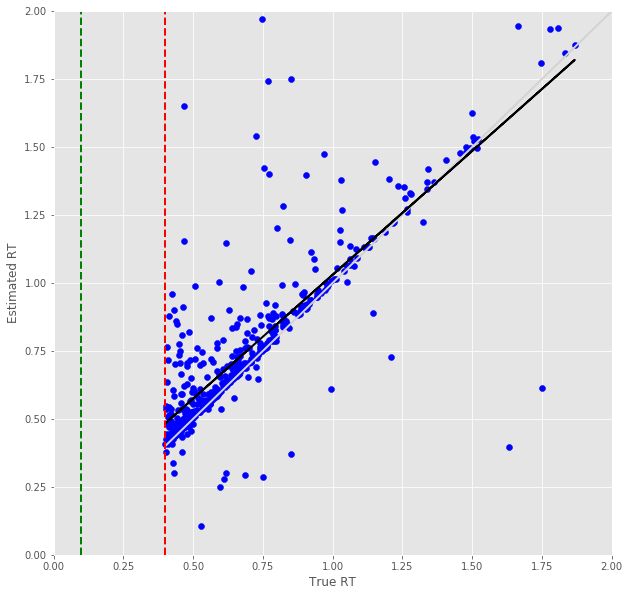

Error Prediction Score: 0.1776 RMSE
RT Prediction Score: 0.1489 RMSE
Error Prediction Corr: 0.9636
RT Prediction Corr: 0.9125
R^2 score for regression on Error: 0.9284
k = 0.9578


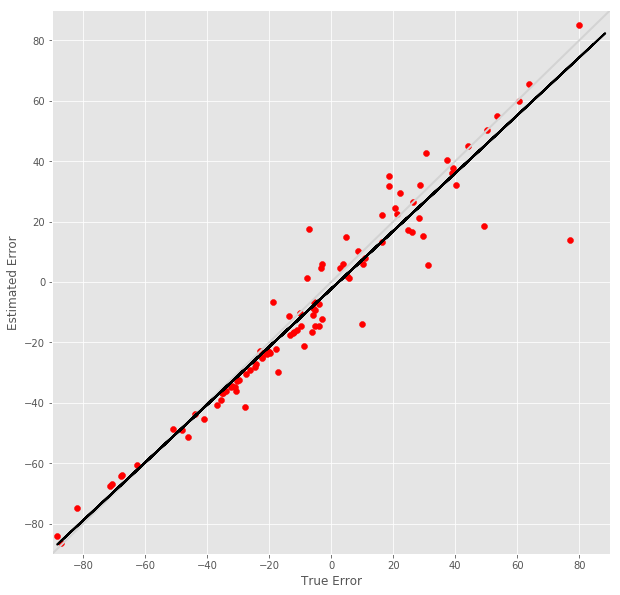

R^2 score for regression on RT: 0.8327
k = 0.9633


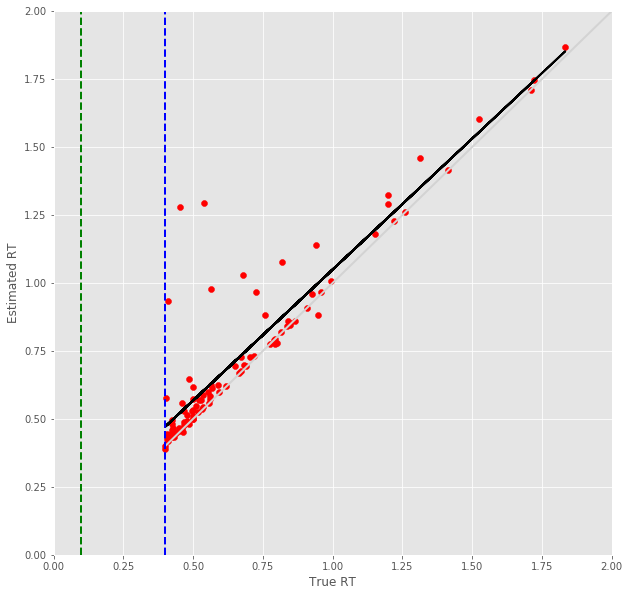

4 -step(s) forecast:
Test Score for 4 -steps forecast: 0.2511 RMSE
Predict Score for 4 -steps forecast: 0.2496 RMSE
Error Test Score for 4 -steps forecast: 0.2606 RMSE
RT Test Score for 4 -steps forecast: 0.2130 RMSE
Error Test Corr for 4 -steps forecast: 0.9168
RT Test Corr for 4 -steps forecast: 0.7794


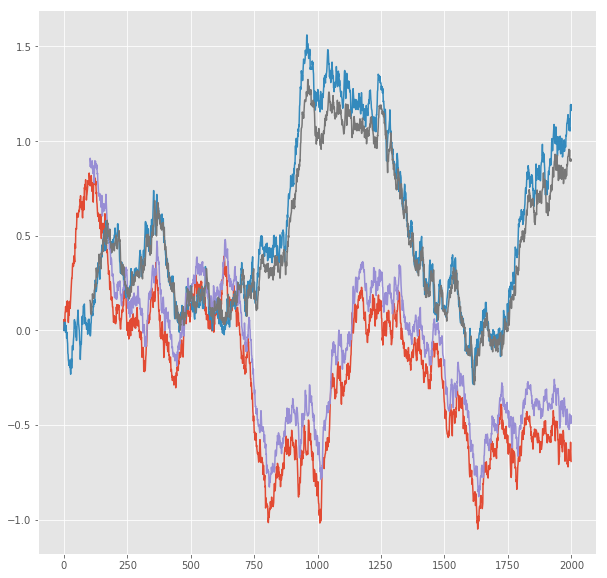

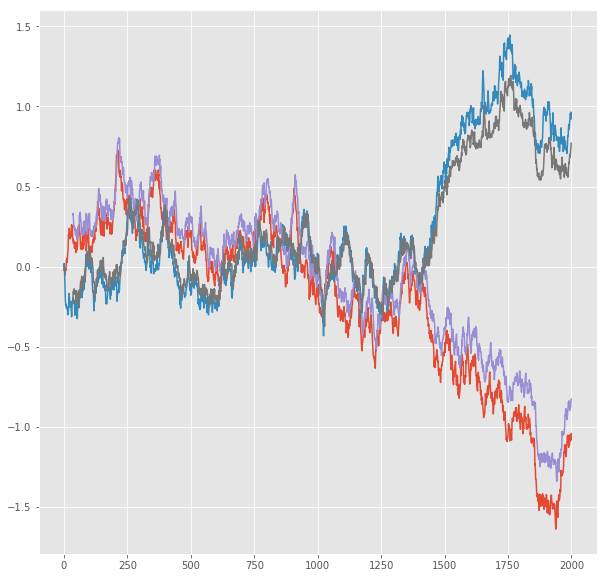

R^2 score for regression on Error: 0.8406
k = 0.9641


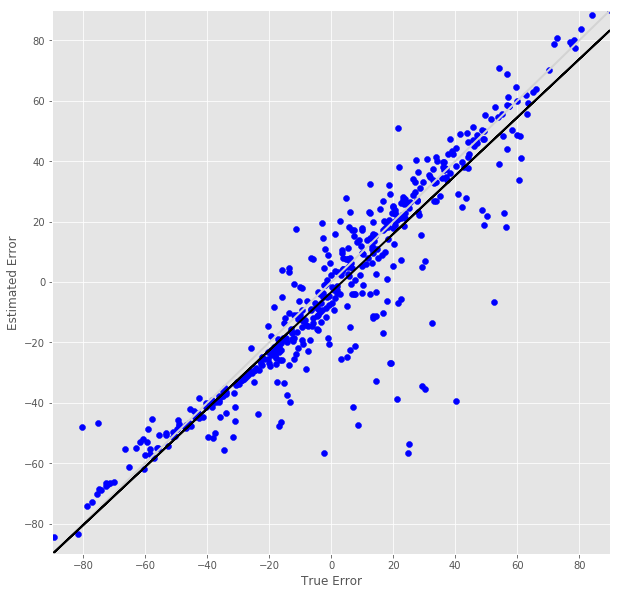

R^2 score for regression on RT: 0.6074
k = 0.8843


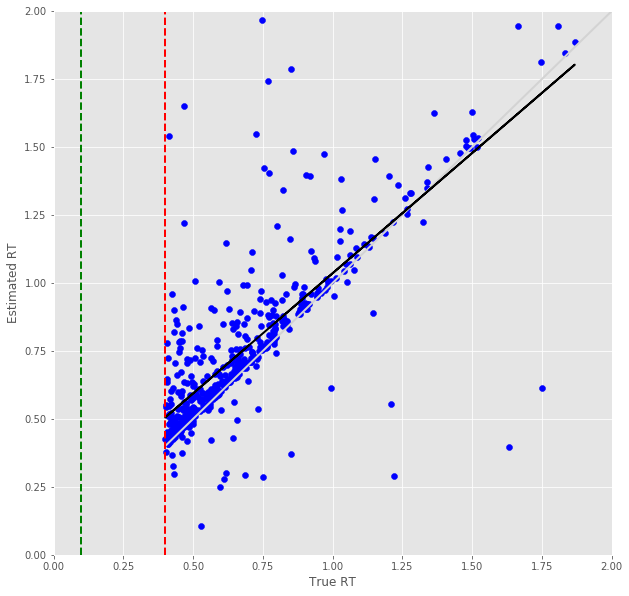

Error Prediction Score: 0.2100 RMSE
RT Prediction Score: 0.1650 RMSE
Error Prediction Corr: 0.9522
RT Prediction Corr: 0.8897
R^2 score for regression on Error: 0.9067
k = 0.9855


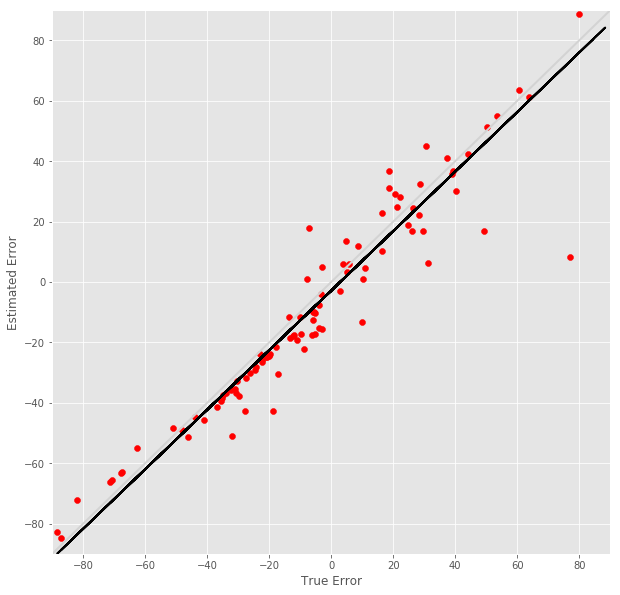

R^2 score for regression on RT: 0.7915
k = 0.9449


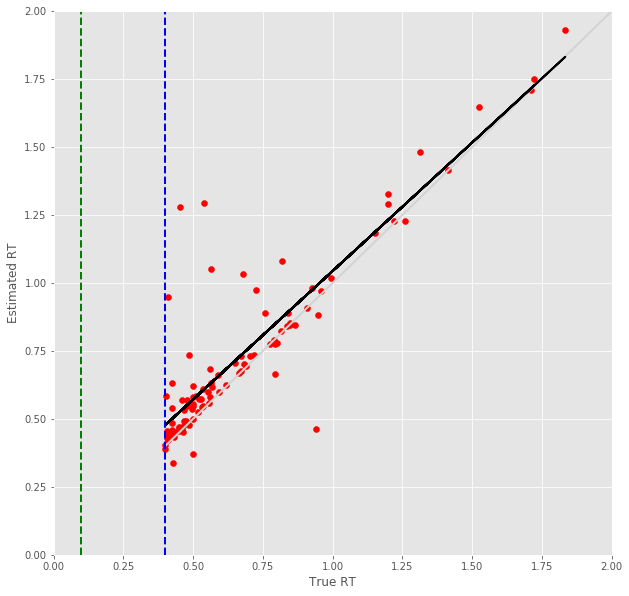

5 -step(s) forecast:
Test Score for 5 -steps forecast: 0.2972 RMSE
Predict Score for 5 -steps forecast: 0.2951 RMSE
Error Test Score for 5 -steps forecast: 0.2882 RMSE
RT Test Score for 5 -steps forecast: 0.2433 RMSE
Error Test Corr for 5 -steps forecast: 0.8992
RT Test Corr for 5 -steps forecast: 0.7299


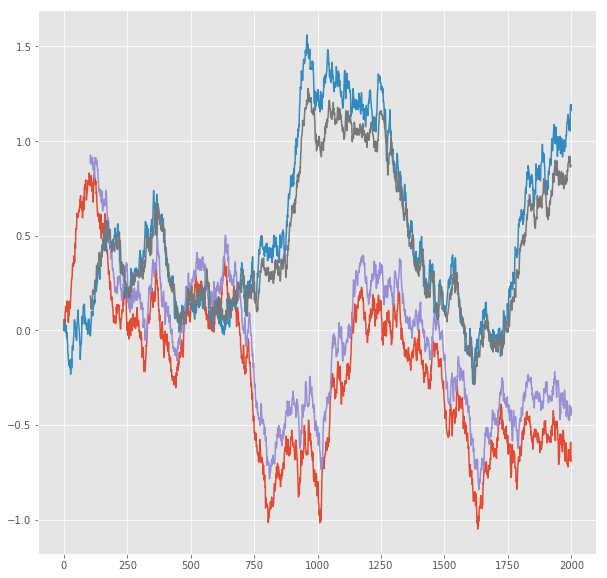

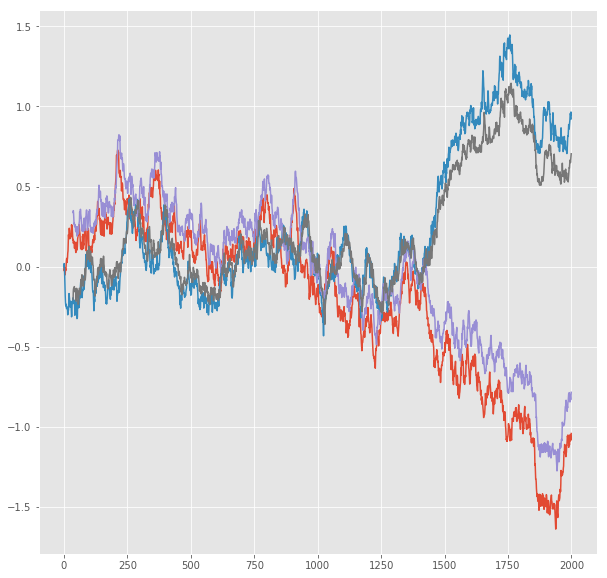

R^2 score for regression on Error: 0.8086
k = 0.9384


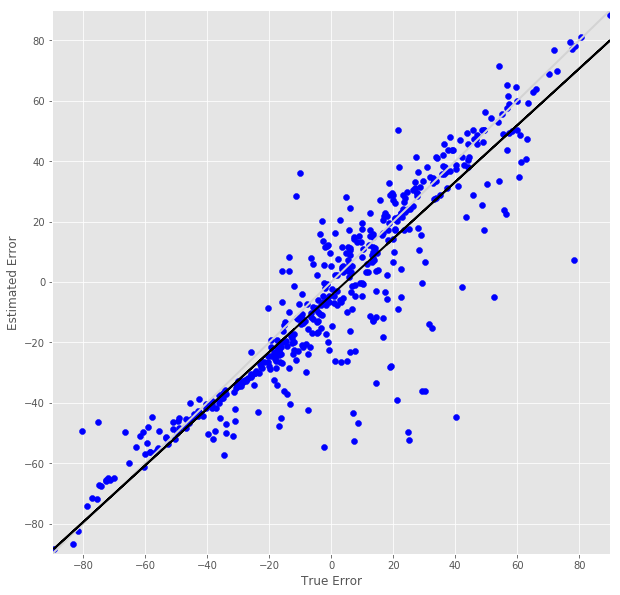

R^2 score for regression on RT: 0.5327
k = 0.8688


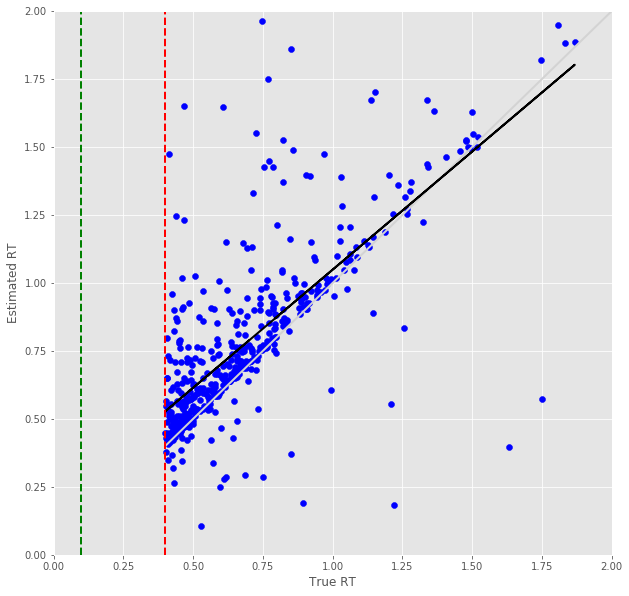

Error Prediction Score: 0.2110 RMSE
RT Prediction Score: 0.1787 RMSE
Error Prediction Corr: 0.9538
RT Prediction Corr: 0.8742
R^2 score for regression on Error: 0.9098
k = 1.0006


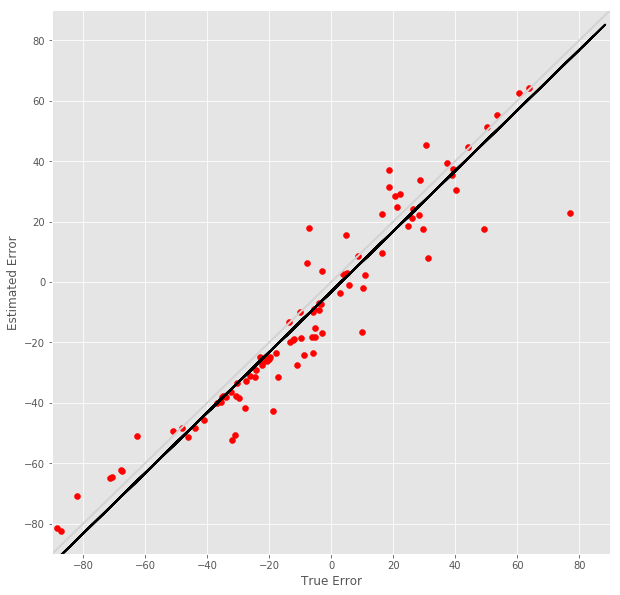

R^2 score for regression on RT: 0.7642
k = 0.9319


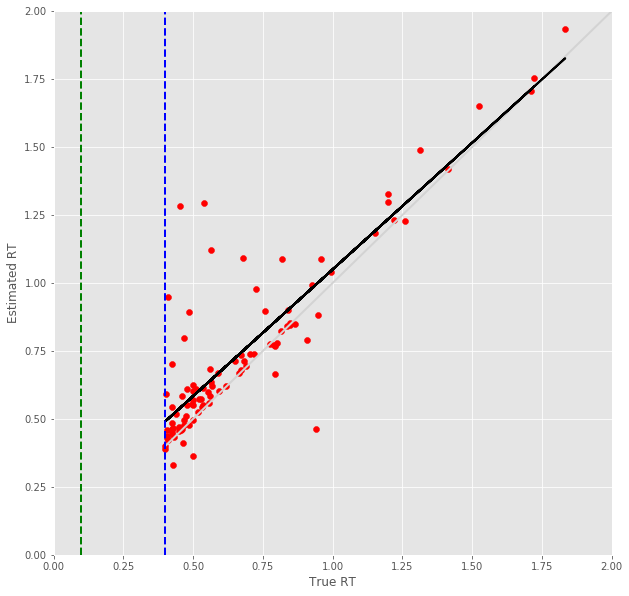

6 -step(s) forecast:
Test Score for 6 -steps forecast: 0.3403 RMSE
Predict Score for 6 -steps forecast: 0.3377 RMSE
Error Test Score for 6 -steps forecast: 0.3392 RMSE
RT Test Score for 6 -steps forecast: 0.3040 RMSE
Error Test Corr for 6 -steps forecast: 0.8702
RT Test Corr for 6 -steps forecast: 0.6016


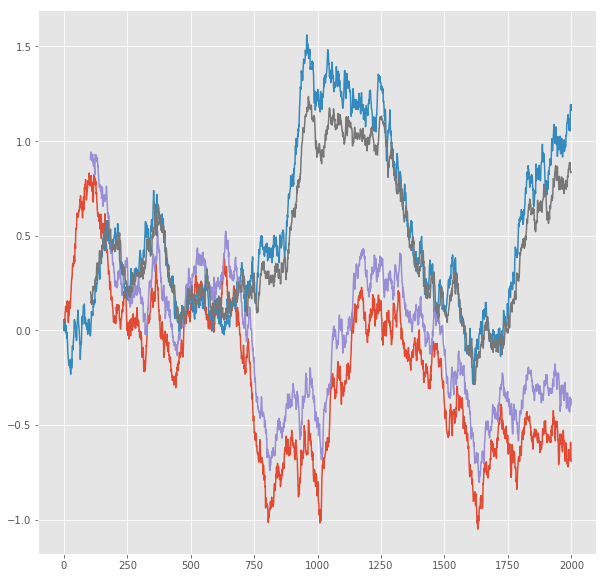

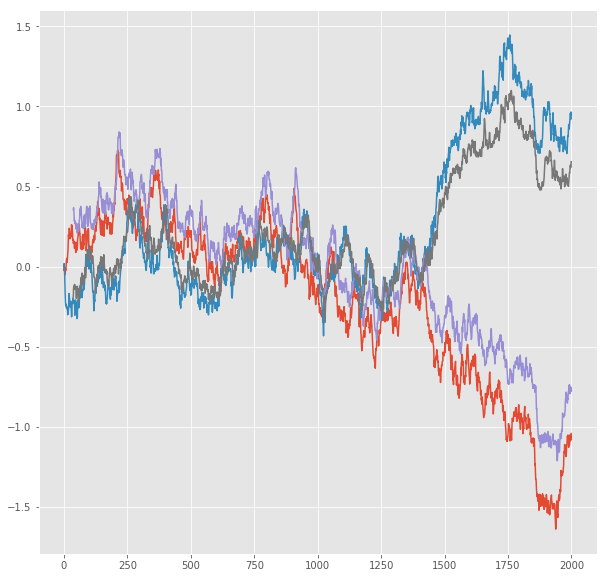

R^2 score for regression on Error: 0.7573
k = 0.9345


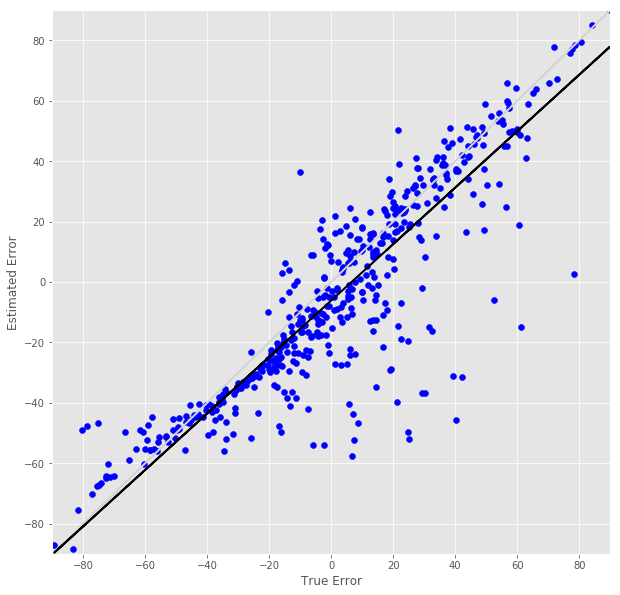

R^2 score for regression on RT: 0.3620
k = 0.7570


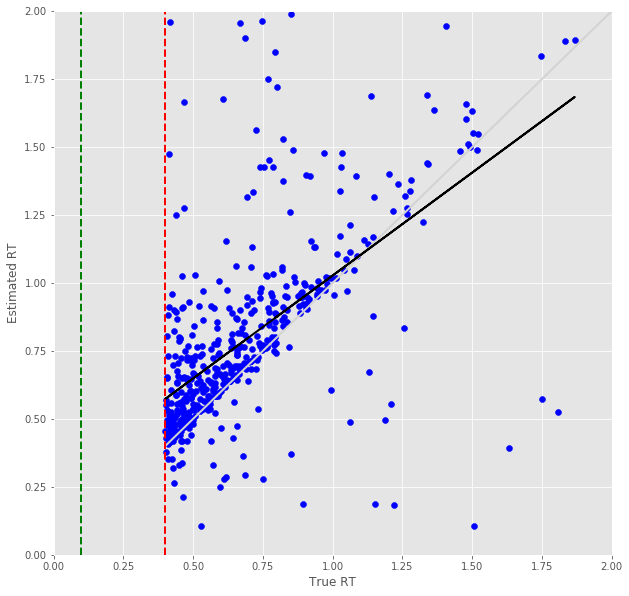

Error Prediction Score: 0.2353 RMSE
RT Prediction Score: 0.1942 RMSE
Error Prediction Corr: 0.9433
RT Prediction Corr: 0.8605
R^2 score for regression on Error: 0.8897
k = 0.9826


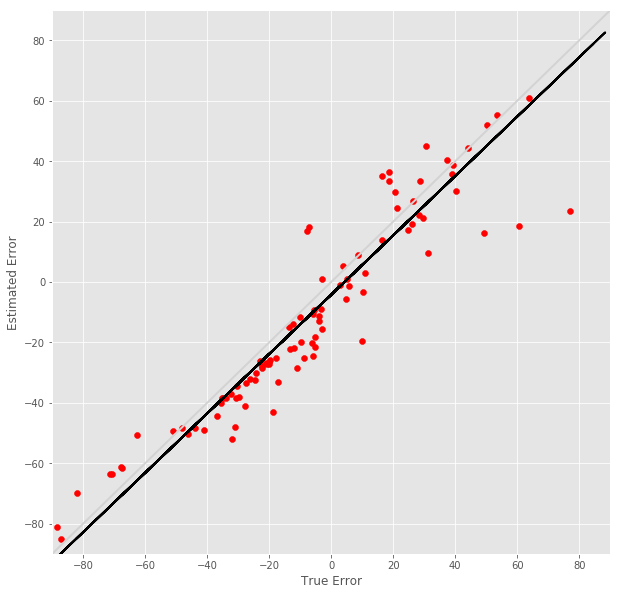

R^2 score for regression on RT: 0.7404
k = 0.9181


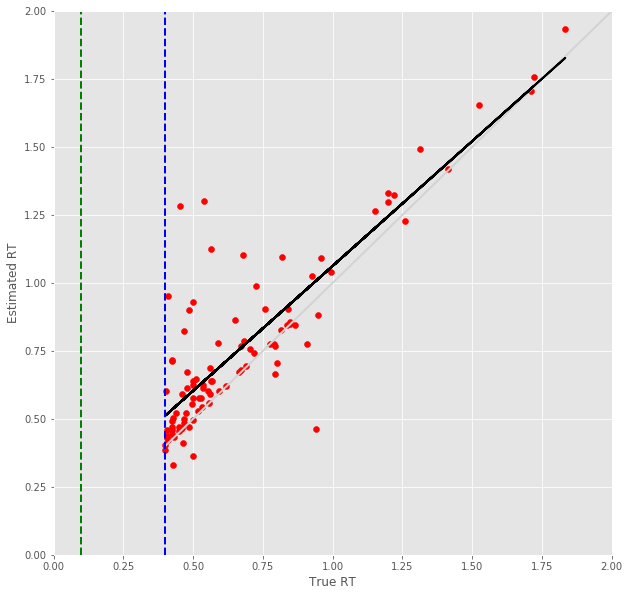

7 -step(s) forecast:
Test Score for 7 -steps forecast: 0.3809 RMSE
Predict Score for 7 -steps forecast: 0.3777 RMSE
Error Test Score for 7 -steps forecast: 0.3812 RMSE
RT Test Score for 7 -steps forecast: 0.3310 RMSE
Error Test Corr for 7 -steps forecast: 0.8334
RT Test Corr for 7 -steps forecast: 0.5366


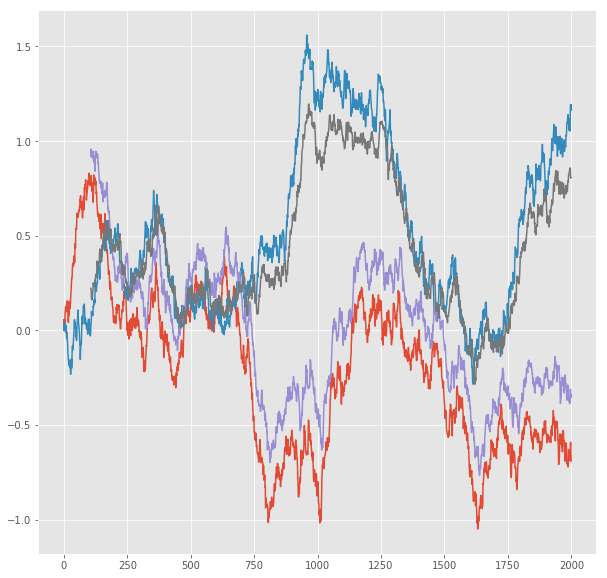

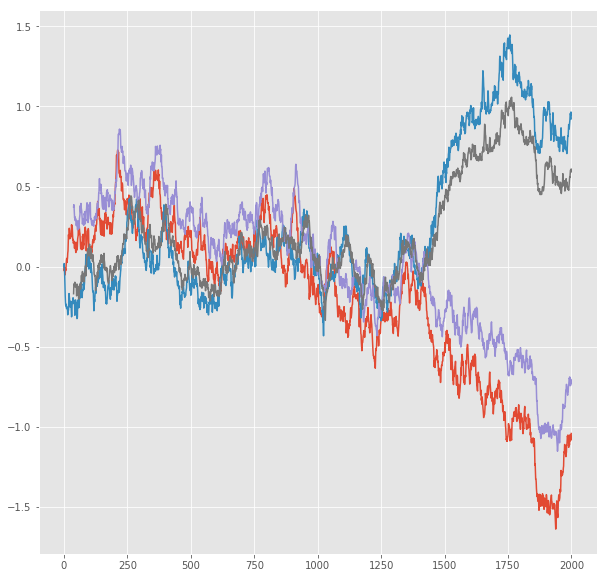

R^2 score for regression on Error: 0.6946
k = 0.8971


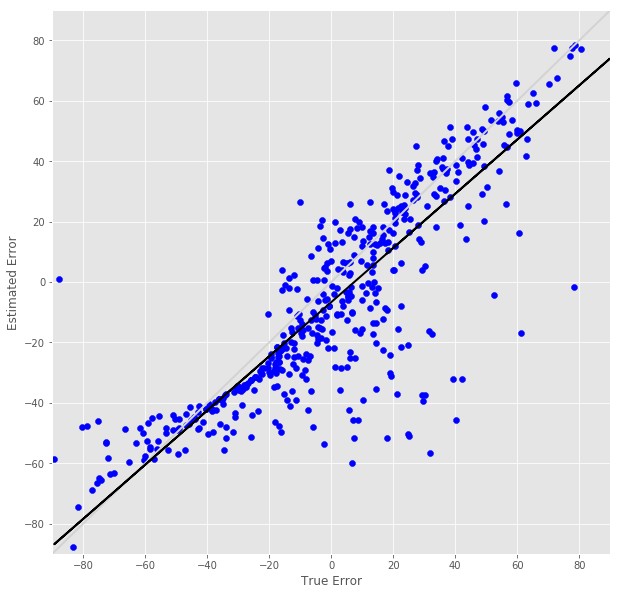

R^2 score for regression on RT: 0.2879
k = 0.6885


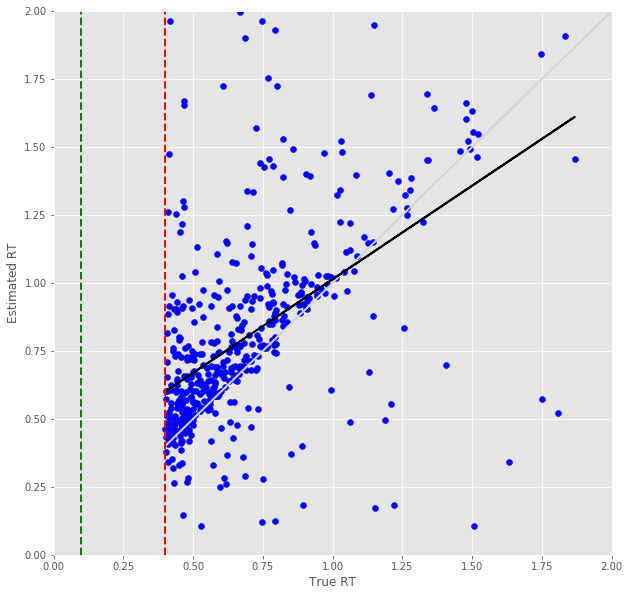

Error Prediction Score: 0.2726 RMSE
RT Prediction Score: 0.2465 RMSE
Error Prediction Corr: 0.9277
RT Prediction Corr: 0.7498
R^2 score for regression on Error: 0.8606
k = 0.9690


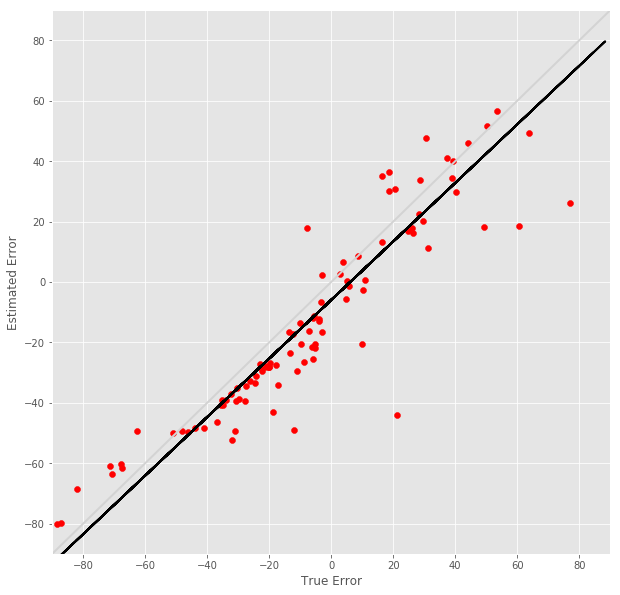

R^2 score for regression on RT: 0.5622
k = 0.7647


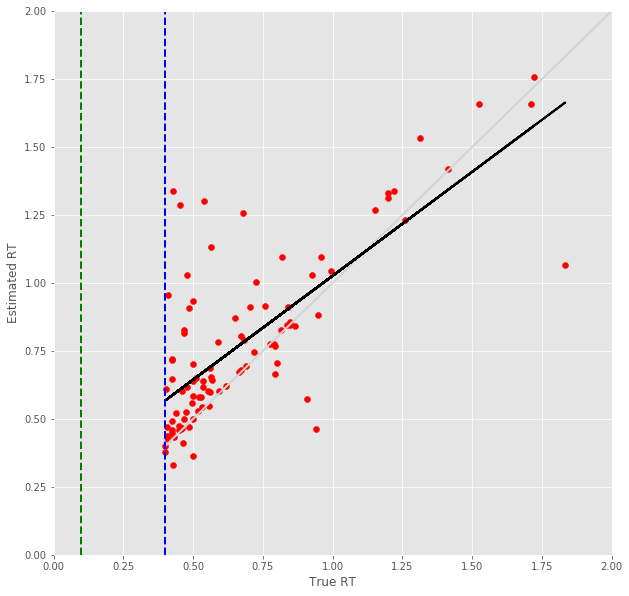

8 -step(s) forecast:
Test Score for 8 -steps forecast: 0.4192 RMSE
Predict Score for 8 -steps forecast: 0.4154 RMSE
Error Test Score for 8 -steps forecast: 0.3995 RMSE
RT Test Score for 8 -steps forecast: 0.3466 RMSE
Error Test Corr for 8 -steps forecast: 0.8257
RT Test Corr for 8 -steps forecast: 0.5066


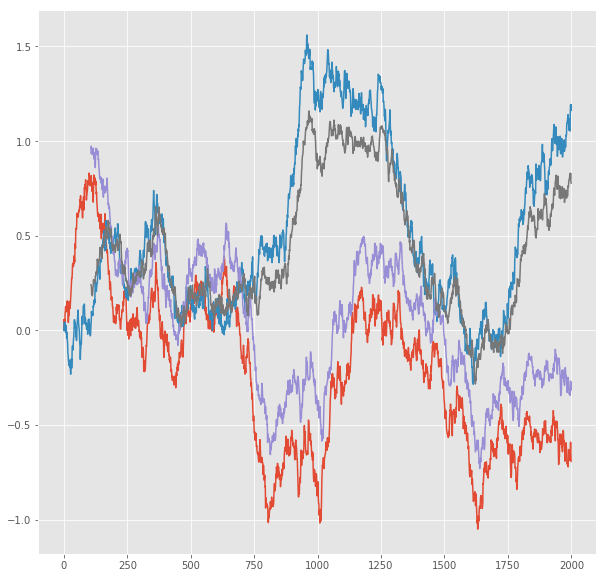

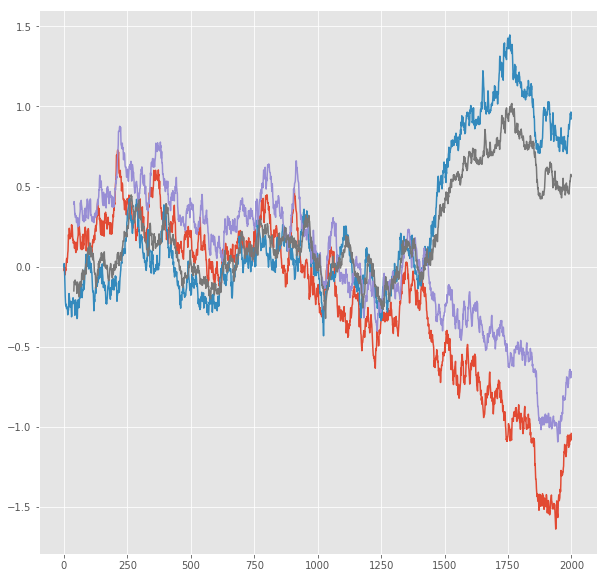

R^2 score for regression on Error: 0.6817
k = 0.9085


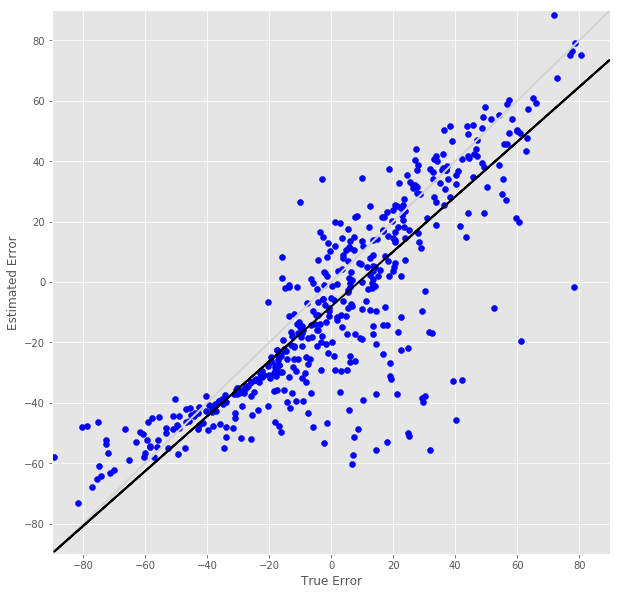

R^2 score for regression on RT: 0.2567
k = 0.6645


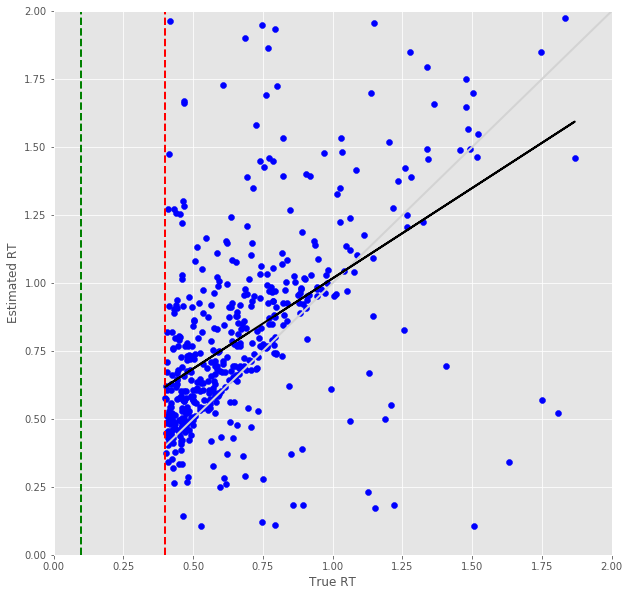

Error Prediction Score: 0.3317 RMSE
RT Prediction Score: 0.3041 RMSE
Error Prediction Corr: 0.8947
RT Prediction Corr: 0.6367
R^2 score for regression on Error: 0.8004
k = 0.9484


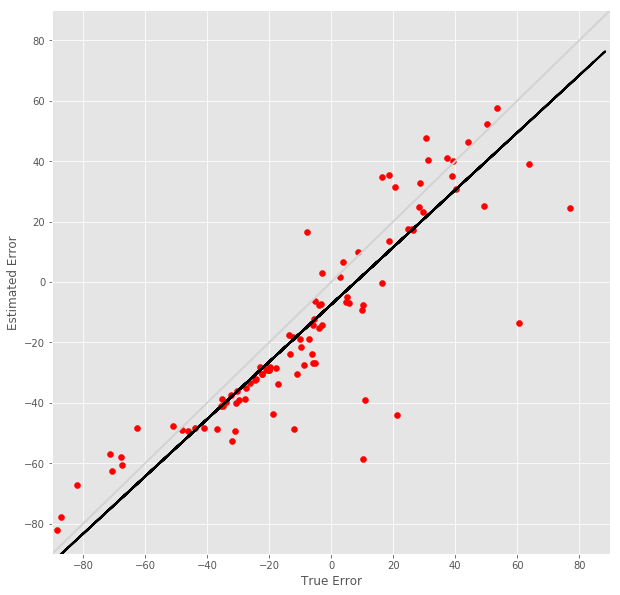

R^2 score for regression on RT: 0.4054
k = 0.6436


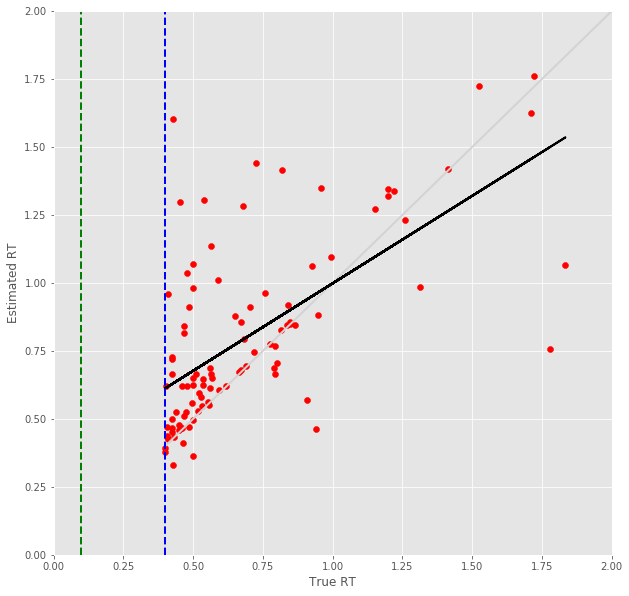

9 -step(s) forecast:
Test Score for 9 -steps forecast: 0.4555 RMSE
Predict Score for 9 -steps forecast: 0.4511 RMSE
Error Test Score for 9 -steps forecast: 0.4152 RMSE
RT Test Score for 9 -steps forecast: 0.3784 RMSE
Error Test Corr for 9 -steps forecast: 0.8152
RT Test Corr for 9 -steps forecast: 0.4417


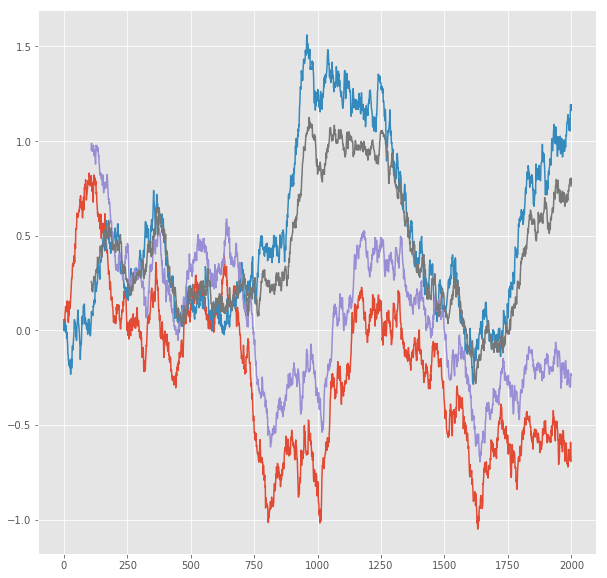

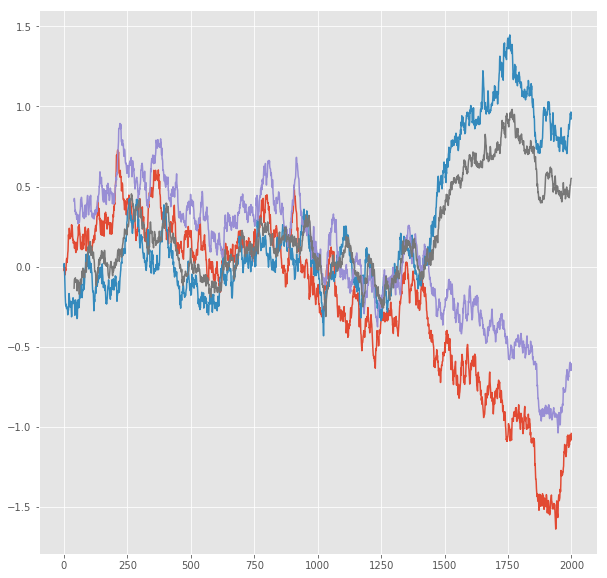

R^2 score for regression on Error: 0.6646
k = 0.8987


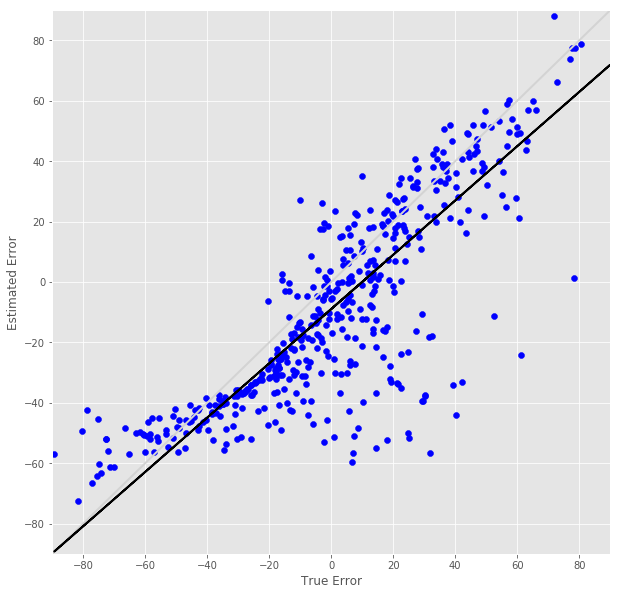

R^2 score for regression on RT: 0.1951
k = 0.6041


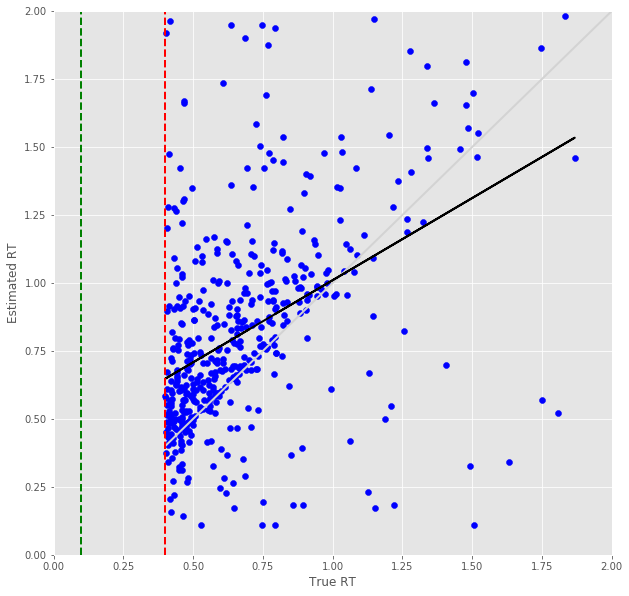

Error Prediction Score: 0.3492 RMSE
RT Prediction Score: 0.3306 RMSE
Error Prediction Corr: 0.8889
RT Prediction Corr: 0.5906
R^2 score for regression on Error: 0.7901
k = 0.9470


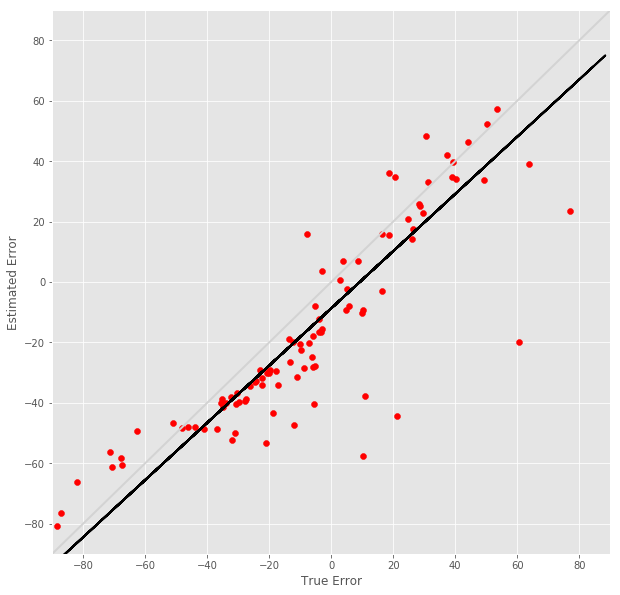

R^2 score for regression on RT: 0.3488
k = 0.6426


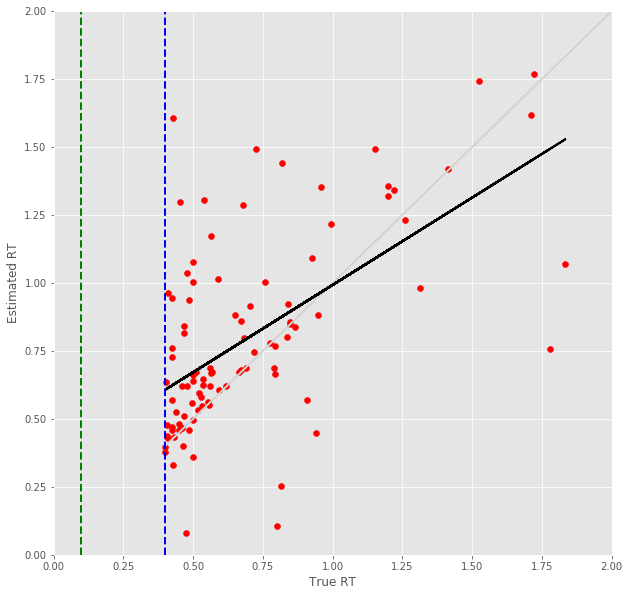

10 -step(s) forecast:
Test Score for 10 -steps forecast: 0.4901 RMSE
Predict Score for 10 -steps forecast: 0.4851 RMSE
Error Test Score for 10 -steps forecast: 0.4506 RMSE
RT Test Score for 10 -steps forecast: 0.4071 RMSE
Error Test Corr for 10 -steps forecast: 0.7970
RT Test Corr for 10 -steps forecast: 0.3330


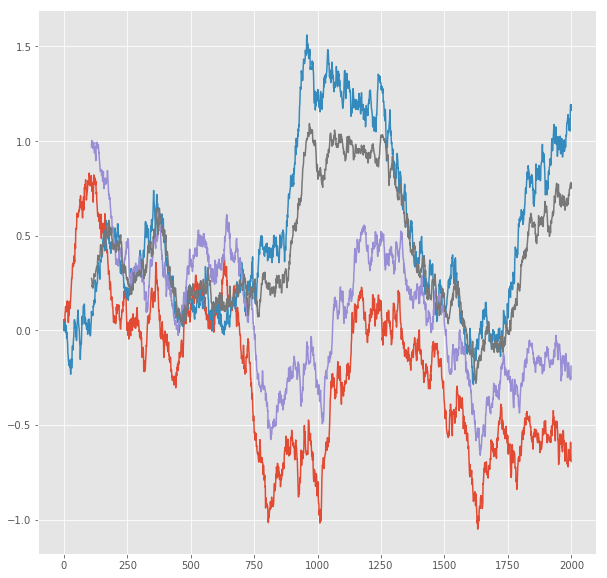

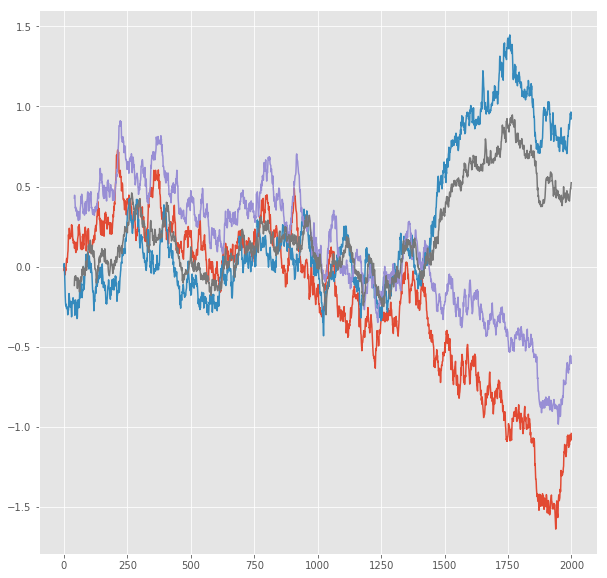

R^2 score for regression on Error: 0.6352
k = 0.9087


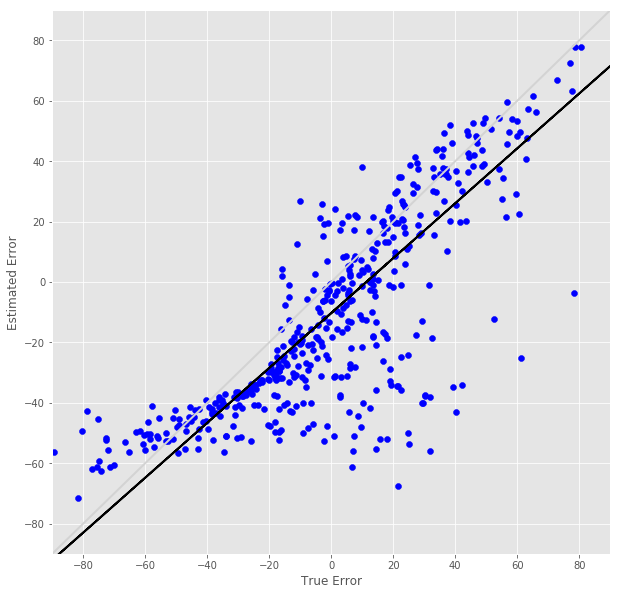

R^2 score for regression on RT: 0.1109
k = 0.4622


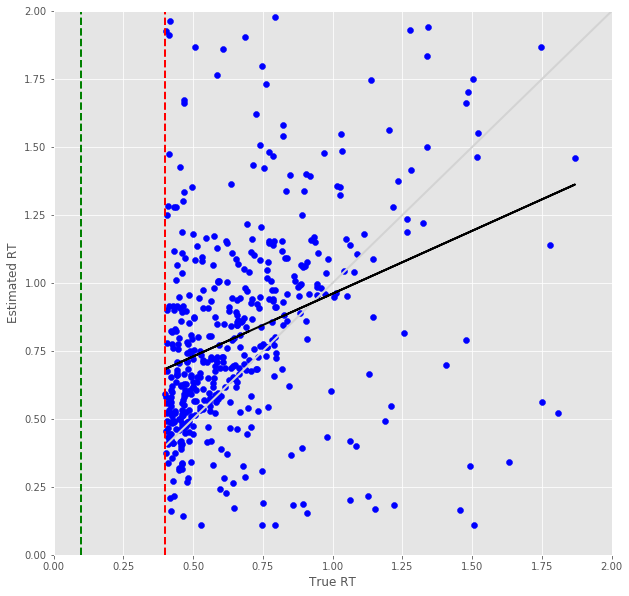

Error Prediction Score: 0.3784 RMSE
RT Prediction Score: 0.3477 RMSE
Error Prediction Corr: 0.8741
RT Prediction Corr: 0.5610
R^2 score for regression on Error: 0.7640
k = 0.9385


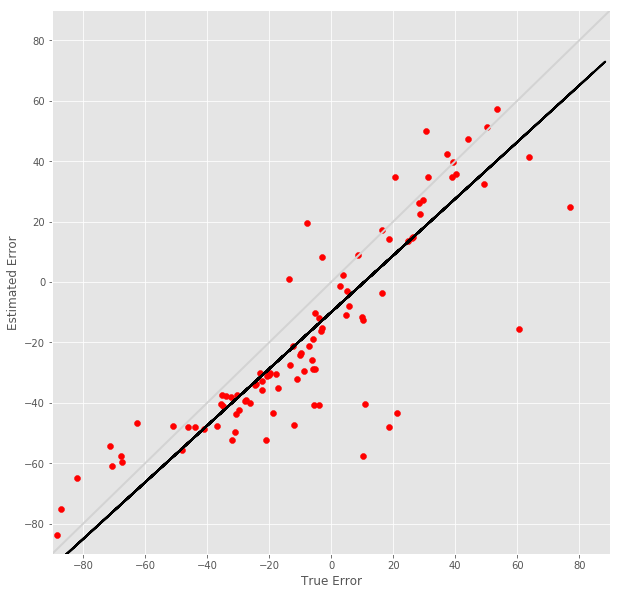

R^2 score for regression on RT: 0.3148
k = 0.6335


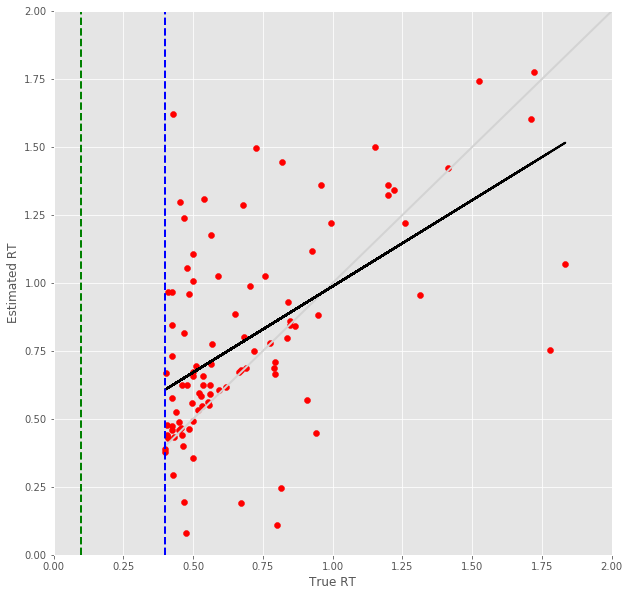

11 -step(s) forecast:
Test Score for 11 -steps forecast: 0.5231 RMSE
Predict Score for 11 -steps forecast: 0.5176 RMSE
Error Test Score for 11 -steps forecast: 0.4696 RMSE
RT Test Score for 11 -steps forecast: 0.4436 RMSE
Error Test Corr for 11 -steps forecast: 0.7883
RT Test Corr for 11 -steps forecast: 0.2402


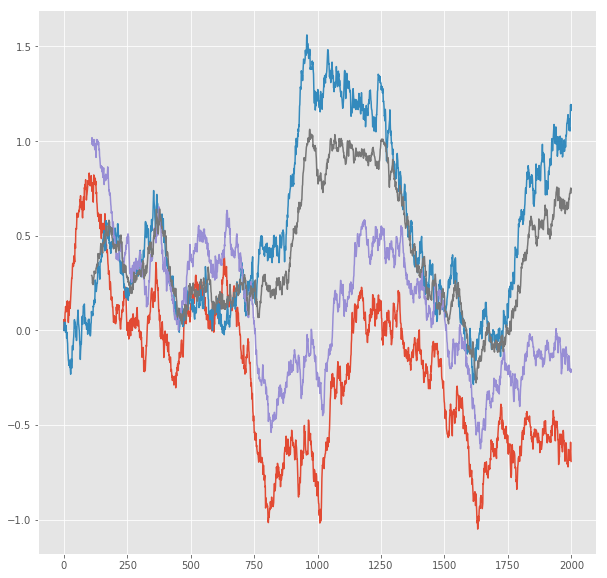

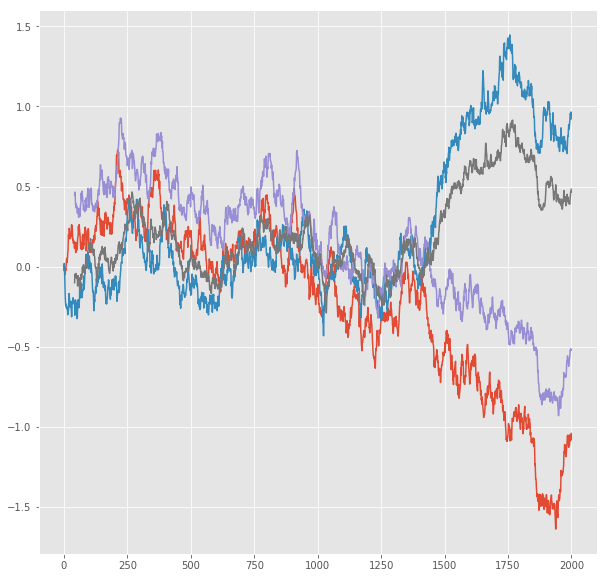

R^2 score for regression on Error: 0.6214
k = 0.8998


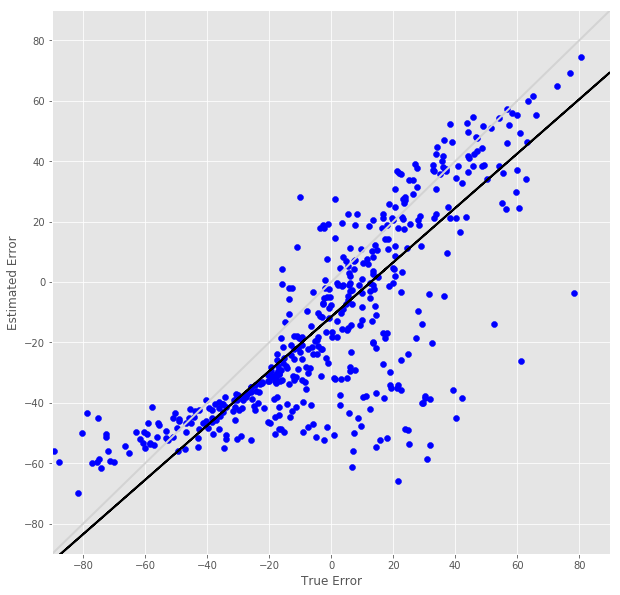

R^2 score for regression on RT: 0.0577
k = 0.3484


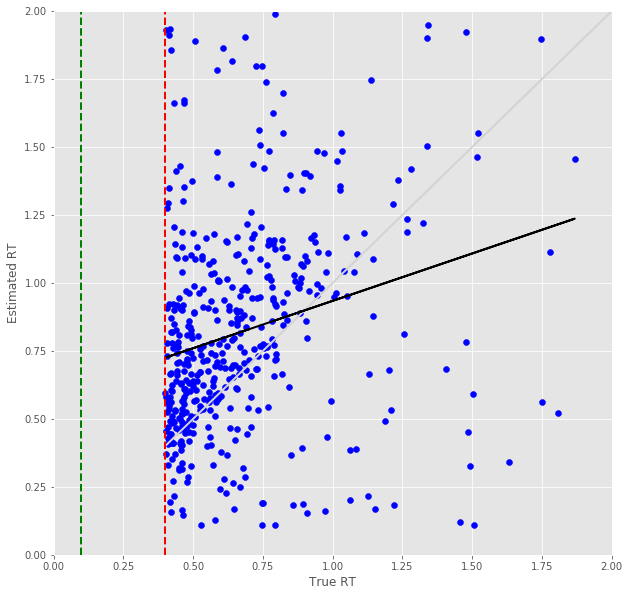

Error Prediction Score: 0.3868 RMSE
RT Prediction Score: 0.3696 RMSE
Error Prediction Corr: 0.8714
RT Prediction Corr: 0.5235
R^2 score for regression on Error: 0.7593
k = 0.9298


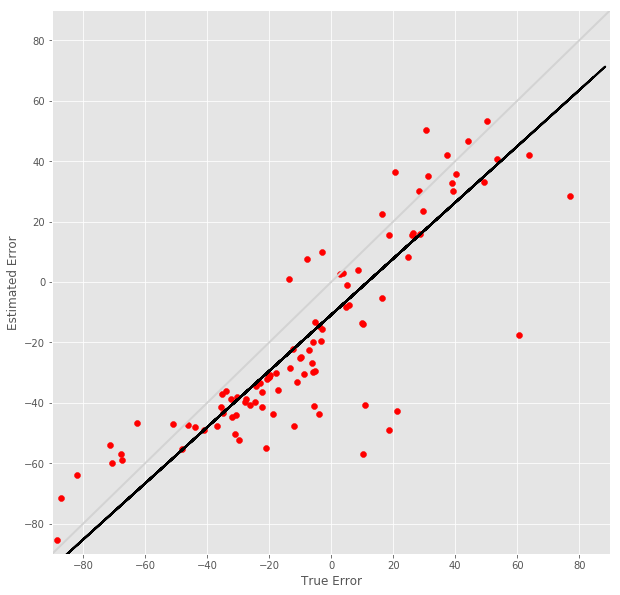

R^2 score for regression on RT: 0.2741
k = 0.6115


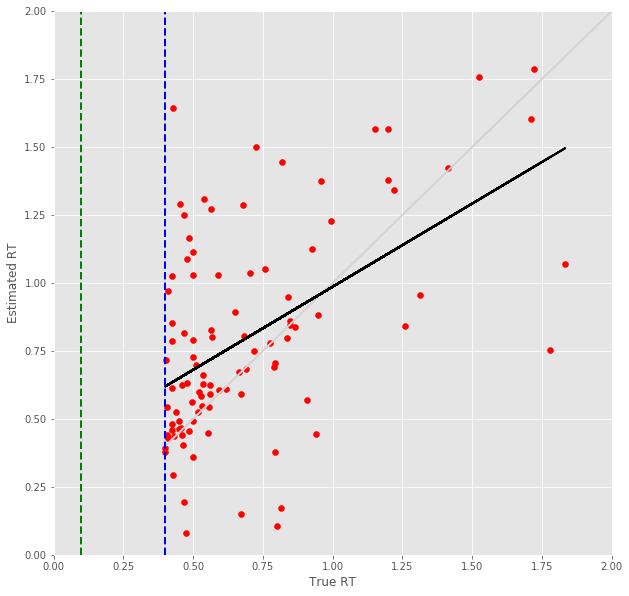

12 -step(s) forecast:
Test Score for 12 -steps forecast: 0.5547 RMSE
Predict Score for 12 -steps forecast: 0.5487 RMSE
Error Test Score for 12 -steps forecast: 0.4970 RMSE
RT Test Score for 12 -steps forecast: 0.4718 RMSE
Error Test Corr for 12 -steps forecast: 0.7789
RT Test Corr for 12 -steps forecast: 0.1463


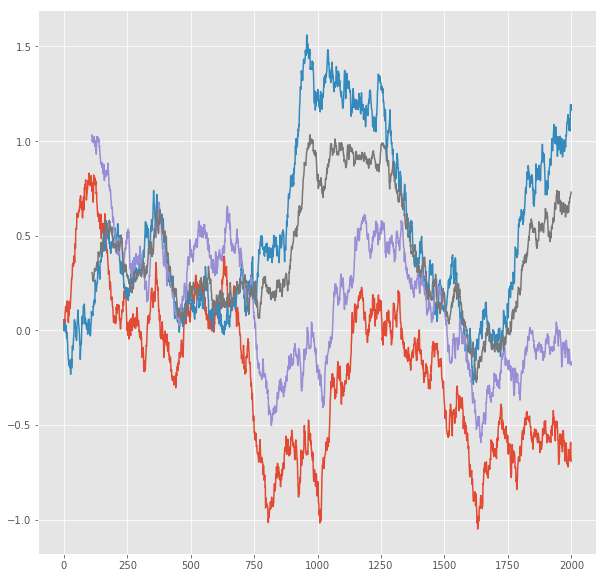

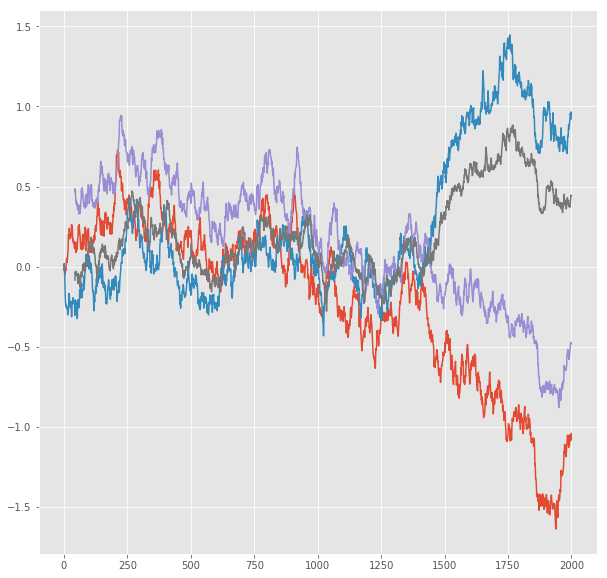

R^2 score for regression on Error: 0.6067
k = 0.9350


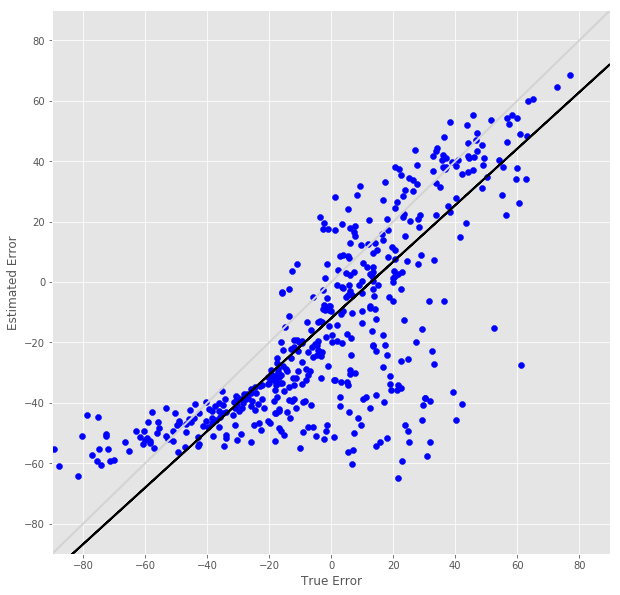

R^2 score for regression on RT: 0.0214
k = 0.2197


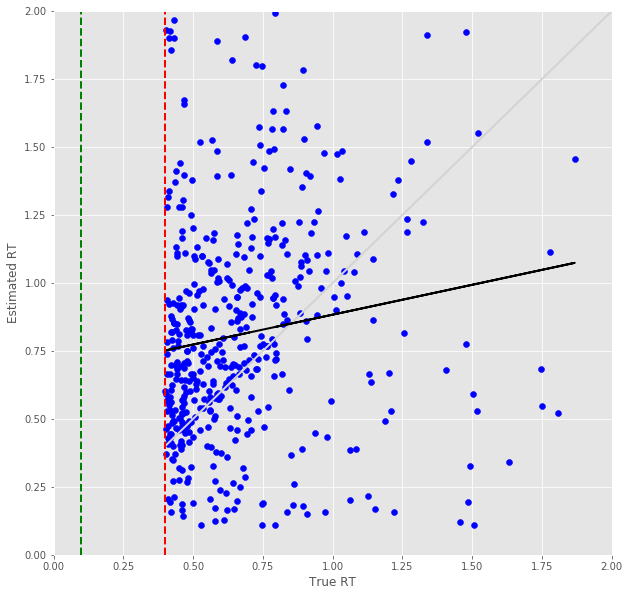

Error Prediction Score: 0.4188 RMSE
RT Prediction Score: 0.4472 RMSE
Error Prediction Corr: 0.8585
RT Prediction Corr: 0.3242
R^2 score for regression on Error: 0.7371
k = 0.9210


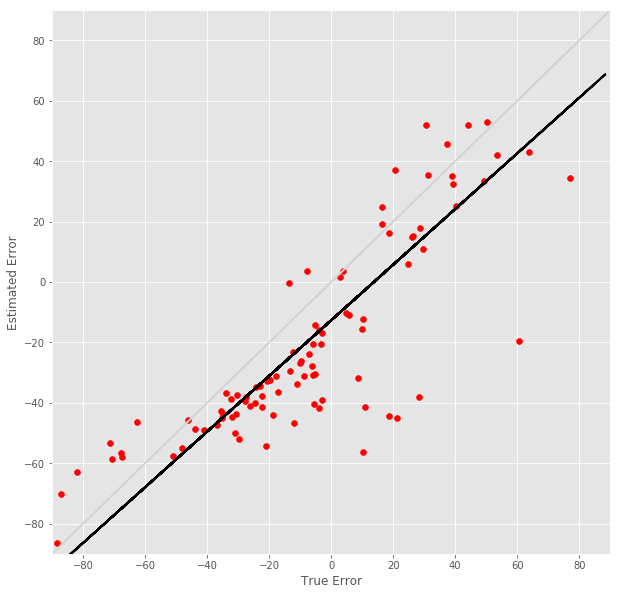

R^2 score for regression on RT: 0.1051
k = 0.4110


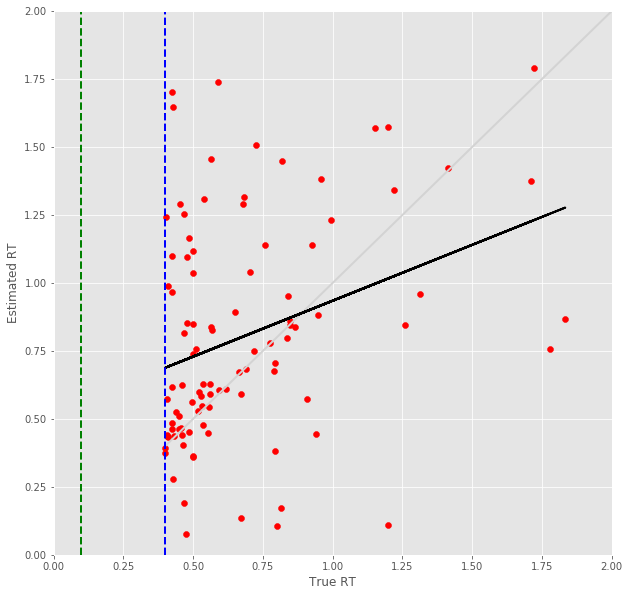

13 -step(s) forecast:
Test Score for 13 -steps forecast: 0.5851 RMSE
Predict Score for 13 -steps forecast: 0.5785 RMSE
Error Test Score for 13 -steps forecast: 0.5260 RMSE
RT Test Score for 13 -steps forecast: 0.4951 RMSE
Error Test Corr for 13 -steps forecast: 0.7680
RT Test Corr for 13 -steps forecast: 0.0963


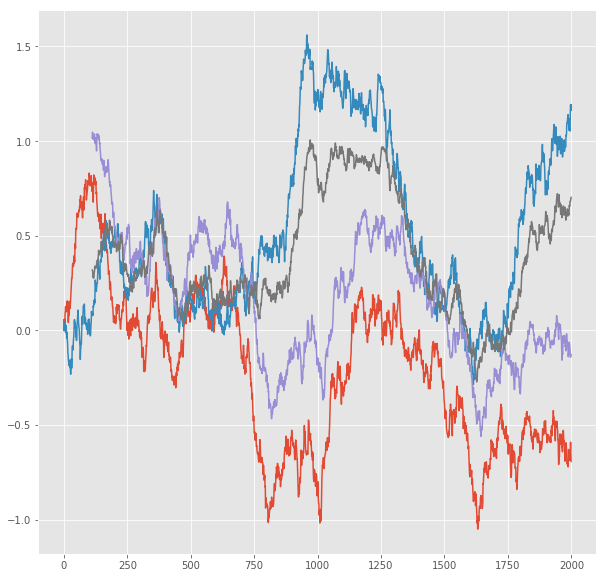

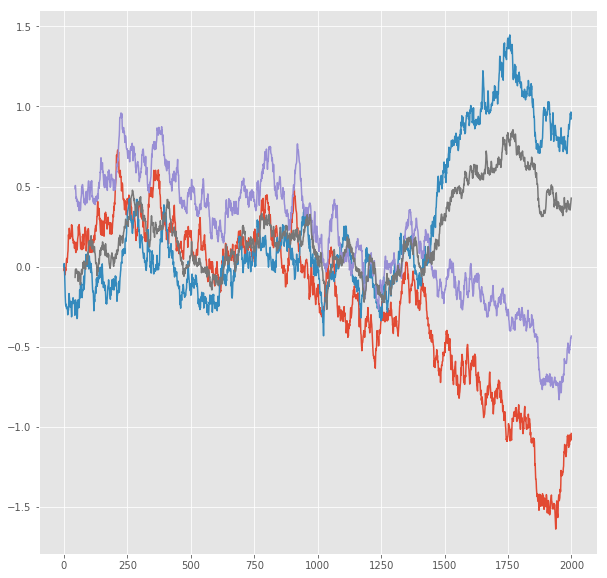

R^2 score for regression on Error: 0.5898
k = 0.9593


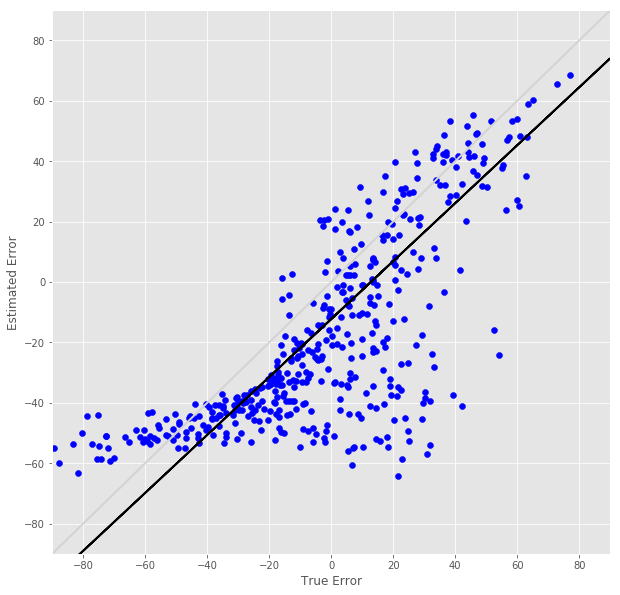

R^2 score for regression on RT: 0.0093
k = 0.1517


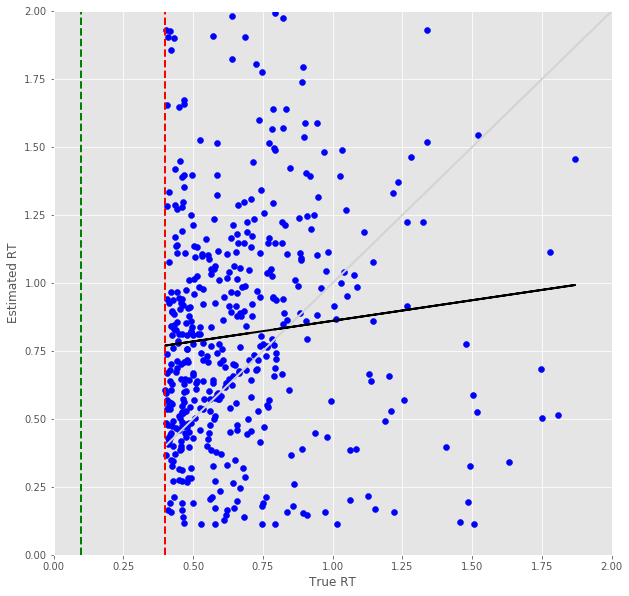

Error Prediction Score: 0.4354 RMSE
RT Prediction Score: 0.4754 RMSE
Error Prediction Corr: 0.8506
RT Prediction Corr: 0.2351
R^2 score for regression on Error: 0.7234
k = 0.9133


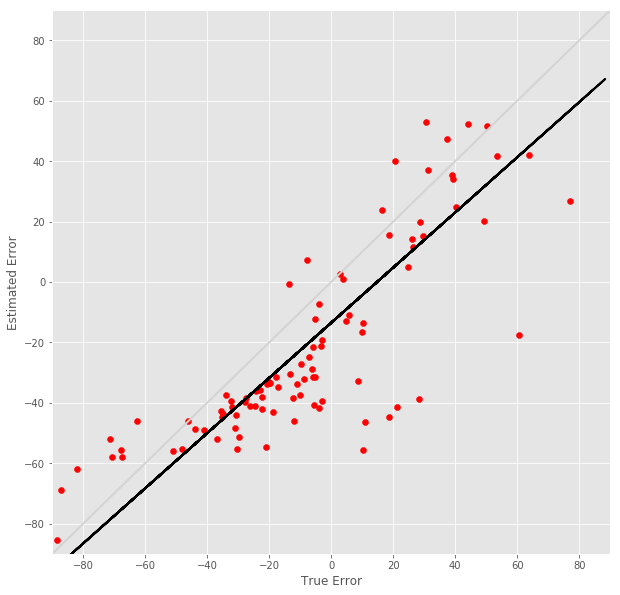

R^2 score for regression on RT: 0.0552
k = 0.3033


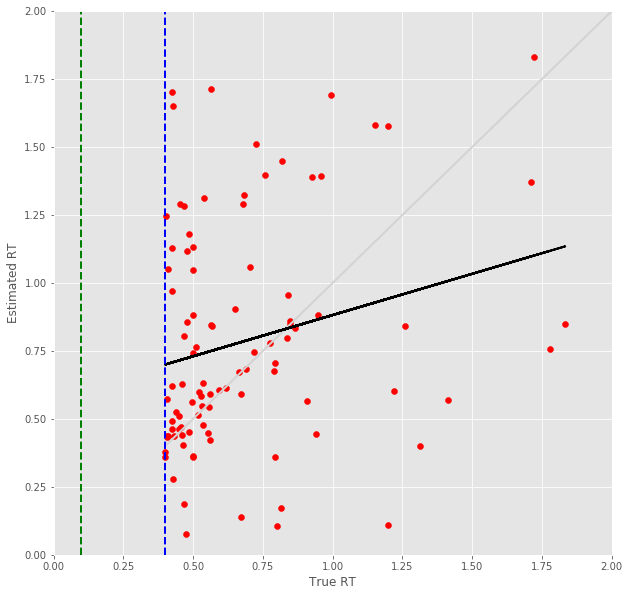

14 -step(s) forecast:
Test Score for 14 -steps forecast: 0.6142 RMSE
Predict Score for 14 -steps forecast: 0.6072 RMSE
Error Test Score for 14 -steps forecast: 0.5502 RMSE
RT Test Score for 14 -steps forecast: 0.5171 RMSE
Error Test Corr for 14 -steps forecast: 0.7576
RT Test Corr for 14 -steps forecast: 0.0556


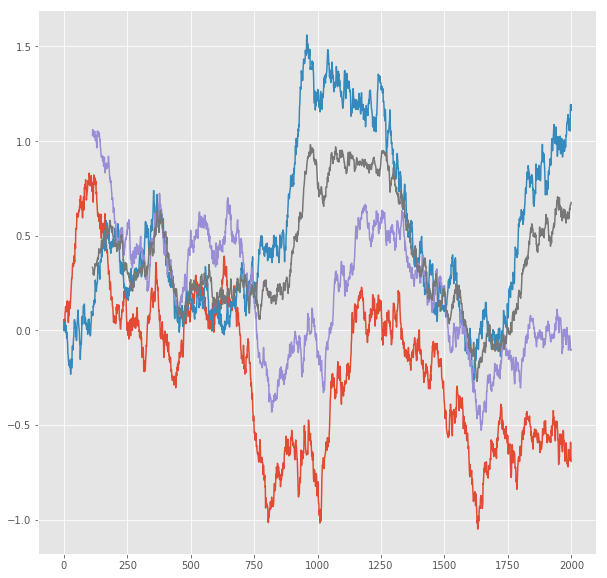

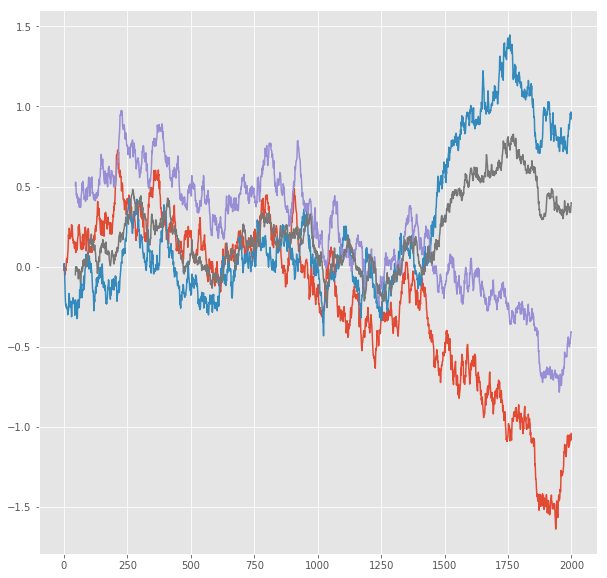

R^2 score for regression on Error: 0.5739
k = 0.9652


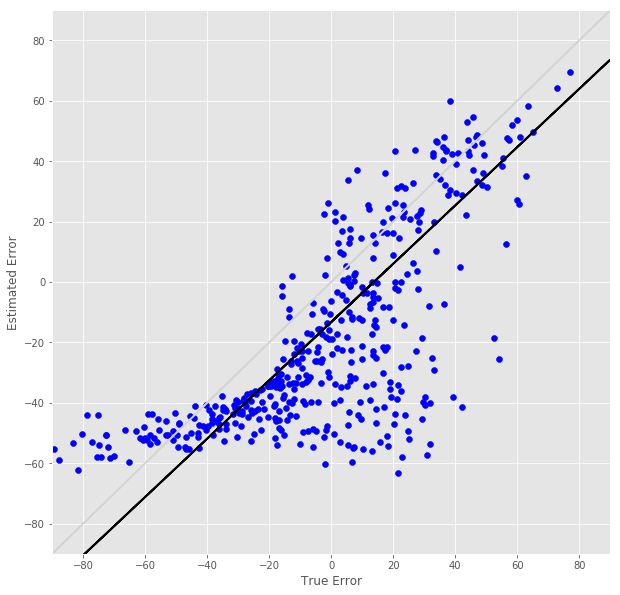

R^2 score for regression on RT: 0.0031
k = 0.0897


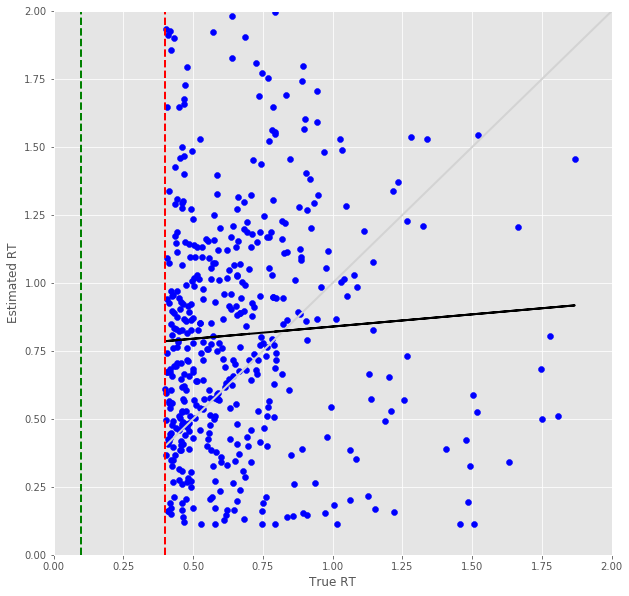

Error Prediction Score: 0.4798 RMSE
RT Prediction Score: 0.5090 RMSE
Error Prediction Corr: 0.8233
RT Prediction Corr: 0.1648
R^2 score for regression on Error: 0.6778
k = 0.9016


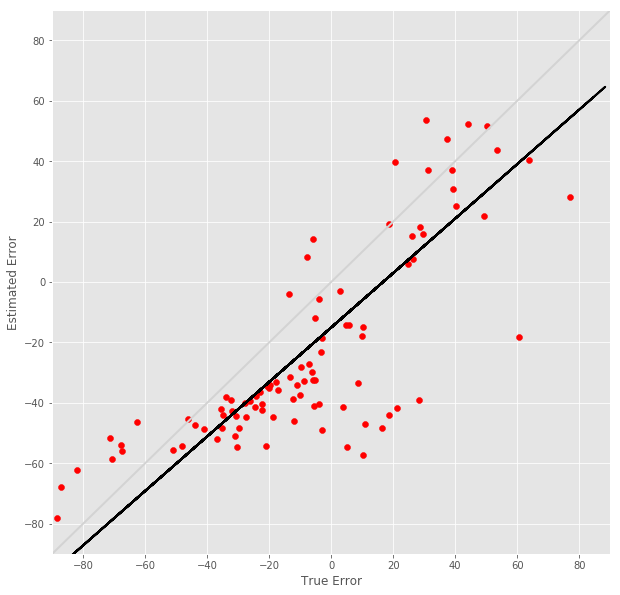

R^2 score for regression on RT: 0.0272
k = 0.2154


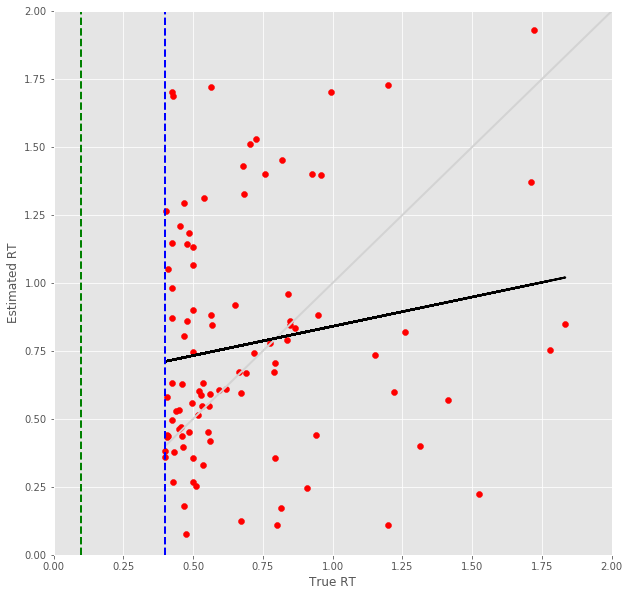

15 -step(s) forecast:
Test Score for 15 -steps forecast: 0.6422 RMSE
Predict Score for 15 -steps forecast: 0.6347 RMSE
Error Test Score for 15 -steps forecast: 0.5694 RMSE
RT Test Score for 15 -steps forecast: 0.5306 RMSE
Error Test Corr for 15 -steps forecast: 0.7495
RT Test Corr for 15 -steps forecast: 0.0472


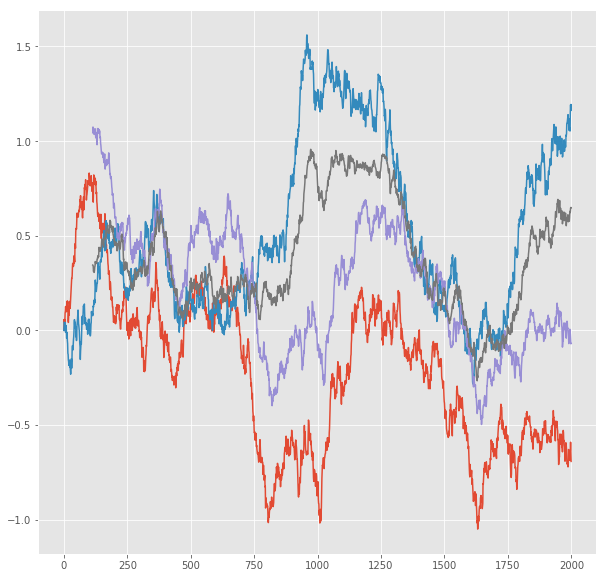

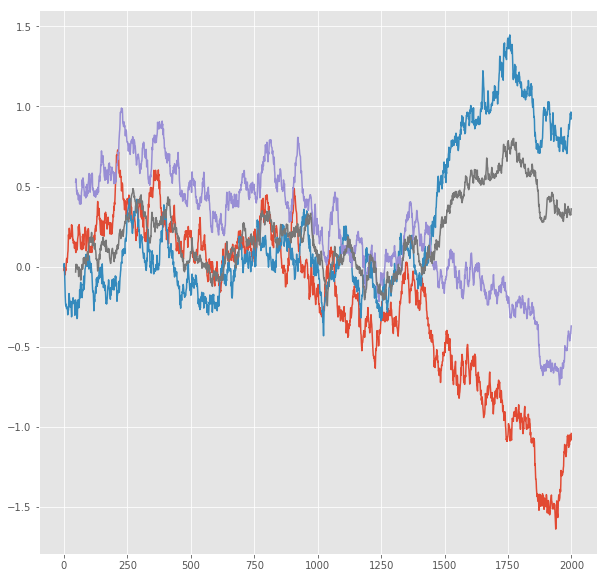

R^2 score for regression on Error: 0.5618
k = 0.9659


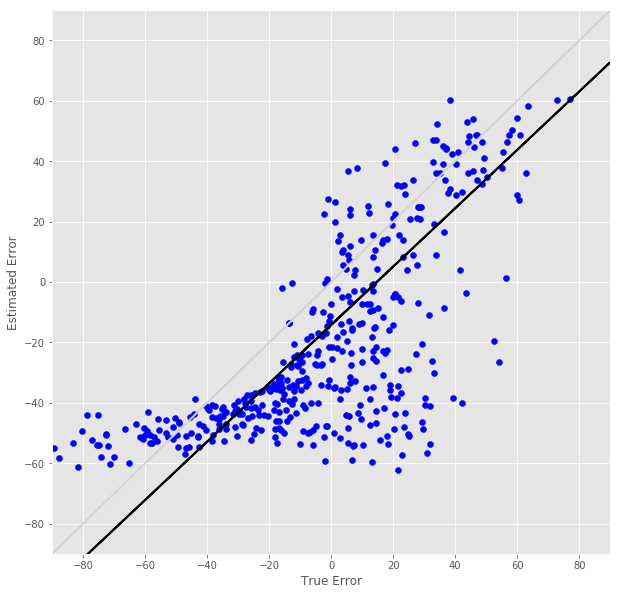

R^2 score for regression on RT: 0.0022
k = 0.0786


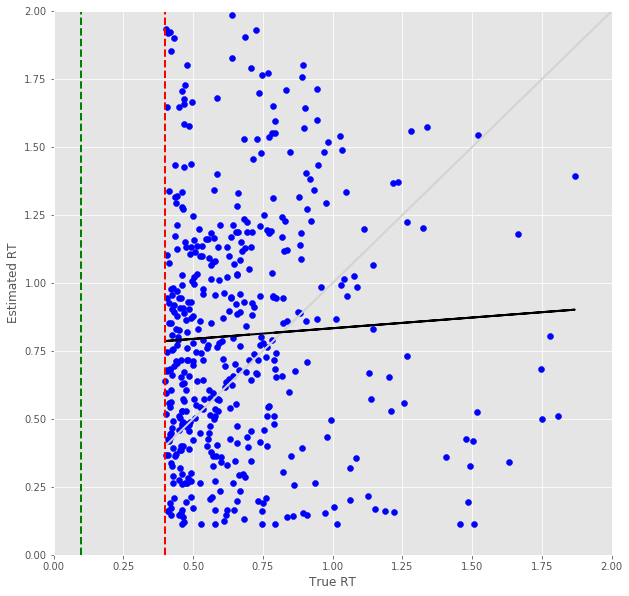

Error Prediction Score: 0.4938 RMSE
RT Prediction Score: 0.5306 RMSE
Error Prediction Corr: 0.8108
RT Prediction Corr: 0.1307
R^2 score for regression on Error: 0.6574
k = 0.8978


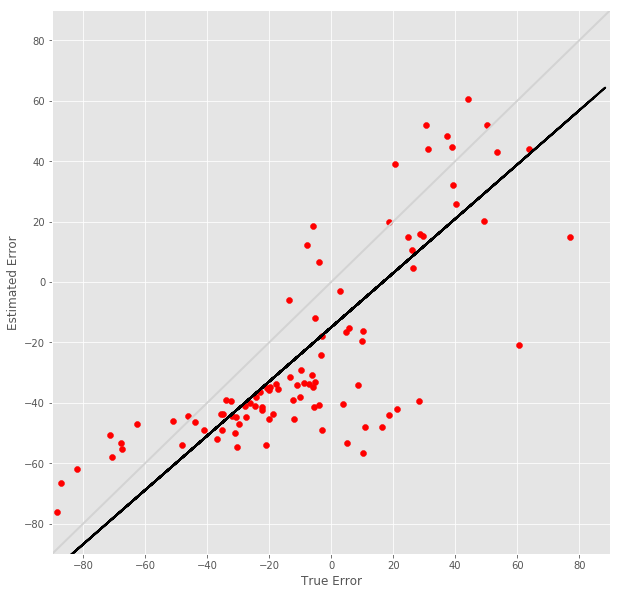

R^2 score for regression on RT: 0.0171
k = 0.1763


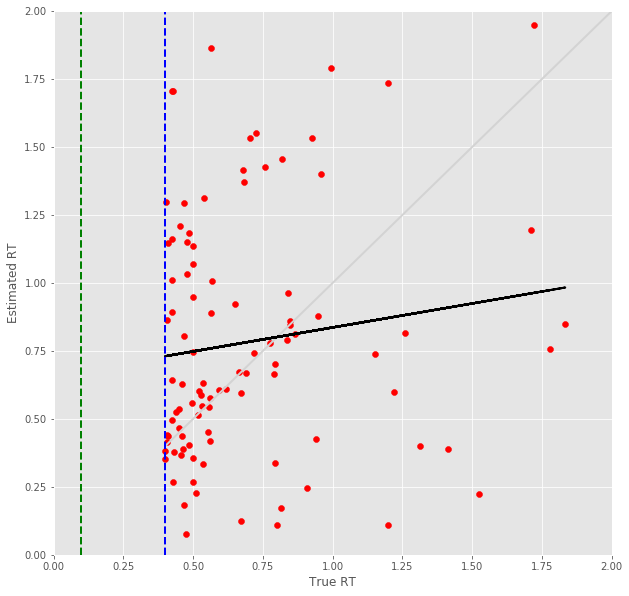

16 -step(s) forecast:
Test Score for 16 -steps forecast: 0.6692 RMSE
Predict Score for 16 -steps forecast: 0.6612 RMSE
Error Test Score for 16 -steps forecast: 0.6035 RMSE
RT Test Score for 16 -steps forecast: 0.5601 RMSE
Error Test Corr for 16 -steps forecast: 0.7294
RT Test Corr for 16 -steps forecast: 0.0004


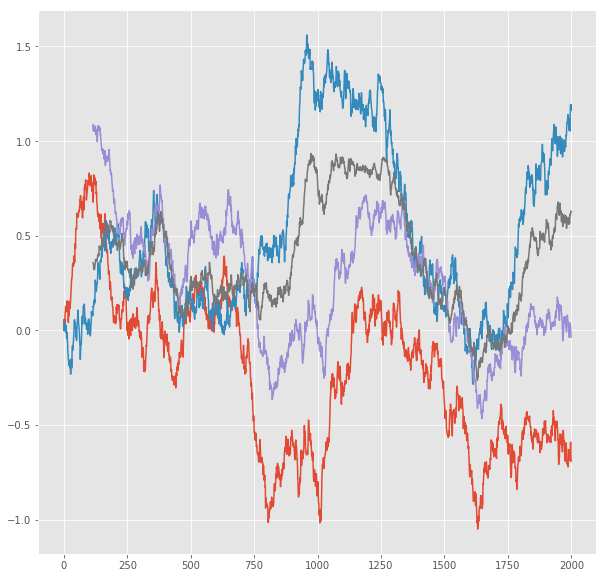

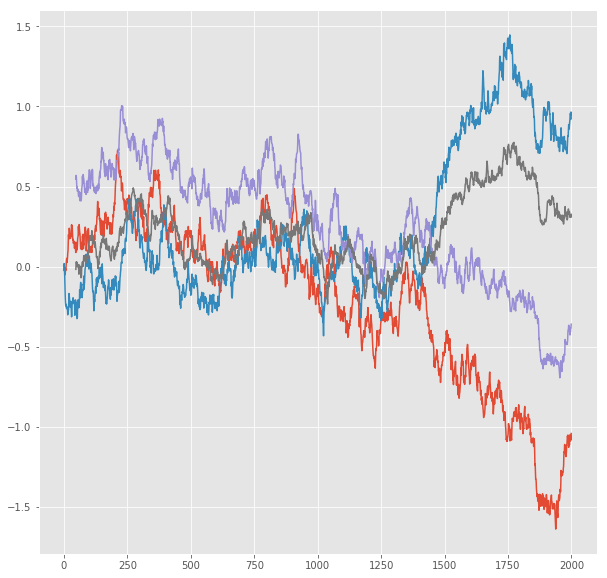

R^2 score for regression on Error: 0.5320
k = 0.9640


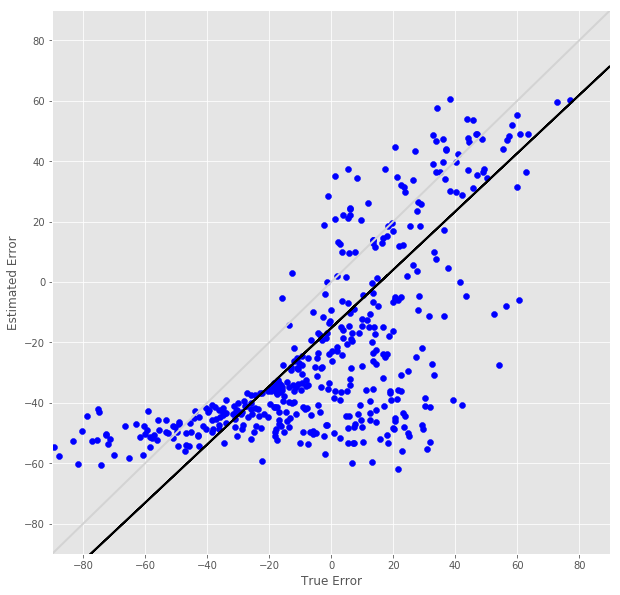

R^2 score for regression on RT: 0.0000
k = 0.0007


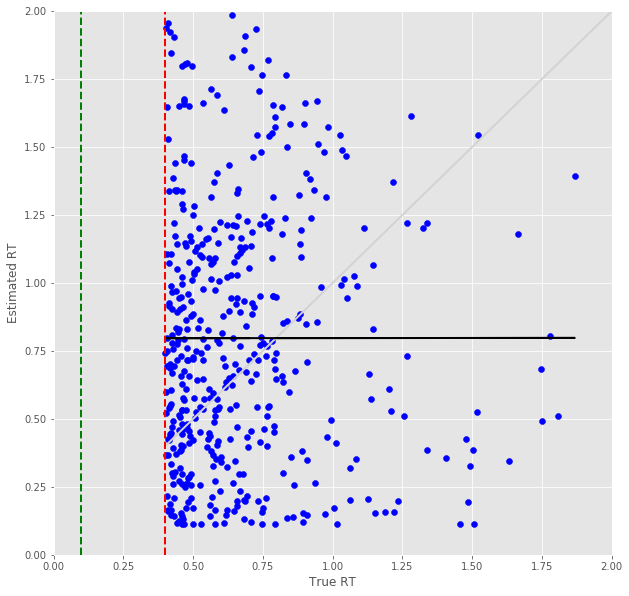

Error Prediction Score: 0.5247 RMSE
RT Prediction Score: 0.5449 RMSE
Error Prediction Corr: 0.7943
RT Prediction Corr: 0.1224
R^2 score for regression on Error: 0.6310
k = 0.9225


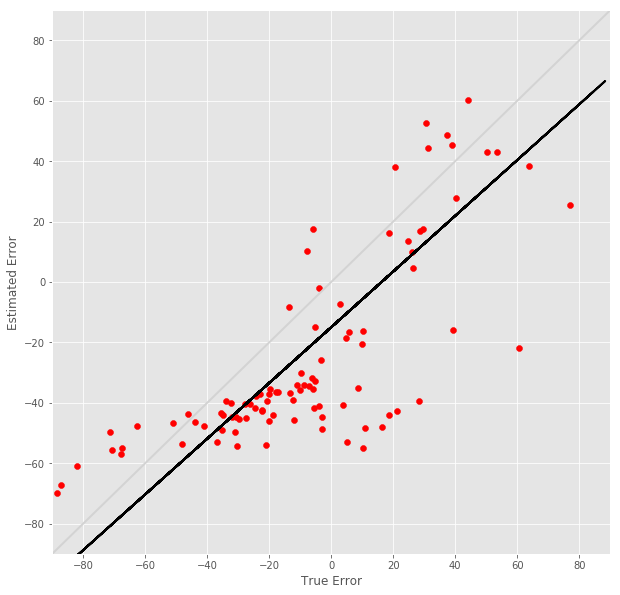

R^2 score for regression on RT: 0.0150
k = 0.1717


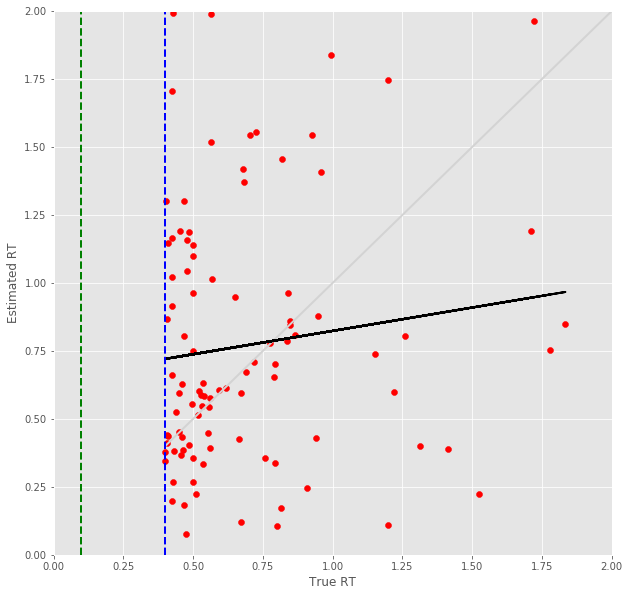

17 -step(s) forecast:
Test Score for 17 -steps forecast: 0.6952 RMSE
Predict Score for 17 -steps forecast: 0.6868 RMSE
Error Test Score for 17 -steps forecast: 0.6254 RMSE
RT Test Score for 17 -steps forecast: 0.5760 RMSE
Error Test Corr for 17 -steps forecast: 0.7154
RT Test Corr for 17 -steps forecast: -0.0012


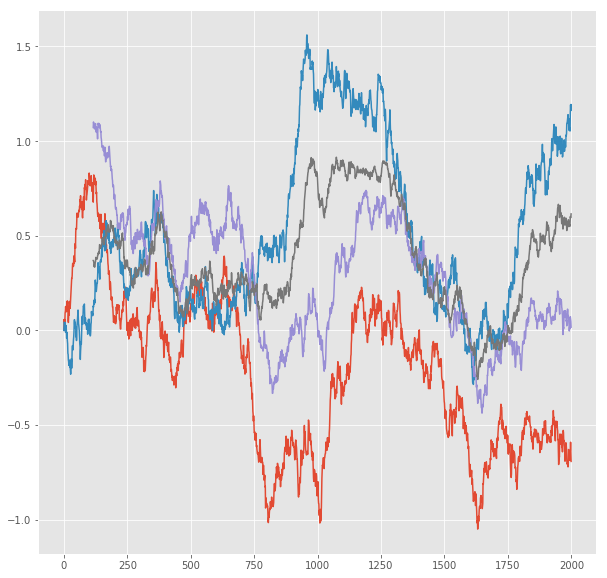

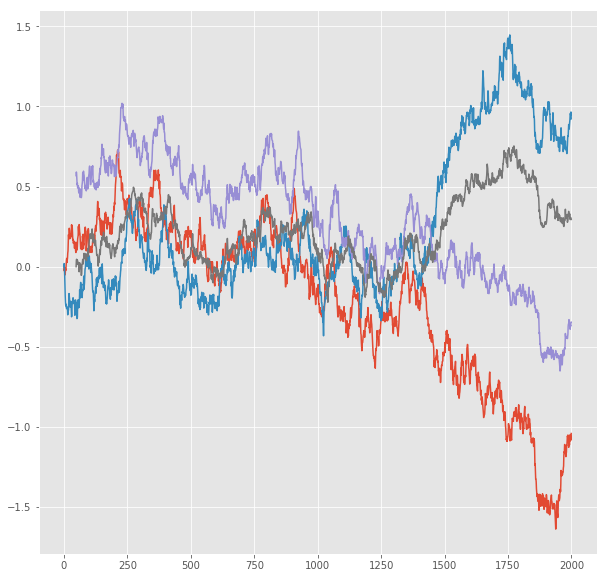

R^2 score for regression on Error: 0.5117
k = 0.9567


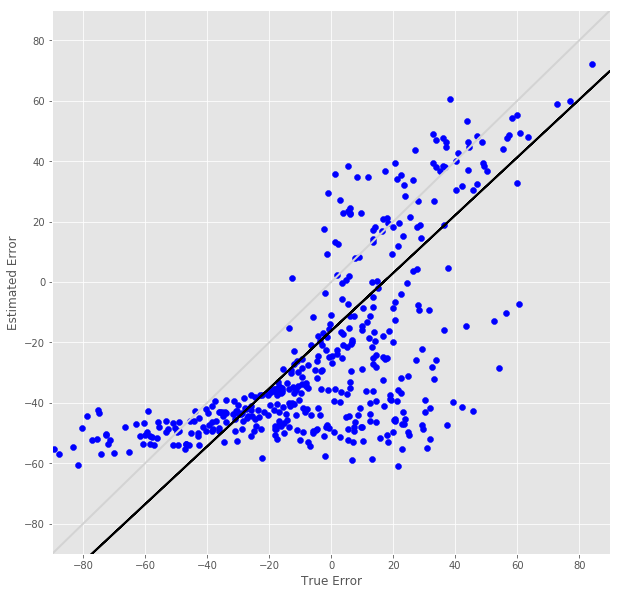

R^2 score for regression on RT: 0.0000
k = -0.0020


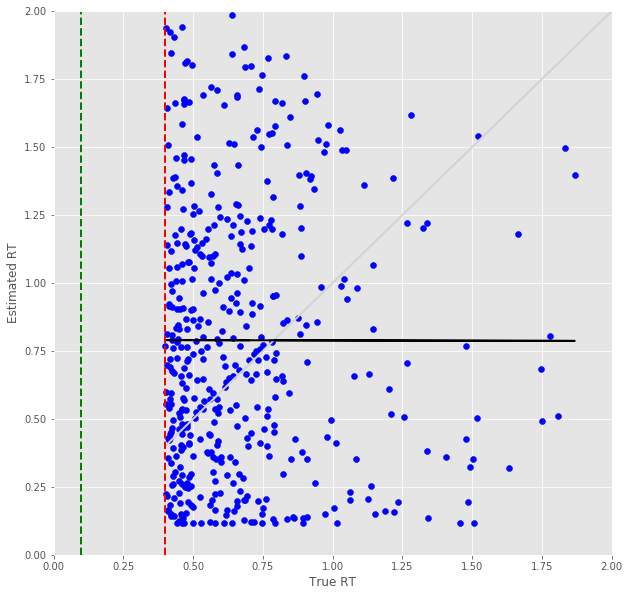

Error Prediction Score: 0.5567 RMSE
RT Prediction Score: 0.5691 RMSE
Error Prediction Corr: 0.7717
RT Prediction Corr: 0.0988
R^2 score for regression on Error: 0.5956
k = 0.9286


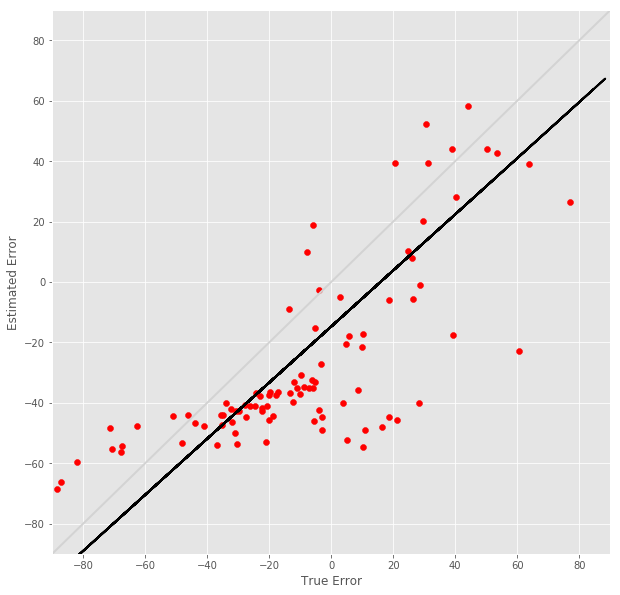

R^2 score for regression on RT: 0.0098
k = 0.1450


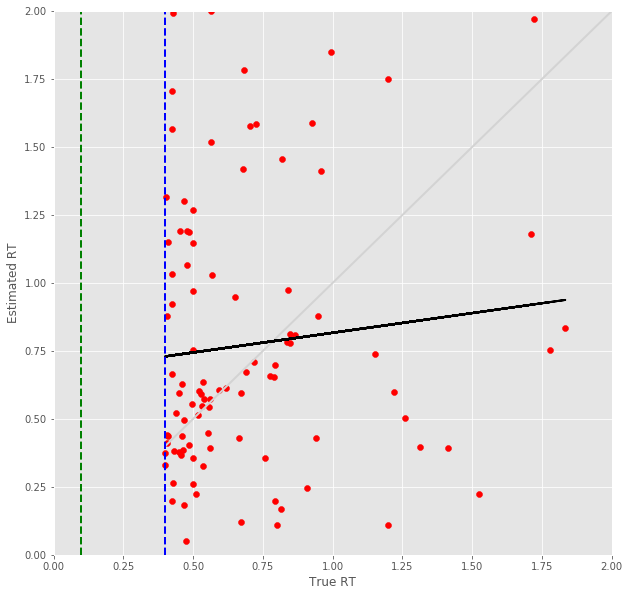

18 -step(s) forecast:
Test Score for 18 -steps forecast: 0.7202 RMSE
Predict Score for 18 -steps forecast: 0.7114 RMSE
Error Test Score for 18 -steps forecast: 0.6359 RMSE
RT Test Score for 18 -steps forecast: 0.5942 RMSE
Error Test Corr for 18 -steps forecast: 0.7112
RT Test Corr for 18 -steps forecast: -0.0309


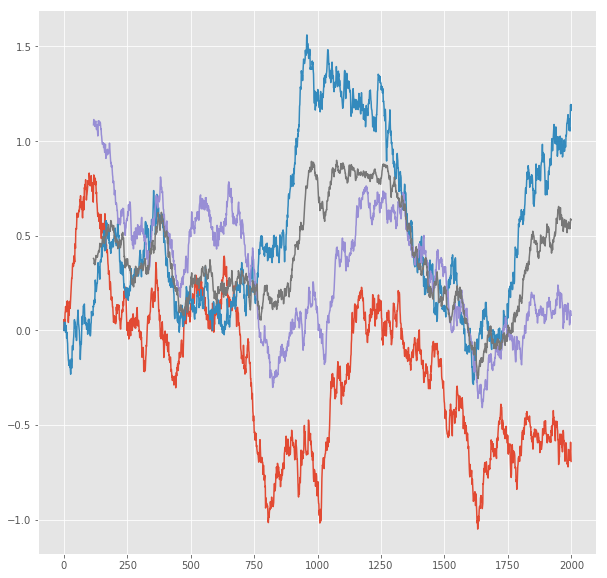

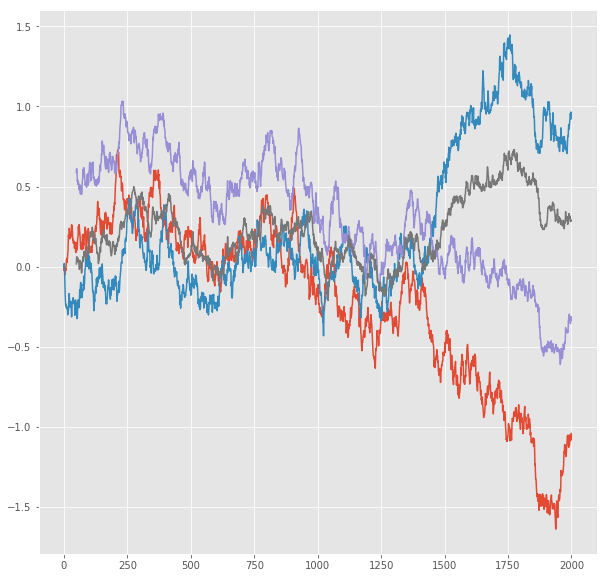

R^2 score for regression on Error: 0.5058
k = 0.9553


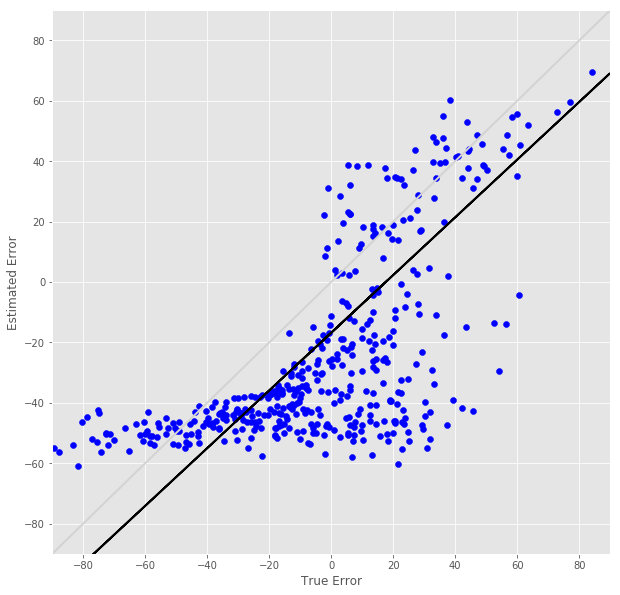

R^2 score for regression on RT: 0.0010
k = -0.0556


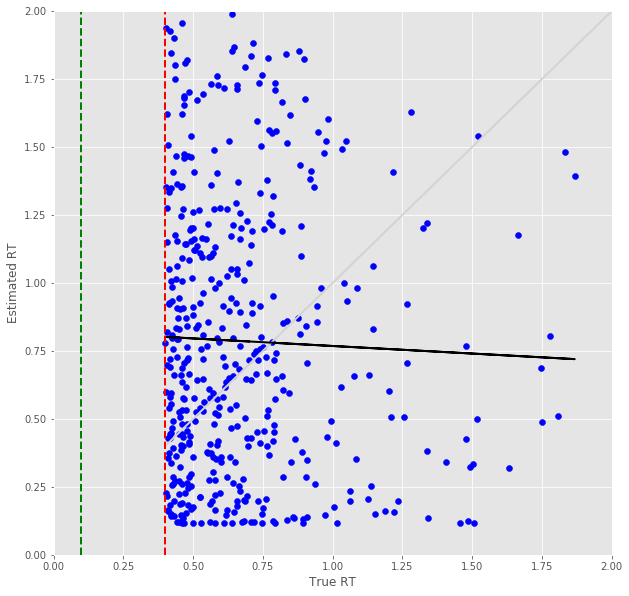

Error Prediction Score: 0.5718 RMSE
RT Prediction Score: 0.5788 RMSE
Error Prediction Corr: 0.7560
RT Prediction Corr: 0.0265
R^2 score for regression on Error: 0.5716
k = 0.9359


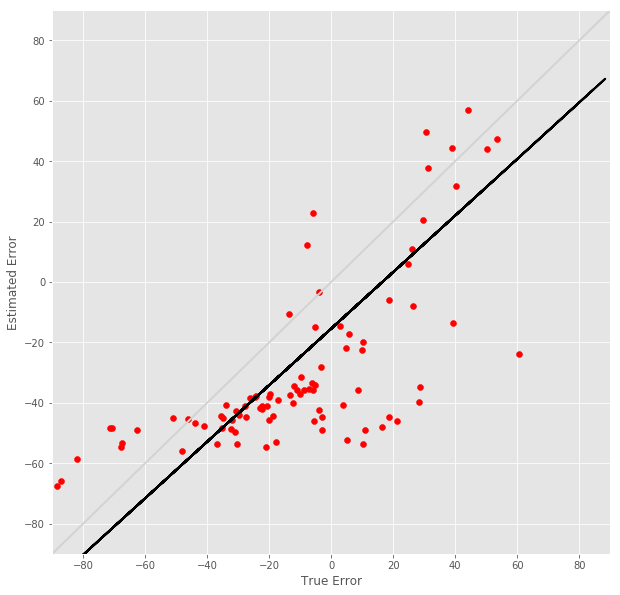

R^2 score for regression on RT: 0.0007
k = 0.0404


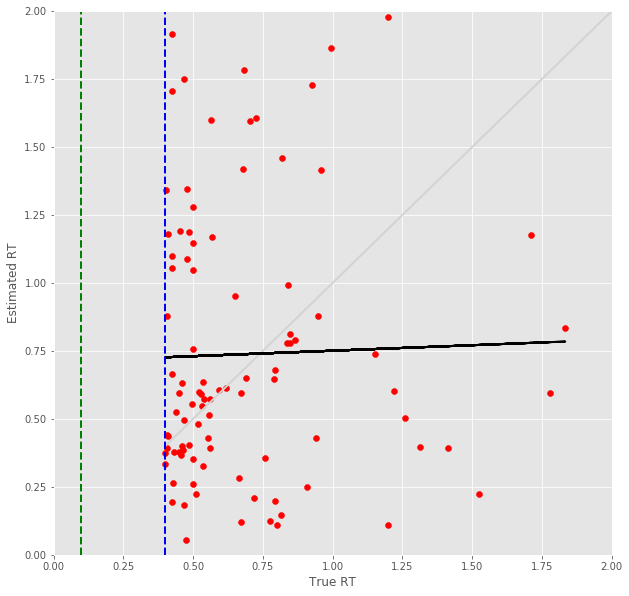

19 -step(s) forecast:
Test Score for 19 -steps forecast: 0.7444 RMSE
Predict Score for 19 -steps forecast: 0.7352 RMSE
Error Test Score for 19 -steps forecast: 0.6557 RMSE
RT Test Score for 19 -steps forecast: 0.5935 RMSE
Error Test Corr for 19 -steps forecast: 0.7035
RT Test Corr for 19 -steps forecast: -0.0351


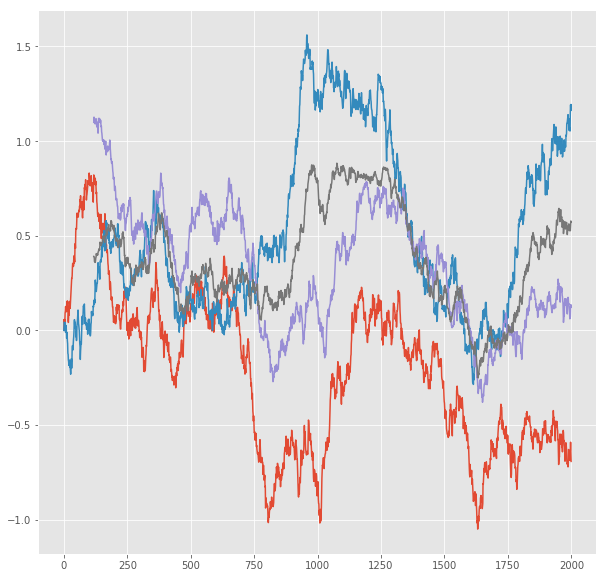

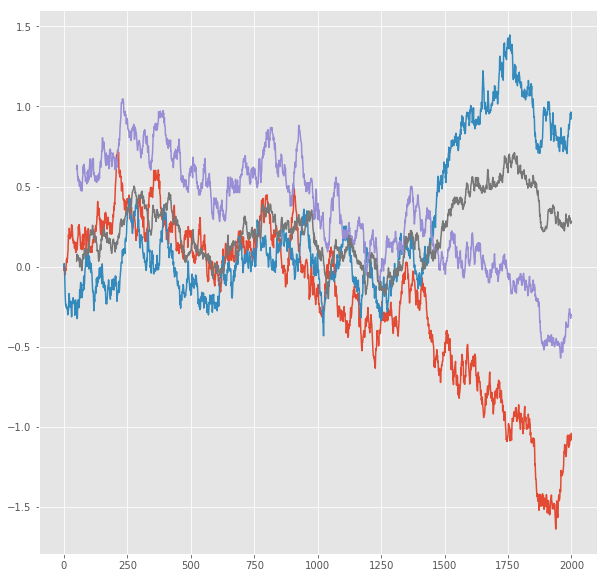

R^2 score for regression on Error: 0.4949
k = 0.9601


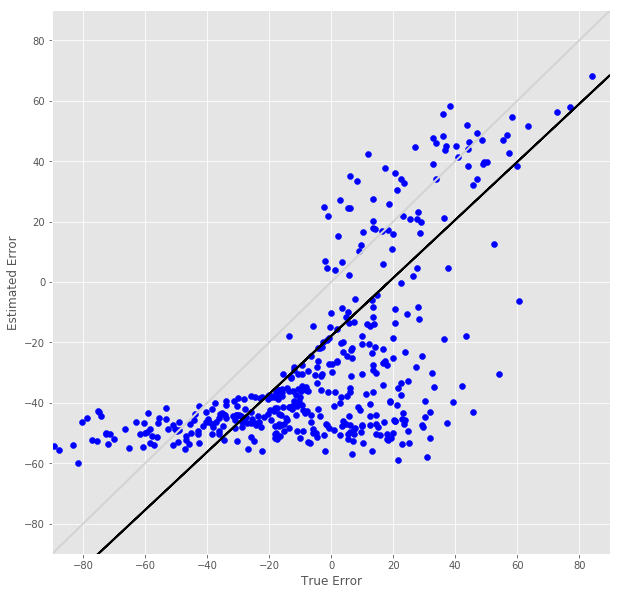

R^2 score for regression on RT: 0.0012
k = -0.0627


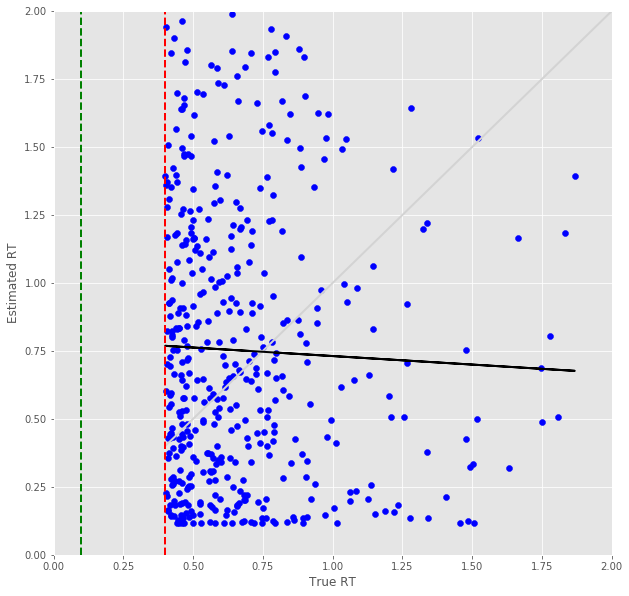

Error Prediction Score: 0.6025 RMSE
RT Prediction Score: 0.5687 RMSE
Error Prediction Corr: 0.7369
RT Prediction Corr: -0.0441
R^2 score for regression on Error: 0.5430
k = 0.8967


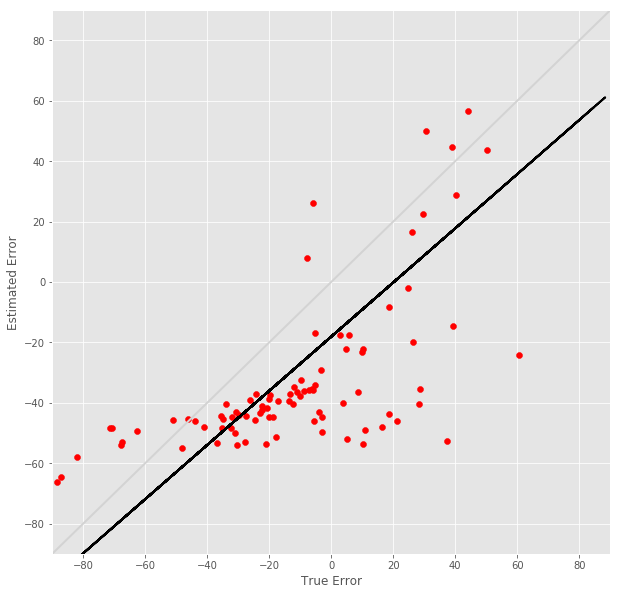

R^2 score for regression on RT: 0.0019
k = -0.0625


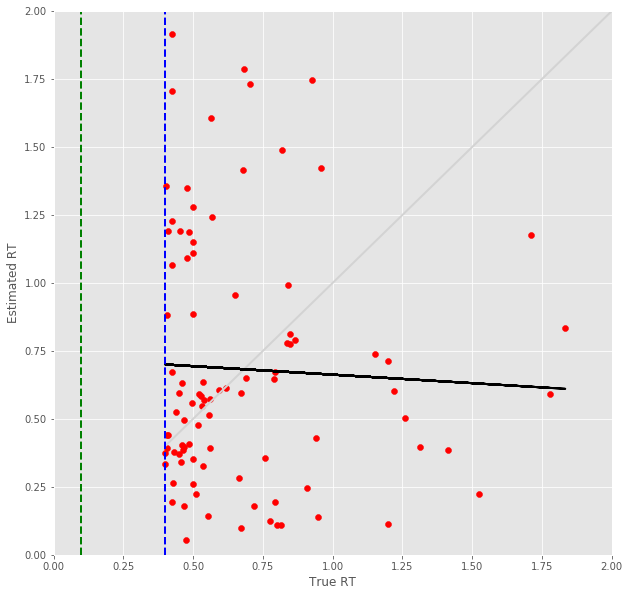

20 -step(s) forecast:
Test Score for 20 -steps forecast: 0.7678 RMSE
Predict Score for 20 -steps forecast: 0.7582 RMSE
Error Test Score for 20 -steps forecast: 0.6789 RMSE
RT Test Score for 20 -steps forecast: 0.6158 RMSE
Error Test Corr for 20 -steps forecast: 0.6953
RT Test Corr for 20 -steps forecast: -0.0823


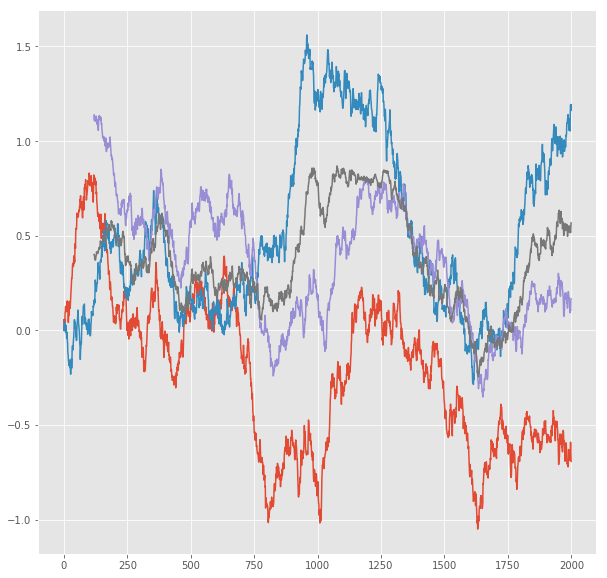

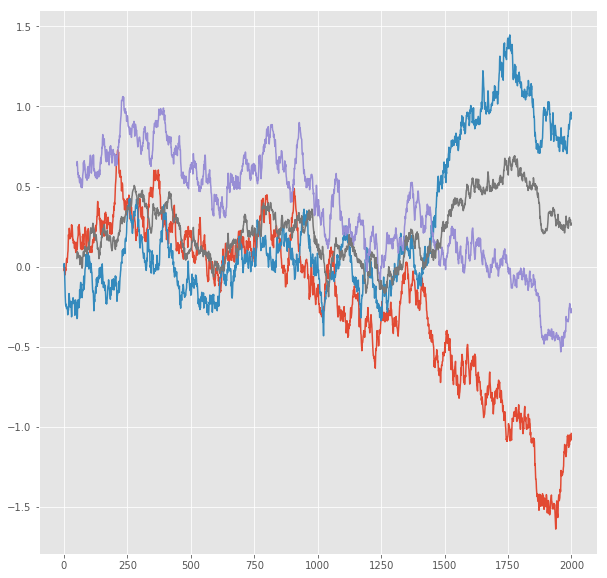

R^2 score for regression on Error: 0.4834
k = 0.9626


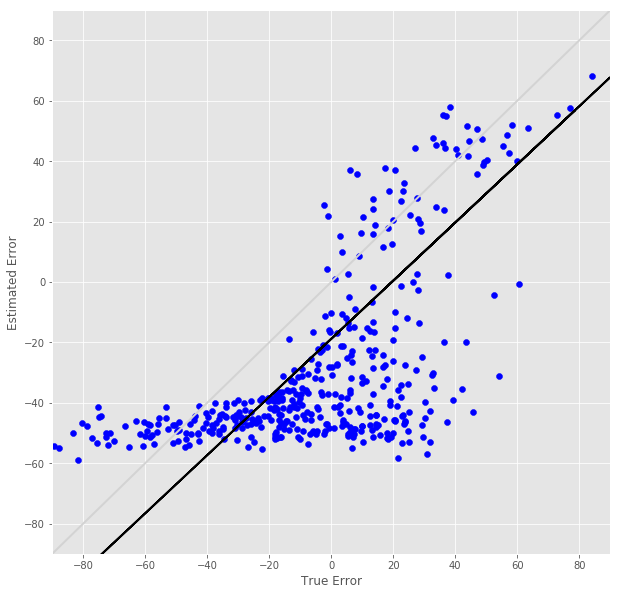

R^2 score for regression on RT: 0.0068
k = -0.1497


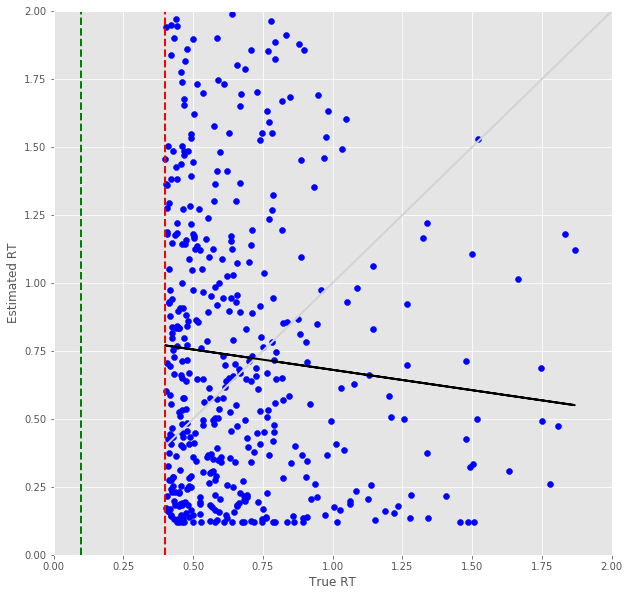

Error Prediction Score: 0.6138 RMSE
RT Prediction Score: 0.5850 RMSE
Error Prediction Corr: 0.7323
RT Prediction Corr: -0.0706
R^2 score for regression on Error: 0.5363
k = 0.8939


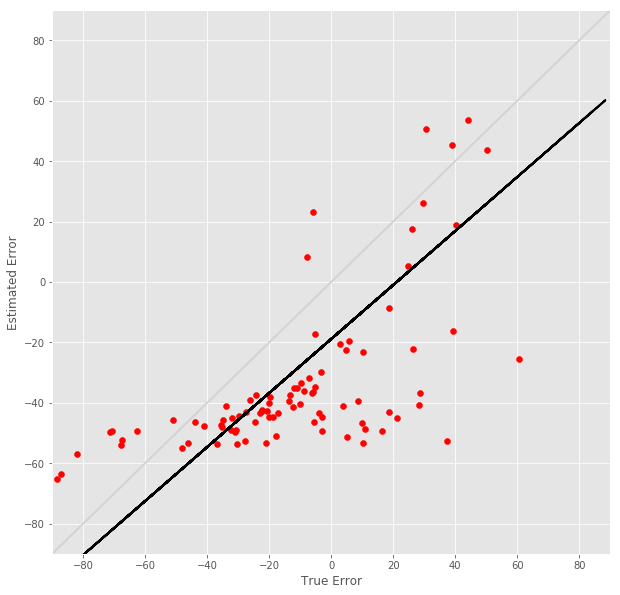

R^2 score for regression on RT: 0.0050
k = -0.1024


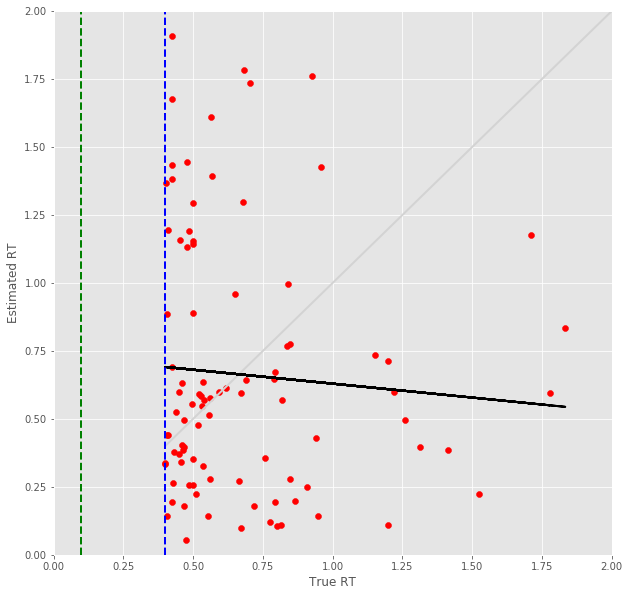

21 -step(s) forecast:
Test Score for 21 -steps forecast: 0.7904 RMSE
Predict Score for 21 -steps forecast: 0.7804 RMSE
Error Test Score for 21 -steps forecast: 0.7136 RMSE
RT Test Score for 21 -steps forecast: 0.6287 RMSE
Error Test Corr for 21 -steps forecast: 0.6805
RT Test Corr for 21 -steps forecast: -0.1050


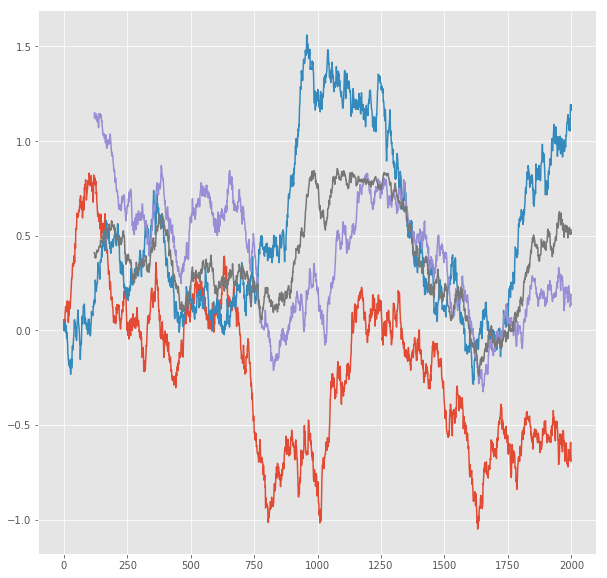

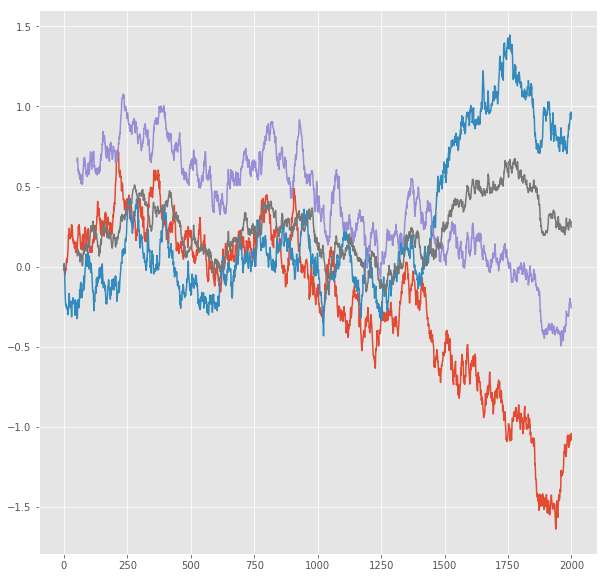

R^2 score for regression on Error: 0.4631
k = 0.9793


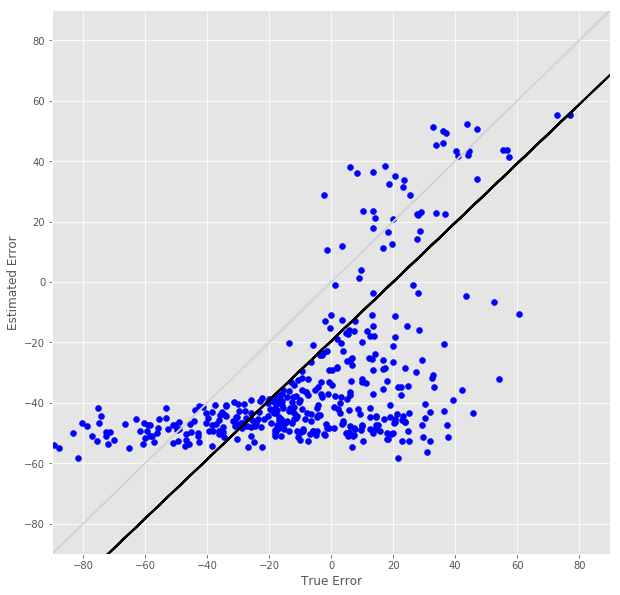

R^2 score for regression on RT: 0.0110
k = -0.1927


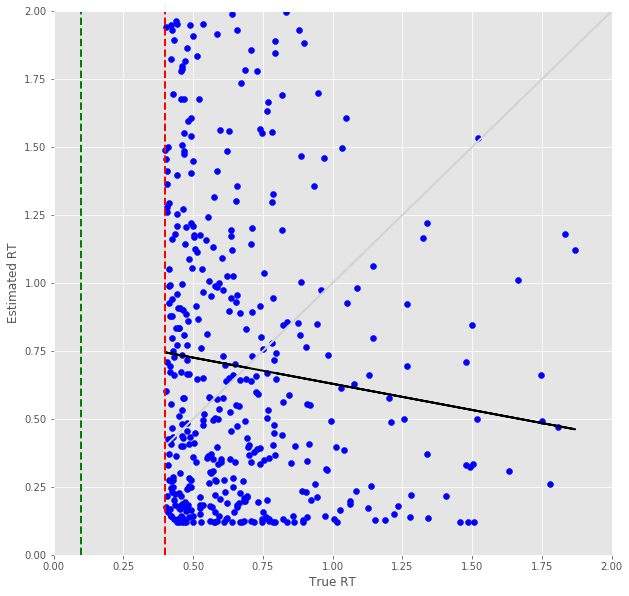

Error Prediction Score: 0.6446 RMSE
RT Prediction Score: 0.6110 RMSE
Error Prediction Corr: 0.7217
RT Prediction Corr: -0.1086
R^2 score for regression on Error: 0.5209
k = 0.9347


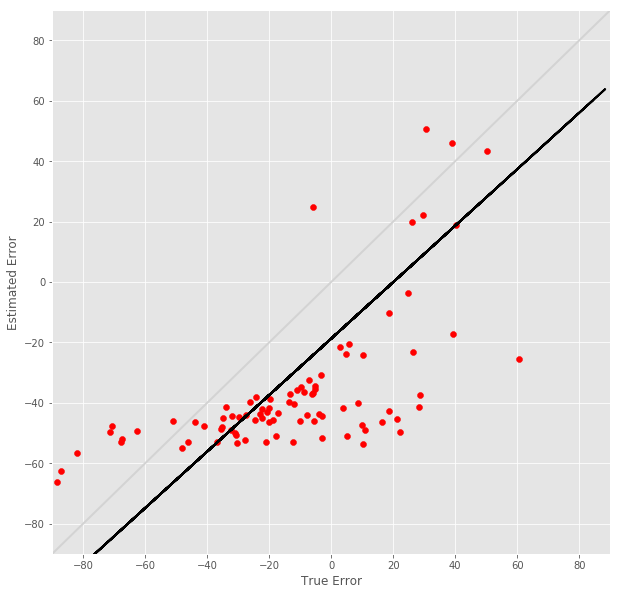

R^2 score for regression on RT: 0.0118
k = -0.1631


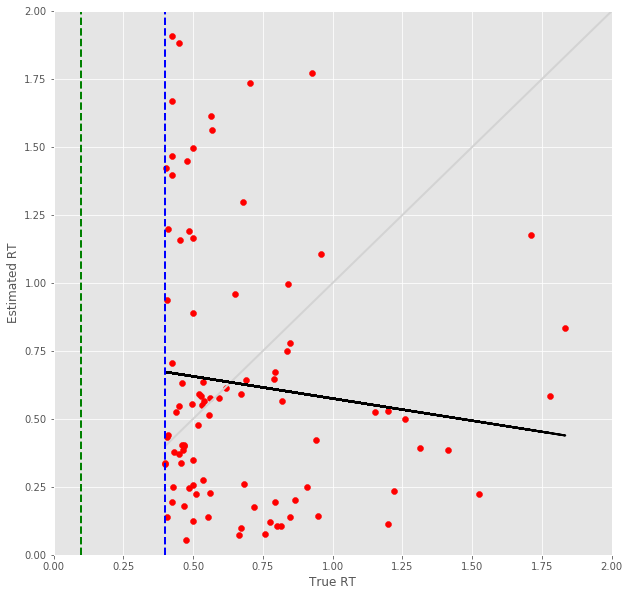

22 -step(s) forecast:
Test Score for 22 -steps forecast: 0.8123 RMSE
Predict Score for 22 -steps forecast: 0.8019 RMSE
Error Test Score for 22 -steps forecast: 0.7361 RMSE
RT Test Score for 22 -steps forecast: 0.6241 RMSE
Error Test Corr for 22 -steps forecast: 0.6613
RT Test Corr for 22 -steps forecast: -0.0946


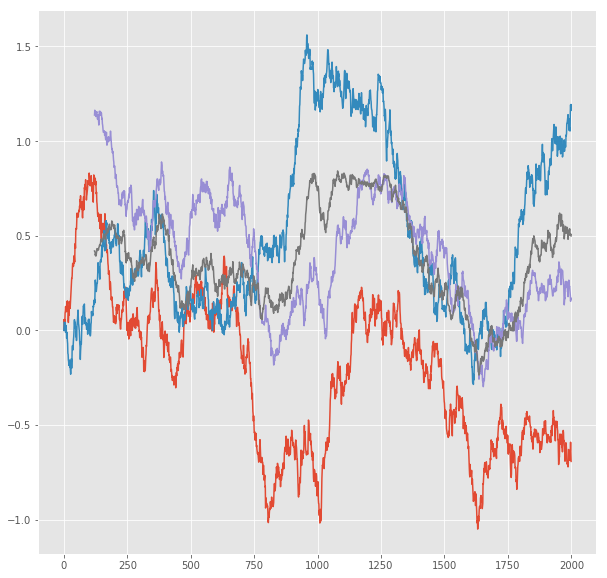

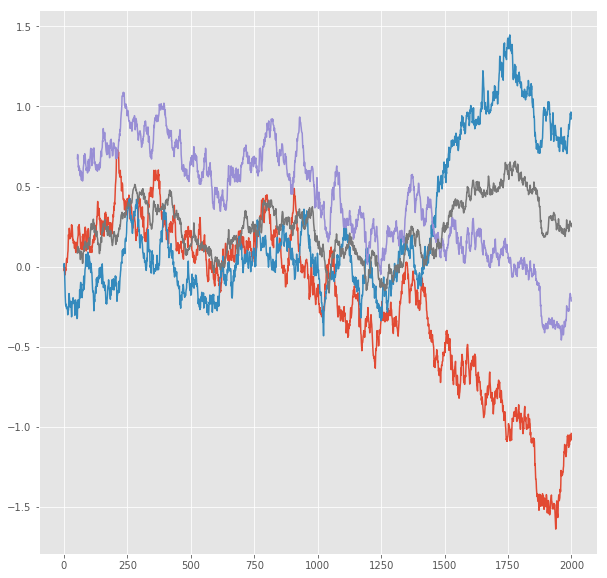

R^2 score for regression on Error: 0.4373
k = 0.9393


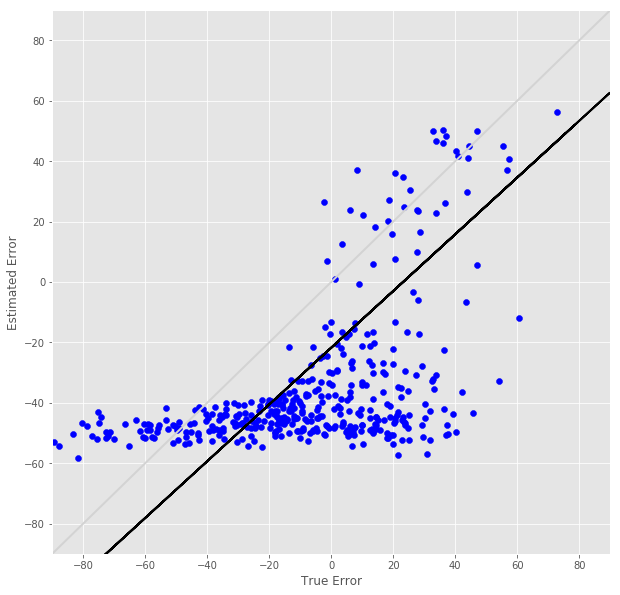

R^2 score for regression on RT: 0.0090
k = -0.1725


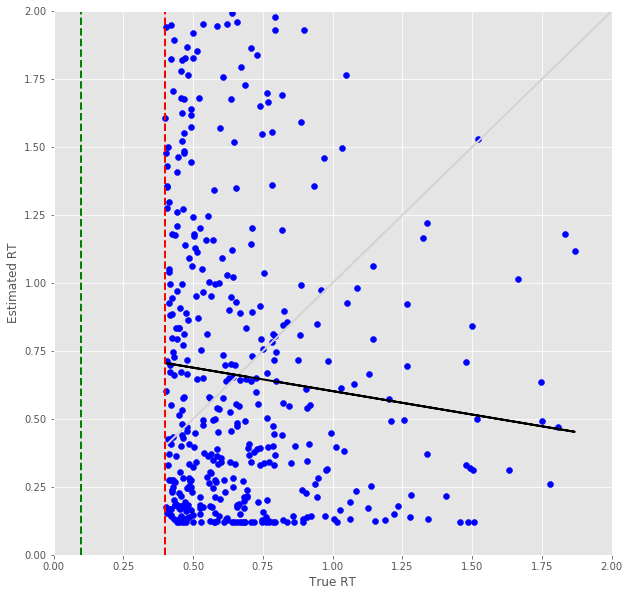

Error Prediction Score: 0.6857 RMSE
RT Prediction Score: 0.6029 RMSE
Error Prediction Corr: 0.7297
RT Prediction Corr: -0.0831
R^2 score for regression on Error: 0.5325
k = 1.0178


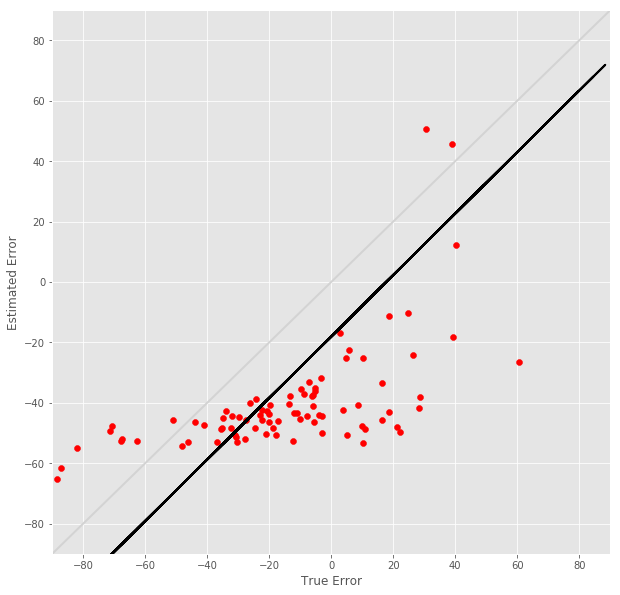

R^2 score for regression on RT: 0.0069
k = -0.1236


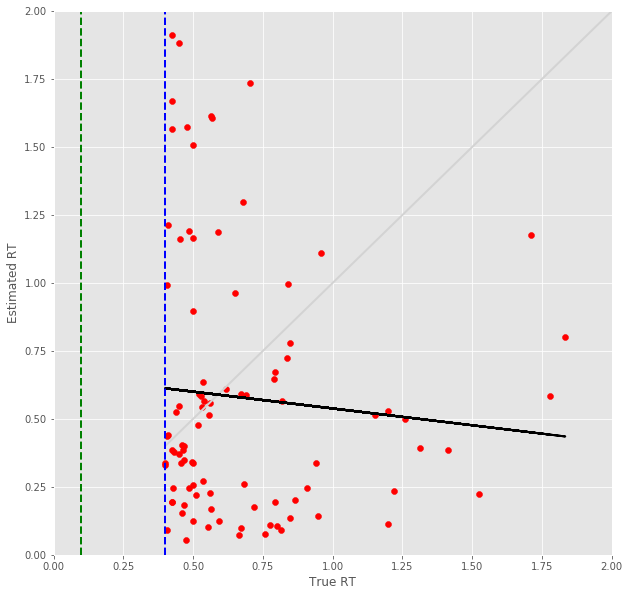

23 -step(s) forecast:
Test Score for 23 -steps forecast: 0.8335 RMSE
Predict Score for 23 -steps forecast: 0.8228 RMSE
Error Test Score for 23 -steps forecast: 0.7569 RMSE
RT Test Score for 23 -steps forecast: 0.6219 RMSE
Error Test Corr for 23 -steps forecast: 0.6494
RT Test Corr for 23 -steps forecast: -0.0971


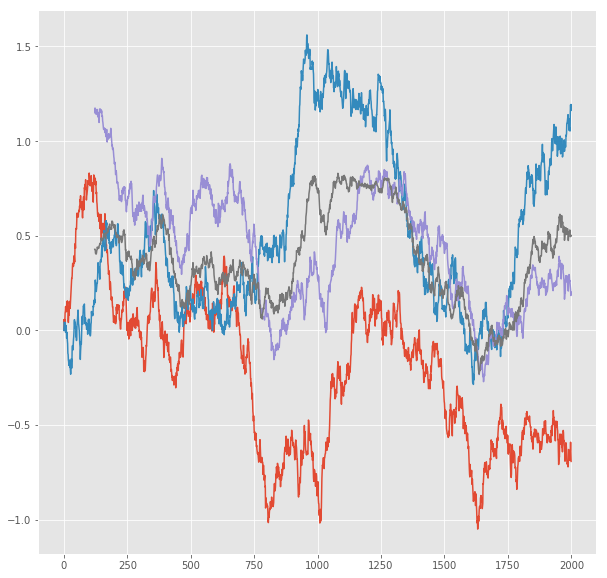

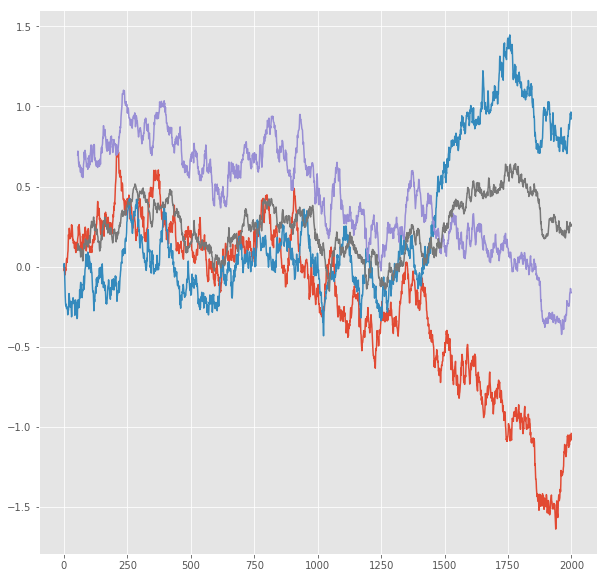

R^2 score for regression on Error: 0.4218
k = 0.9267


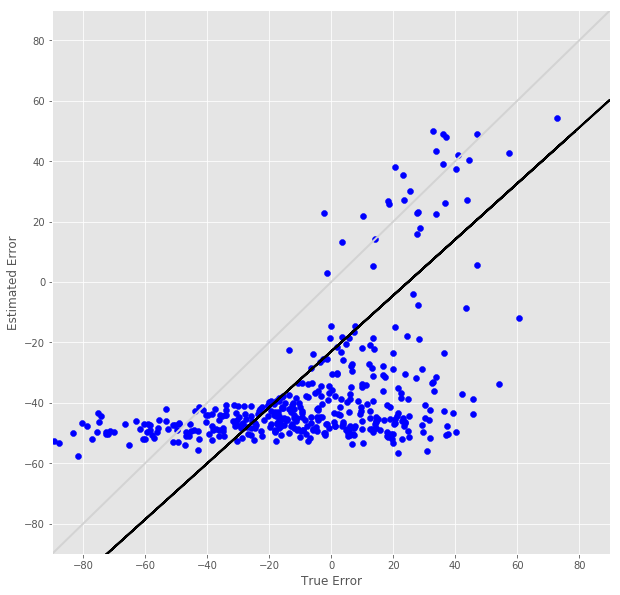

R^2 score for regression on RT: 0.0094
k = -0.1736


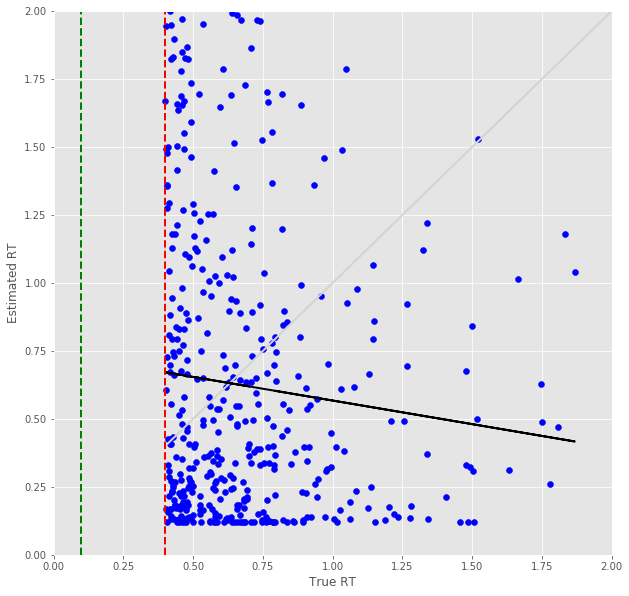

Error Prediction Score: 0.6927 RMSE
RT Prediction Score: 0.6076 RMSE
Error Prediction Corr: 0.7352
RT Prediction Corr: -0.0751
R^2 score for regression on Error: 0.5405
k = 1.0402


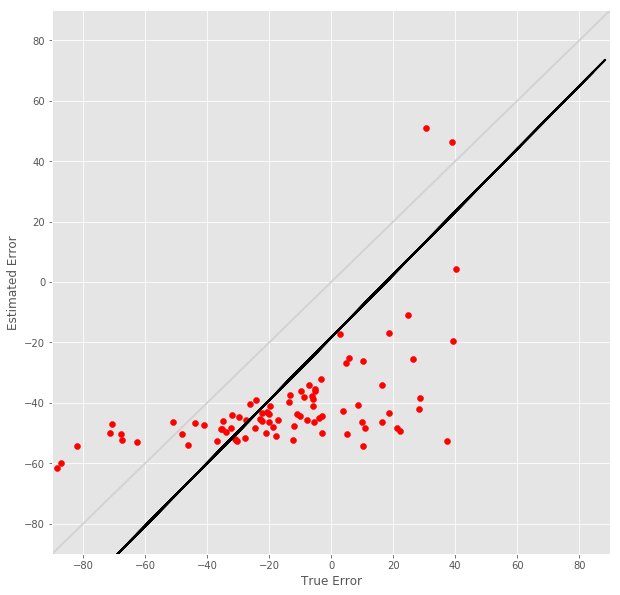

R^2 score for regression on RT: 0.0056
k = -0.1127


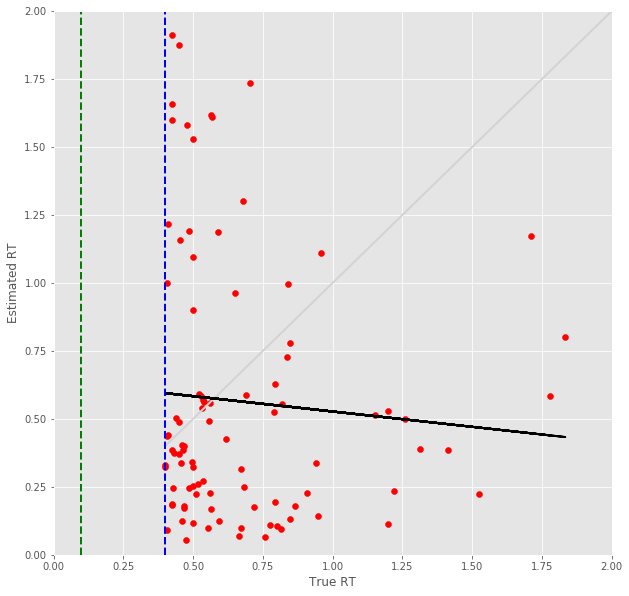

24 -step(s) forecast:
Test Score for 24 -steps forecast: 0.8540 RMSE
Predict Score for 24 -steps forecast: 0.8430 RMSE
Error Test Score for 24 -steps forecast: 0.7766 RMSE
RT Test Score for 24 -steps forecast: 0.6081 RMSE
Error Test Corr for 24 -steps forecast: 0.6500
RT Test Corr for 24 -steps forecast: -0.0806


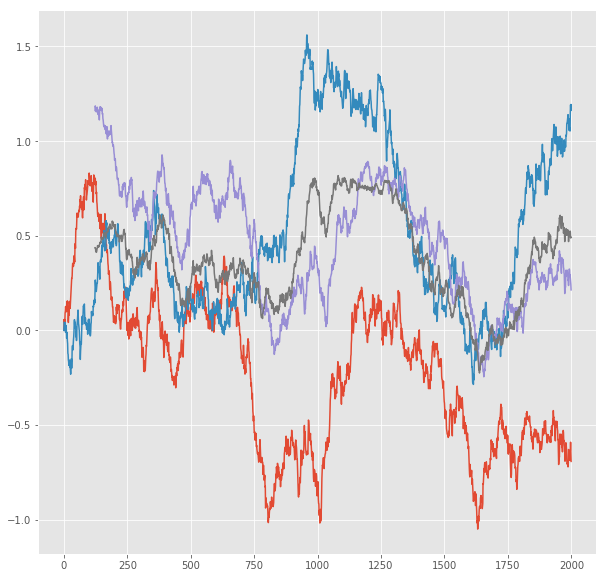

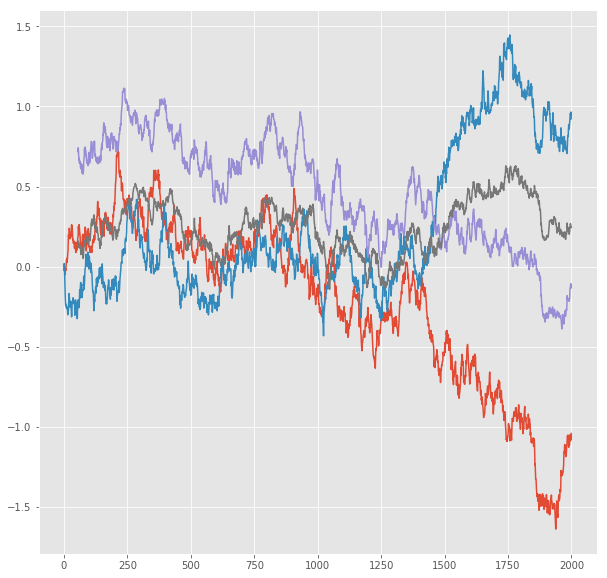

R^2 score for regression on Error: 0.4225
k = 0.9583


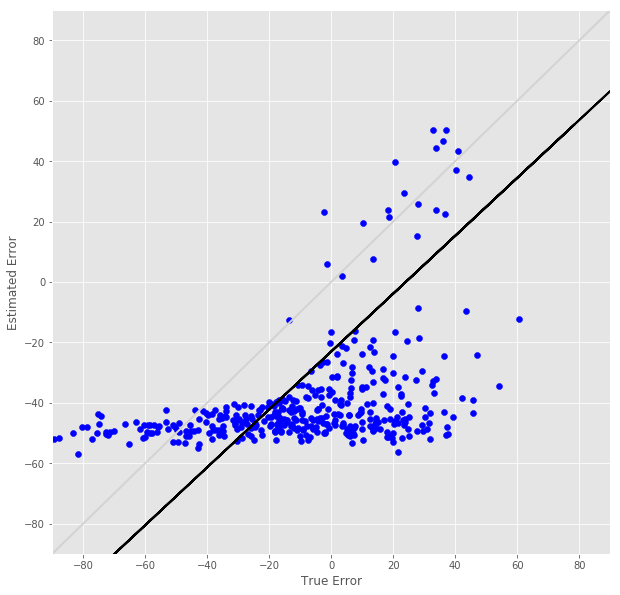

R^2 score for regression on RT: 0.0065
k = -0.1376


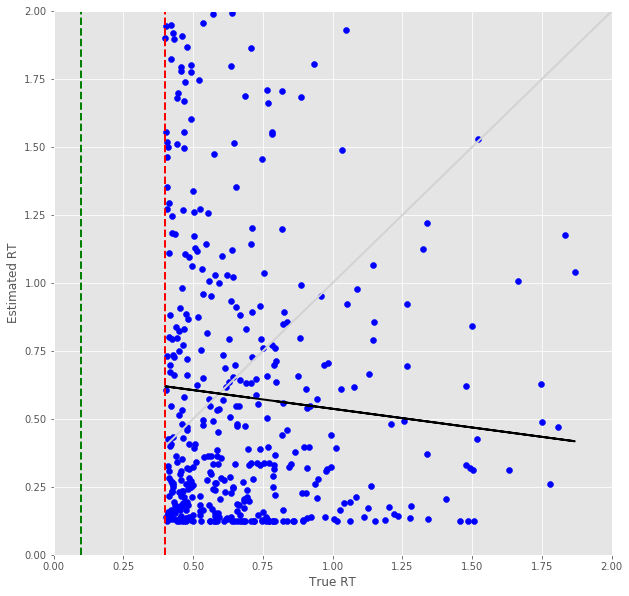

Error Prediction Score: 0.7059 RMSE
RT Prediction Score: 0.6161 RMSE
Error Prediction Corr: 0.7242
RT Prediction Corr: -0.0248
R^2 score for regression on Error: 0.5245
k = 1.0223


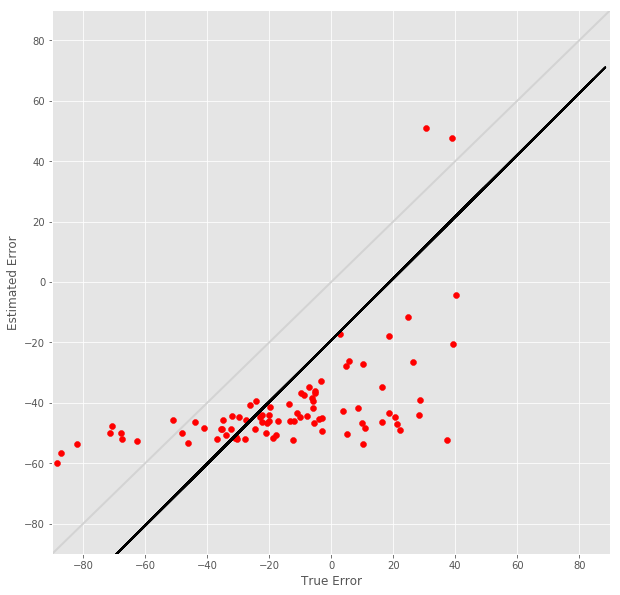

R^2 score for regression on RT: 0.0006
k = -0.0364


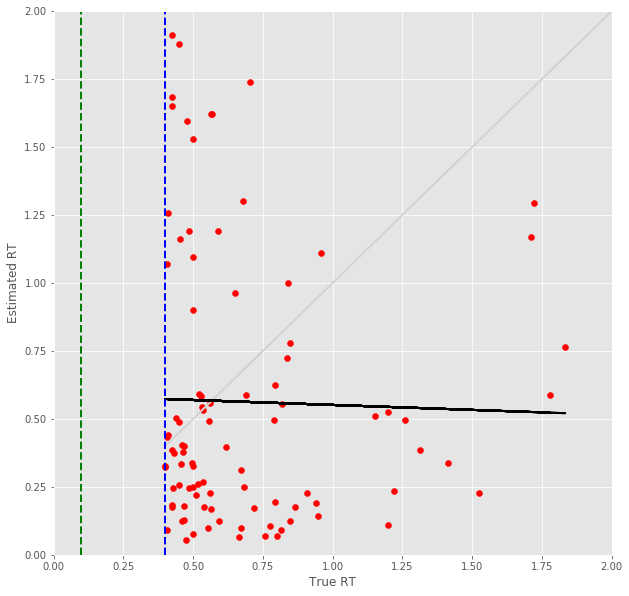

25 -step(s) forecast:
Test Score for 25 -steps forecast: 0.8740 RMSE
Predict Score for 25 -steps forecast: 0.8626 RMSE
Error Test Score for 25 -steps forecast: 0.8045 RMSE
RT Test Score for 25 -steps forecast: 0.5886 RMSE
Error Test Corr for 25 -steps forecast: 0.6308
RT Test Corr for 25 -steps forecast: -0.0296


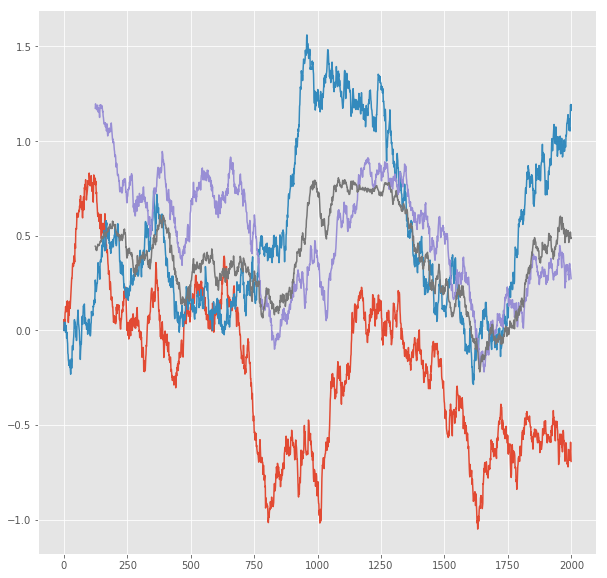

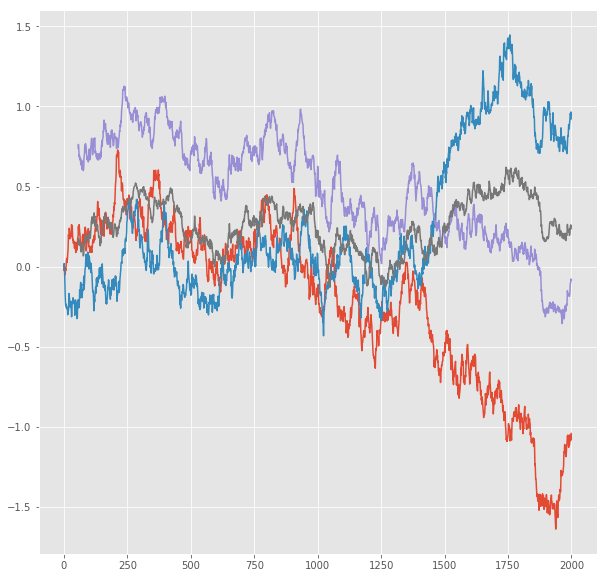

R^2 score for regression on Error: 0.3979
k = 0.9296


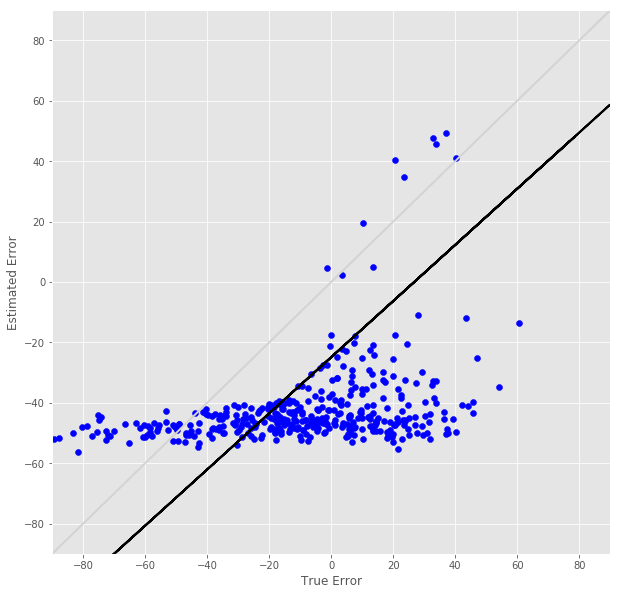

R^2 score for regression on RT: 0.0009
k = -0.0477


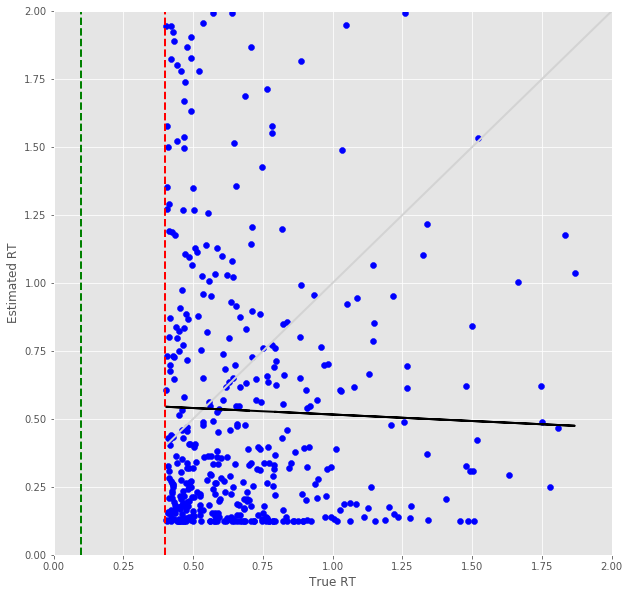

Error Prediction Score: 0.7130 RMSE
RT Prediction Score: 0.6438 RMSE
Error Prediction Corr: 0.7180
RT Prediction Corr: -0.1021
R^2 score for regression on Error: 0.5155
k = 1.0073


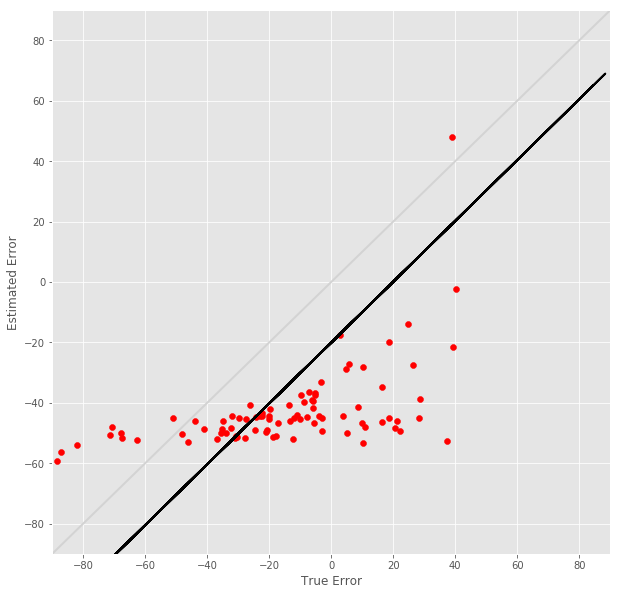

R^2 score for regression on RT: 0.0104
k = -0.1492


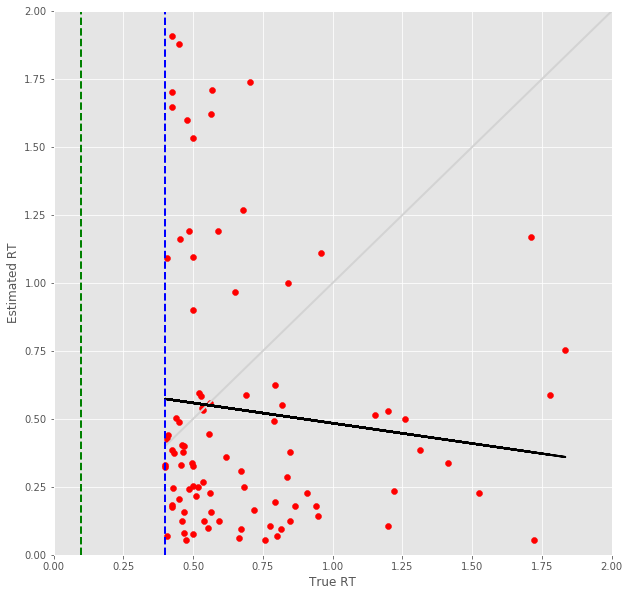

26 -step(s) forecast:
Test Score for 26 -steps forecast: 0.8934 RMSE
Predict Score for 26 -steps forecast: 0.8816 RMSE
Error Test Score for 26 -steps forecast: 0.8250 RMSE
RT Test Score for 26 -steps forecast: 0.5850 RMSE
Error Test Corr for 26 -steps forecast: 0.6364
RT Test Corr for 26 -steps forecast: -0.0421


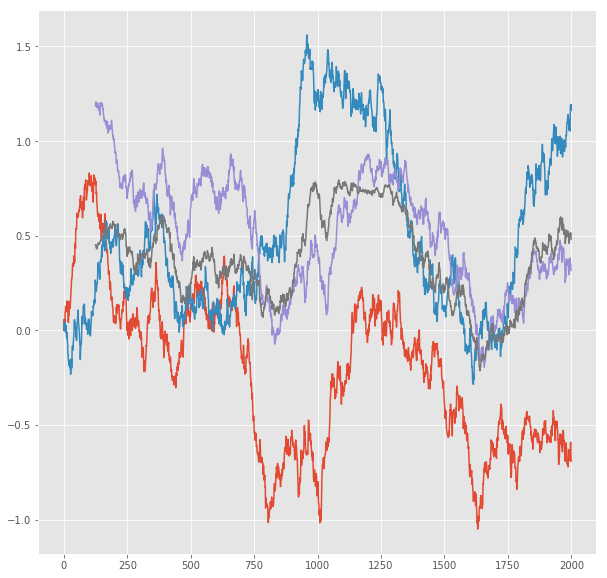

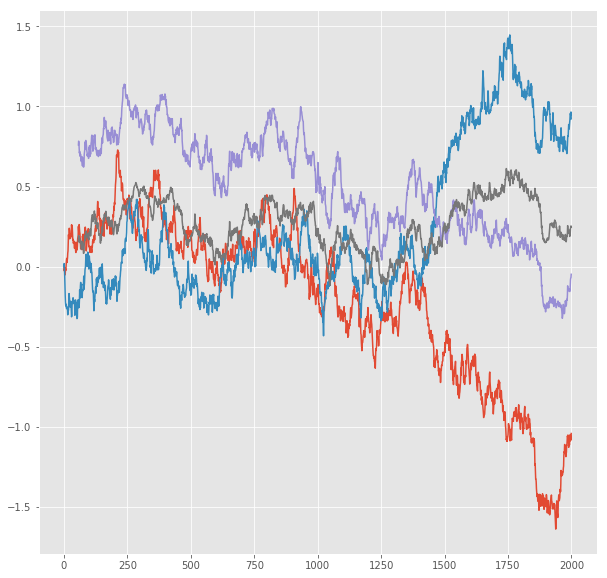

R^2 score for regression on Error: 0.4050
k = 0.9696


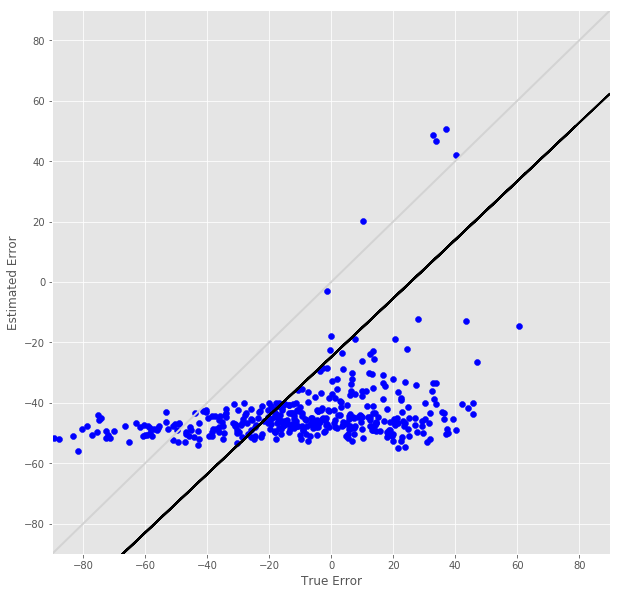

R^2 score for regression on RT: 0.0018
k = -0.0651


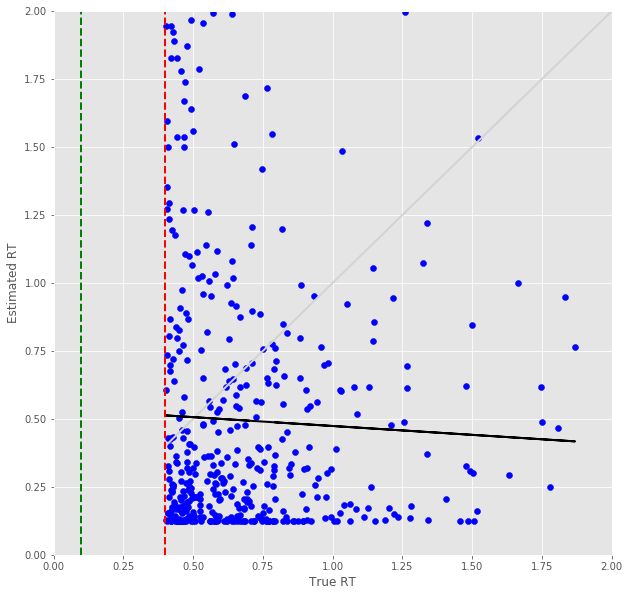

Error Prediction Score: 0.7212 RMSE
RT Prediction Score: 0.6381 RMSE
Error Prediction Corr: 0.7121
RT Prediction Corr: -0.0889
R^2 score for regression on Error: 0.5070
k = 0.9996


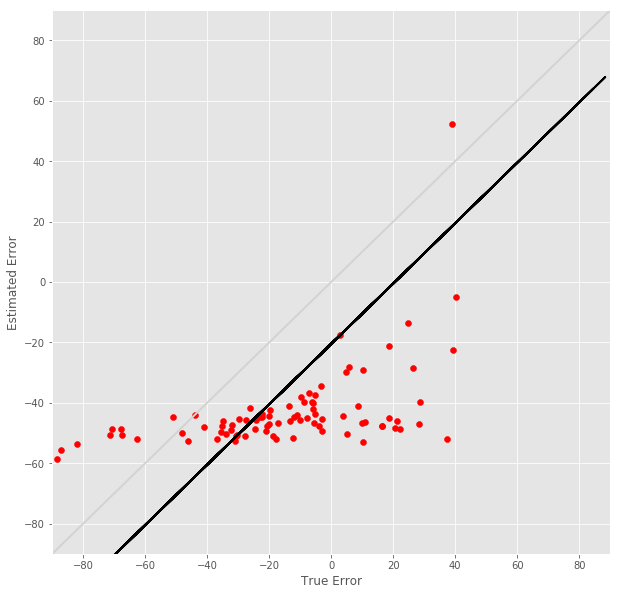

R^2 score for regression on RT: 0.0079
k = -0.1252


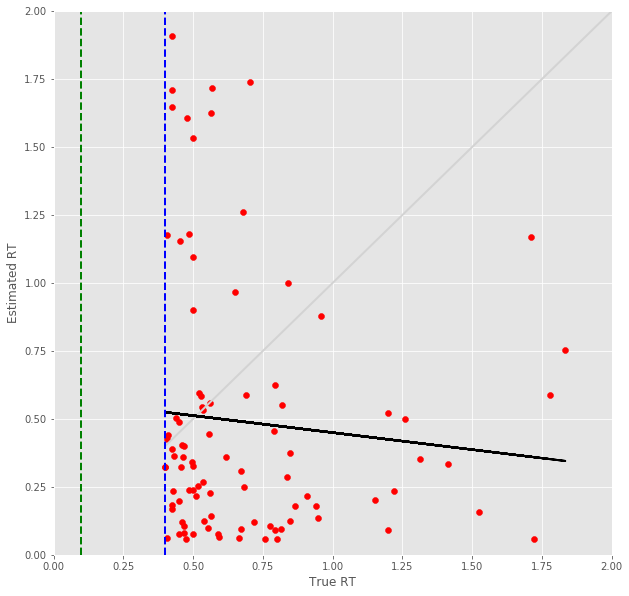

27 -step(s) forecast:
Test Score for 27 -steps forecast: 0.9122 RMSE
Predict Score for 27 -steps forecast: 0.9001 RMSE
Error Test Score for 27 -steps forecast: 0.8415 RMSE
RT Test Score for 27 -steps forecast: 0.5704 RMSE
Error Test Corr for 27 -steps forecast: 0.6257
RT Test Corr for 27 -steps forecast: -0.0116


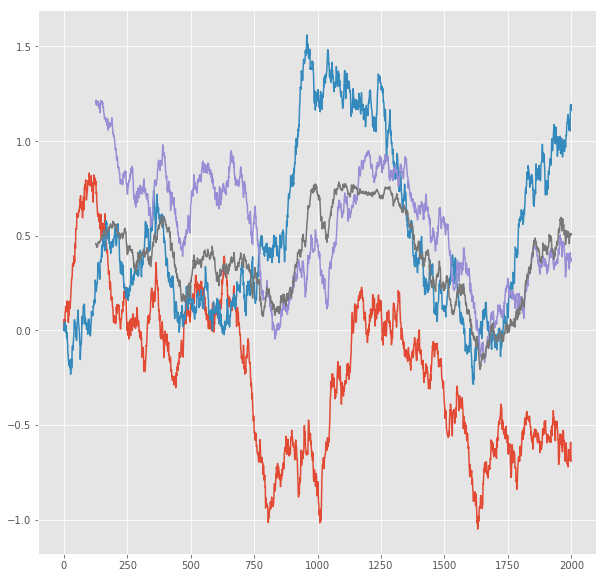

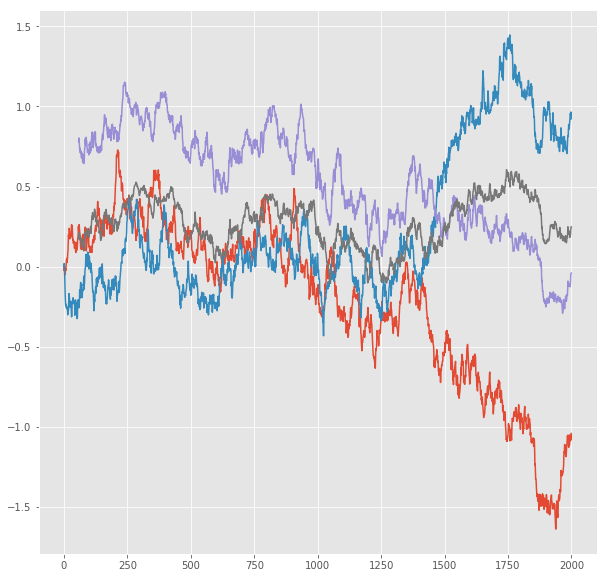

R^2 score for regression on Error: 0.3915
k = 0.9384


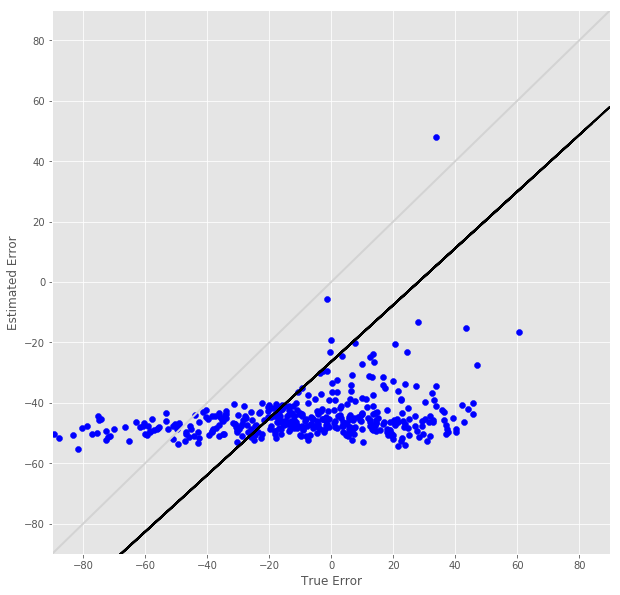

R^2 score for regression on RT: 0.0001
k = -0.0169


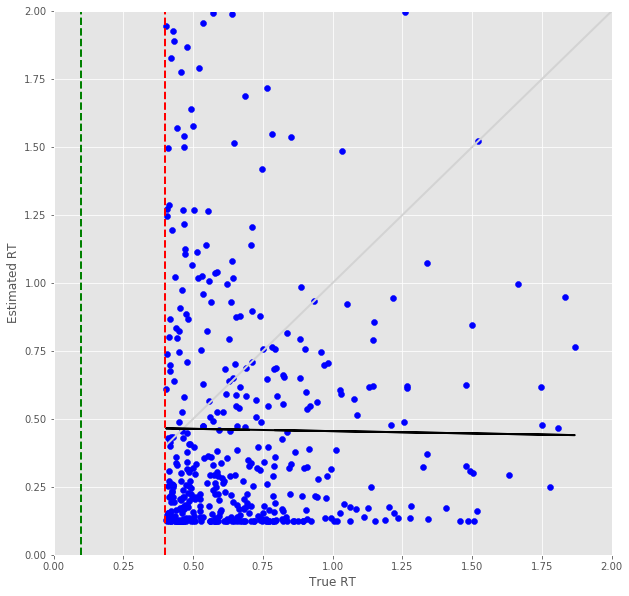

Error Prediction Score: 0.7457 RMSE
RT Prediction Score: 0.6284 RMSE
Error Prediction Corr: 0.6934
RT Prediction Corr: -0.0414
R^2 score for regression on Error: 0.4808
k = 0.9691


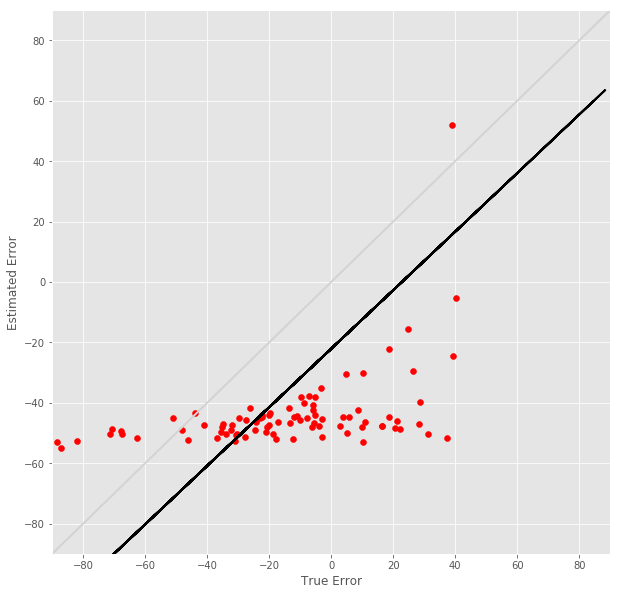

R^2 score for regression on RT: 0.0017
k = -0.0563


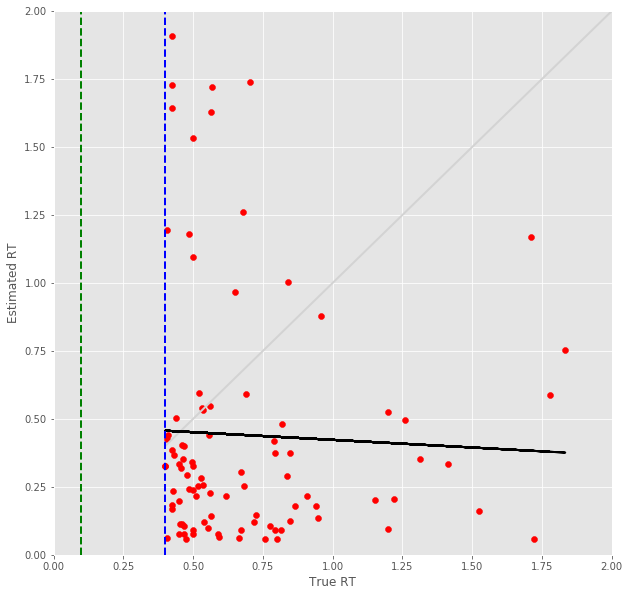

28 -step(s) forecast:
Test Score for 28 -steps forecast: 0.9305 RMSE
Predict Score for 28 -steps forecast: 0.9181 RMSE
Error Test Score for 28 -steps forecast: 0.8511 RMSE
RT Test Score for 28 -steps forecast: 0.5824 RMSE
Error Test Corr for 28 -steps forecast: 0.6307
RT Test Corr for 28 -steps forecast: -0.0532


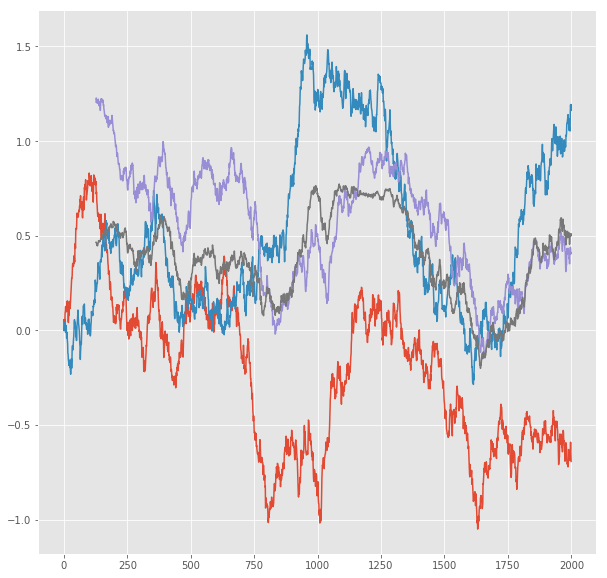

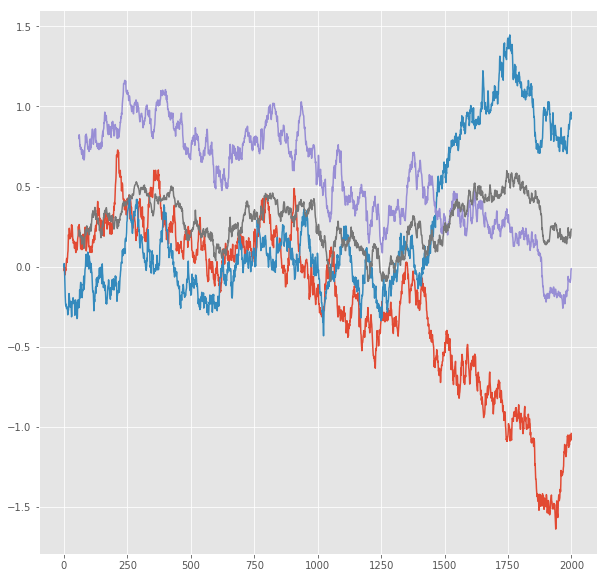

R^2 score for regression on Error: 0.3977
k = 0.9663


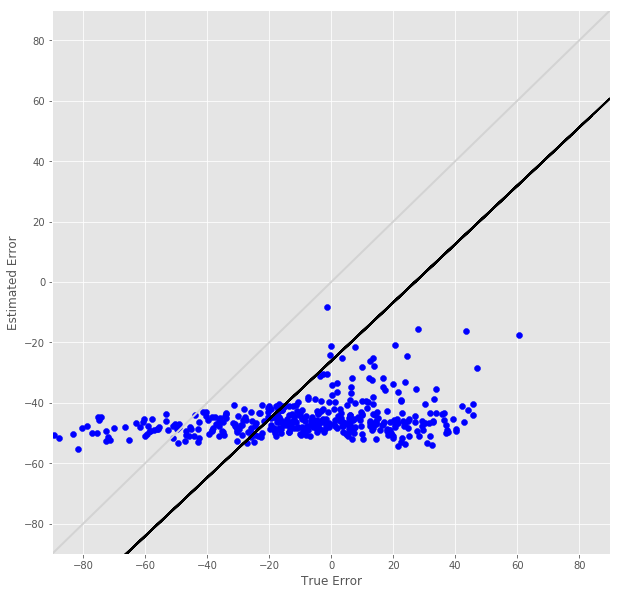

R^2 score for regression on RT: 0.0028
k = -0.0765


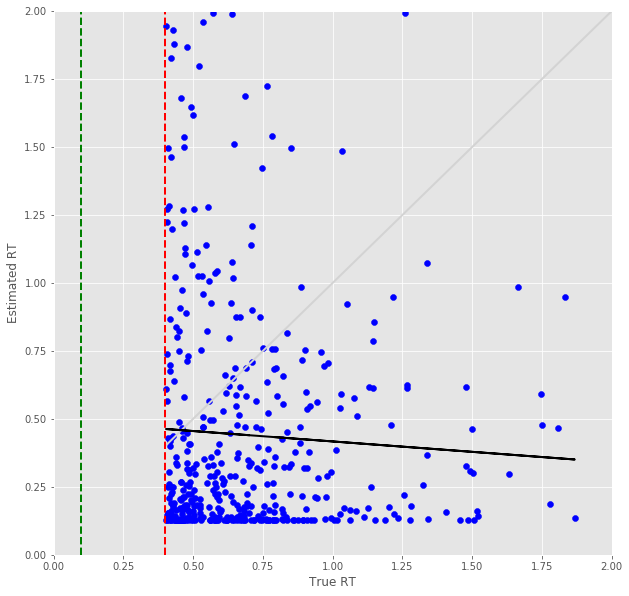

Error Prediction Score: 0.7534 RMSE
RT Prediction Score: 0.6388 RMSE
Error Prediction Corr: 0.6812
RT Prediction Corr: -0.0506
R^2 score for regression on Error: 0.4640
k = 0.9541


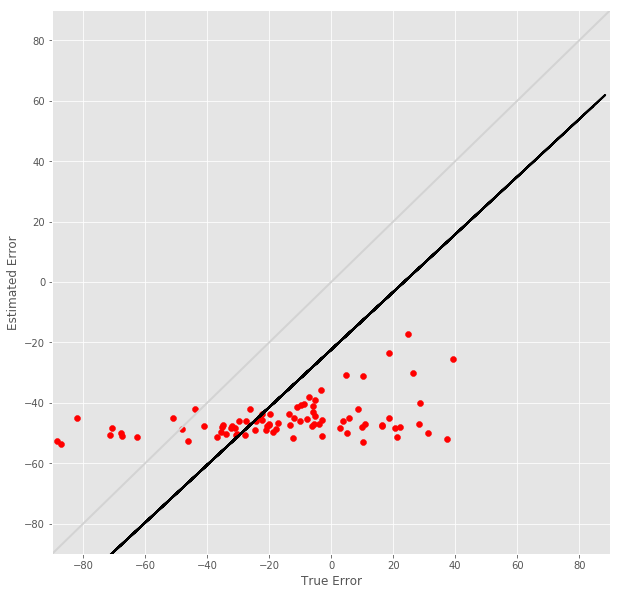

R^2 score for regression on RT: 0.0026
k = -0.0658


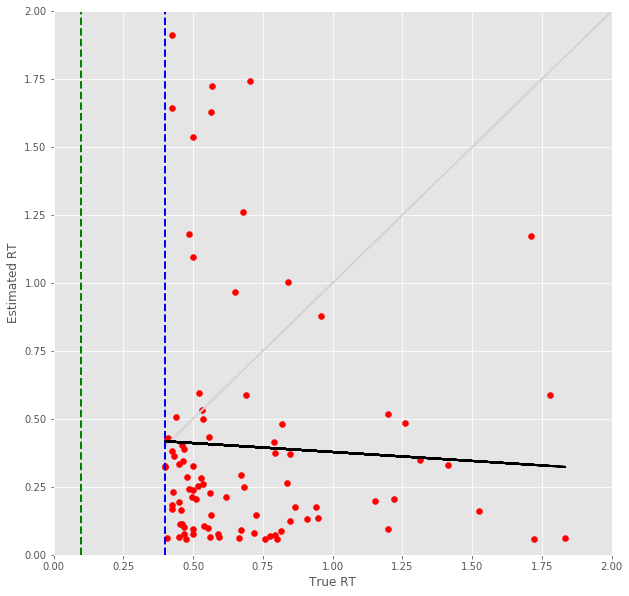

29 -step(s) forecast:
Test Score for 29 -steps forecast: 0.9484 RMSE
Predict Score for 29 -steps forecast: 0.9356 RMSE
Error Test Score for 29 -steps forecast: 0.8598 RMSE
RT Test Score for 29 -steps forecast: 0.5786 RMSE
Error Test Corr for 29 -steps forecast: 0.6321
RT Test Corr for 29 -steps forecast: -0.0370


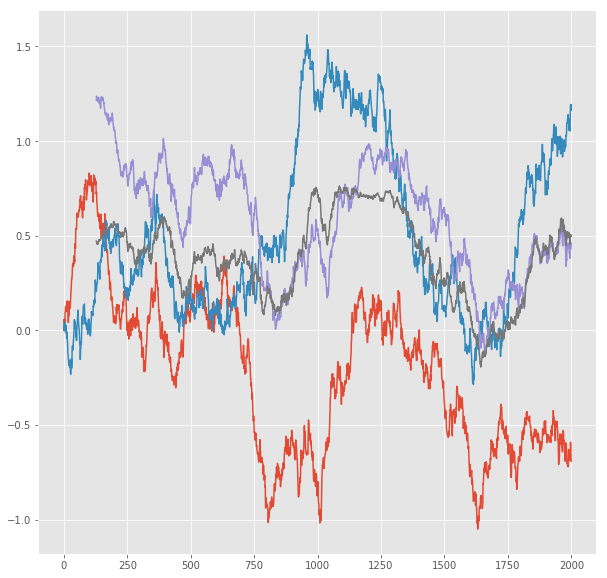

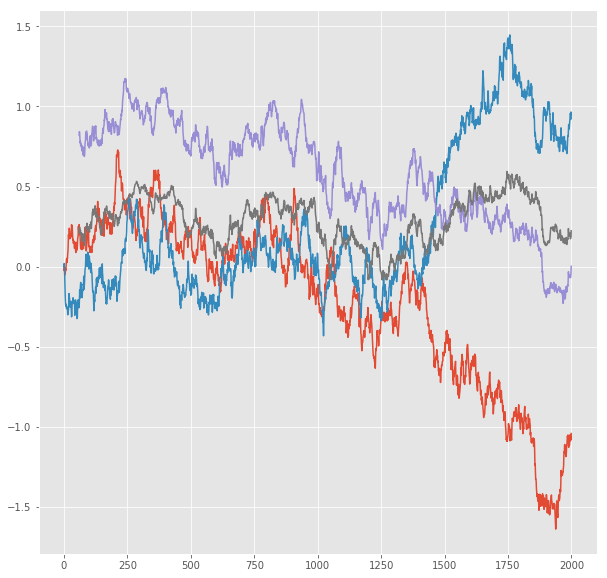

R^2 score for regression on Error: 0.3996
k = 0.9875


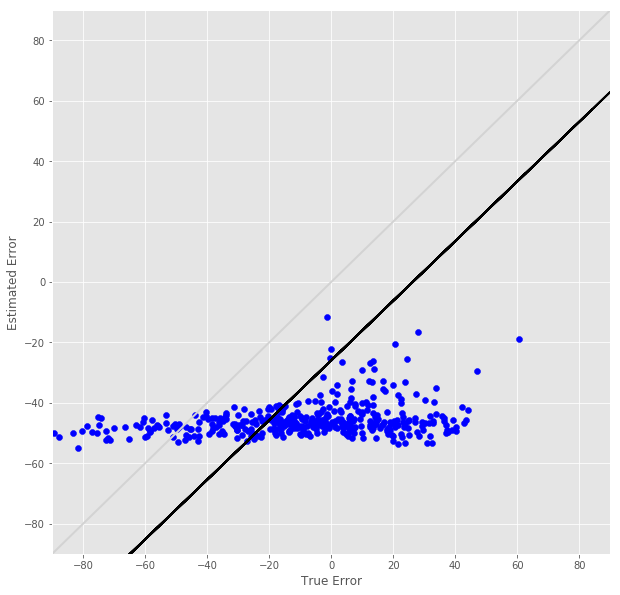

R^2 score for regression on RT: 0.0014
k = -0.0513


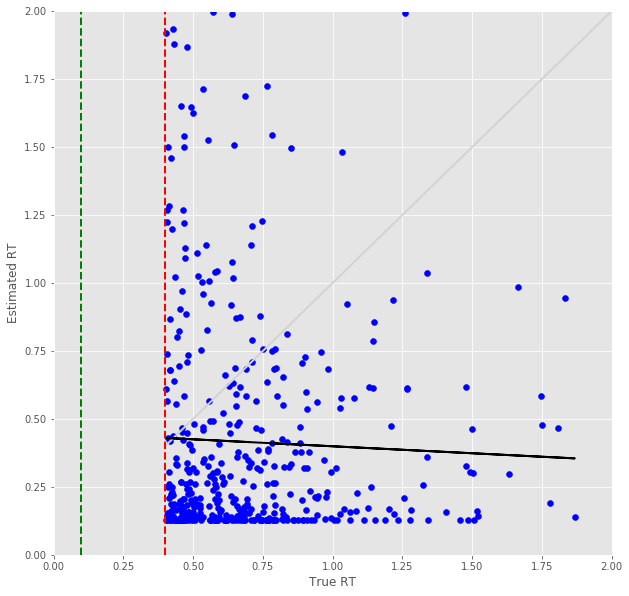

Error Prediction Score: 0.7570 RMSE
RT Prediction Score: 0.6497 RMSE
Error Prediction Corr: 0.6779
RT Prediction Corr: -0.0412
R^2 score for regression on Error: 0.4595
k = 0.9501


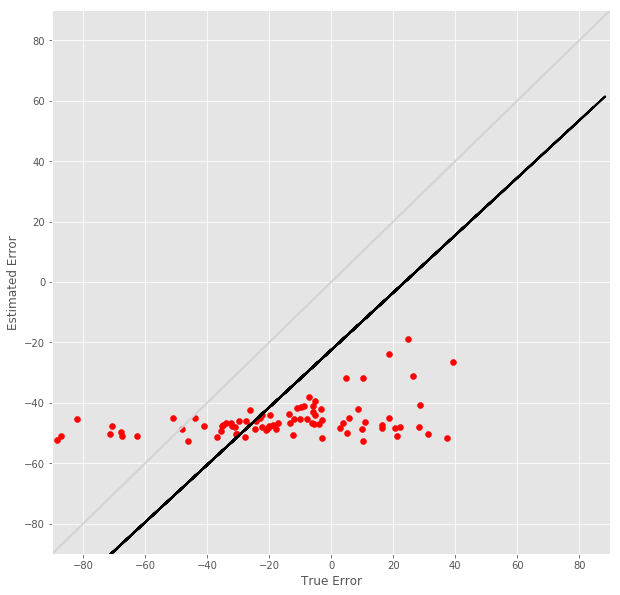

R^2 score for regression on RT: 0.0017
k = -0.0534


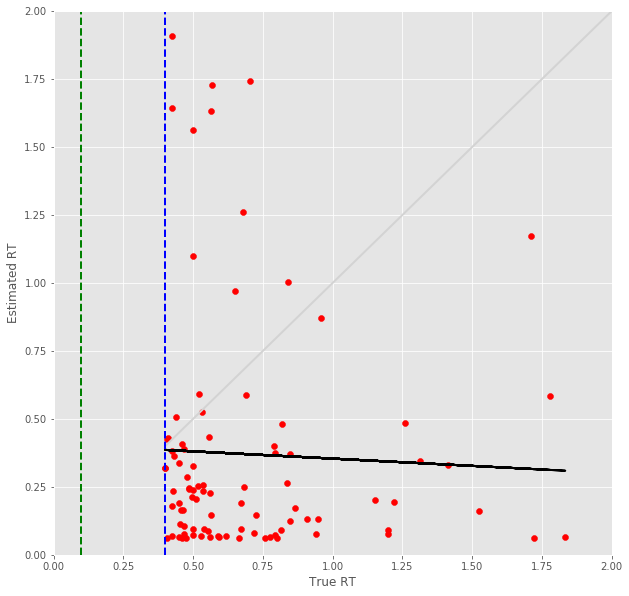

30 -step(s) forecast:
Test Score for 30 -steps forecast: 0.9658 RMSE
Predict Score for 30 -steps forecast: 0.9526 RMSE
Error Test Score for 30 -steps forecast: 0.8680 RMSE
RT Test Score for 30 -steps forecast: 0.5856 RMSE
Error Test Corr for 30 -steps forecast: 0.6418
RT Test Corr for 30 -steps forecast: -0.0410


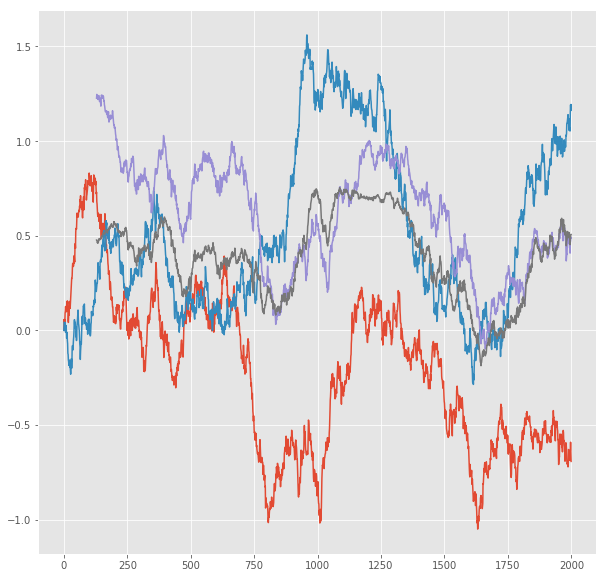

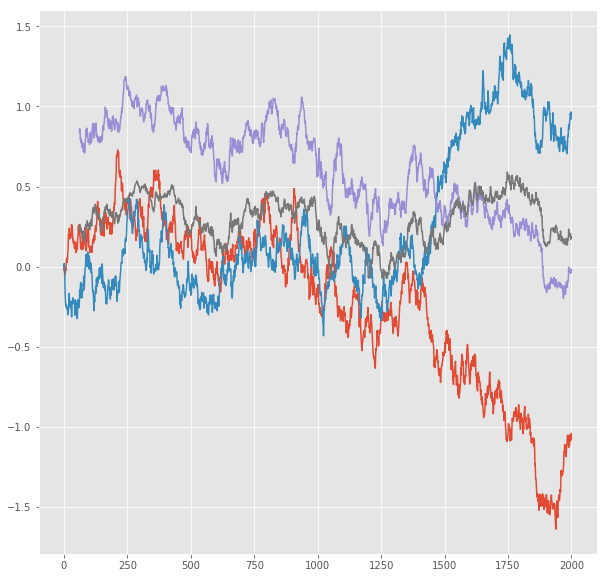

R^2 score for regression on Error: 0.4119
k = 1.0323


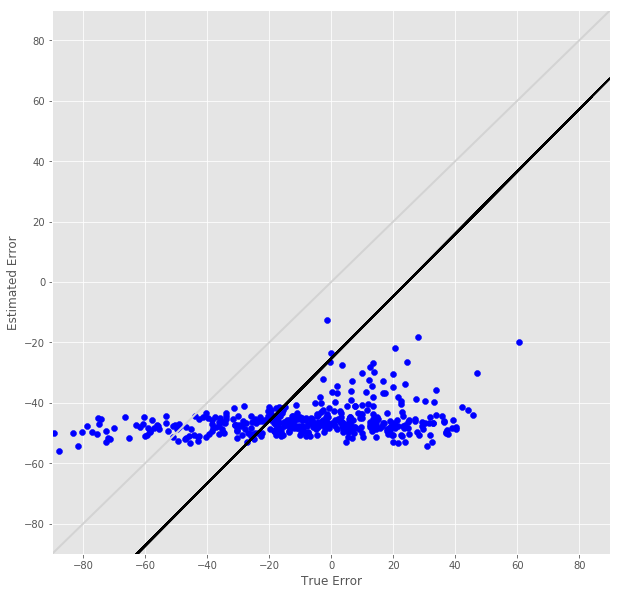

R^2 score for regression on RT: 0.0017
k = -0.0569


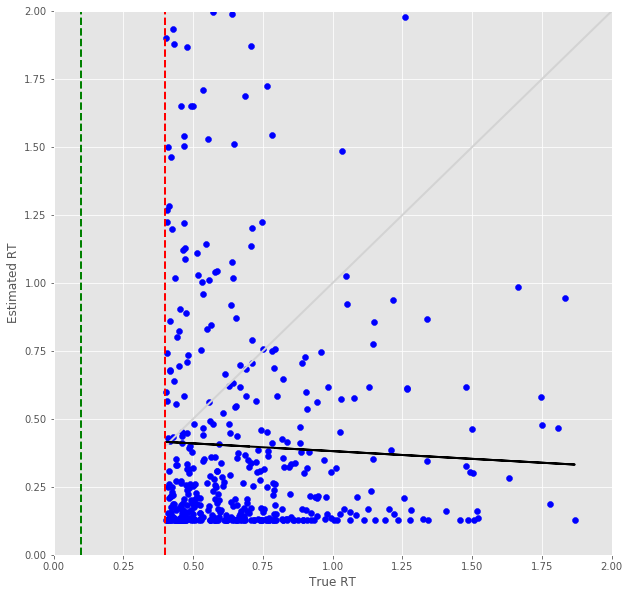

Error Prediction Score: 0.7752 RMSE
RT Prediction Score: 0.6587 RMSE
Error Prediction Corr: 0.6624
RT Prediction Corr: -0.0464
R^2 score for regression on Error: 0.4388
k = 0.9237


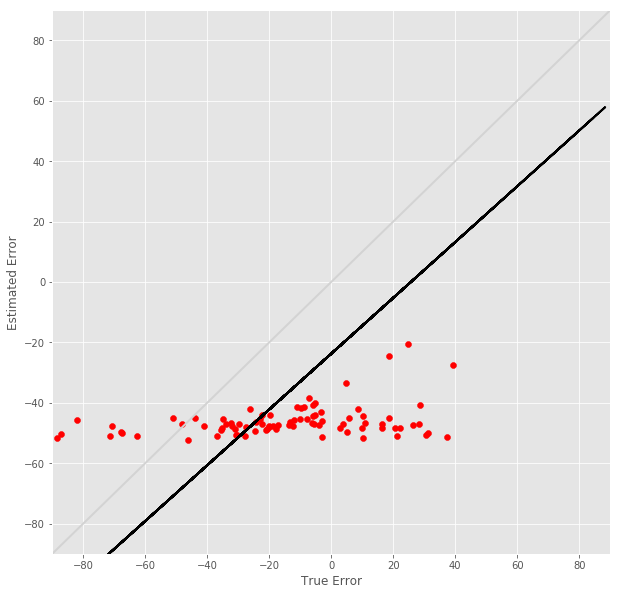

R^2 score for regression on RT: 0.0022
k = -0.0559


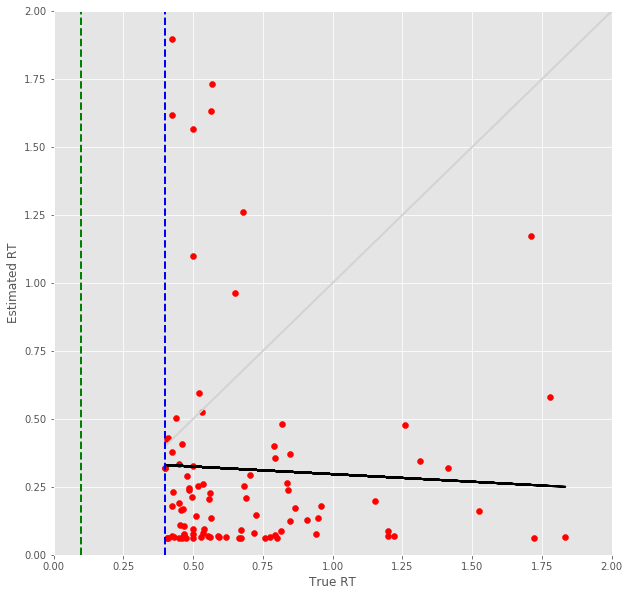

31 -step(s) forecast:
Test Score for 31 -steps forecast: 0.9827 RMSE
Predict Score for 31 -steps forecast: 0.9692 RMSE
Error Test Score for 31 -steps forecast: 0.8814 RMSE
RT Test Score for 31 -steps forecast: 0.5839 RMSE
Error Test Corr for 31 -steps forecast: 0.6458
RT Test Corr for 31 -steps forecast: -0.0136


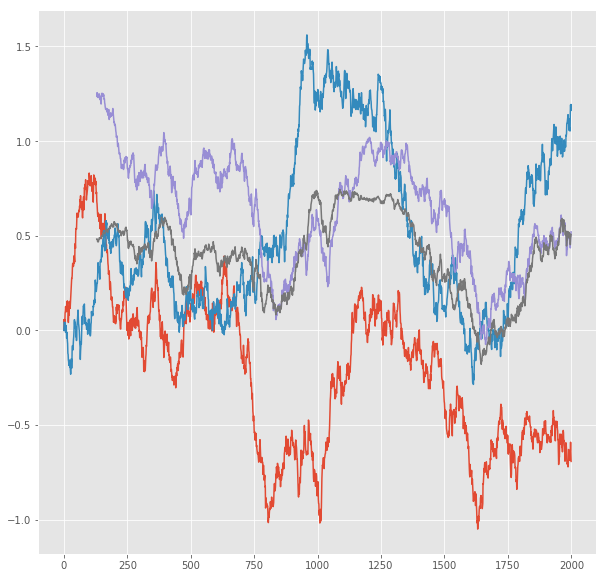

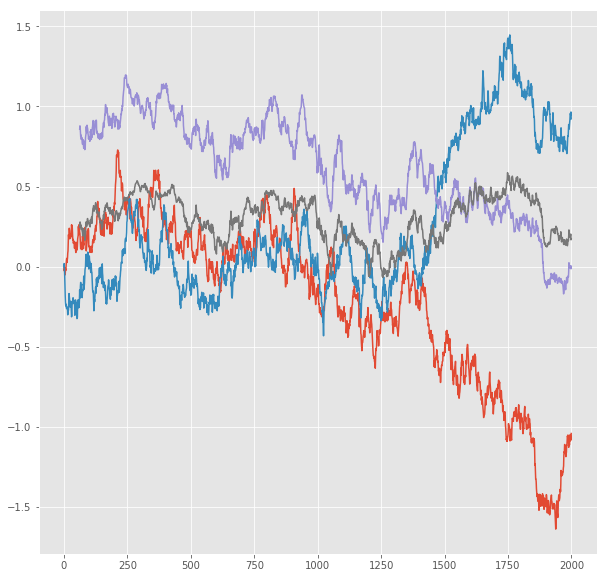

R^2 score for regression on Error: 0.4170
k = 1.0652


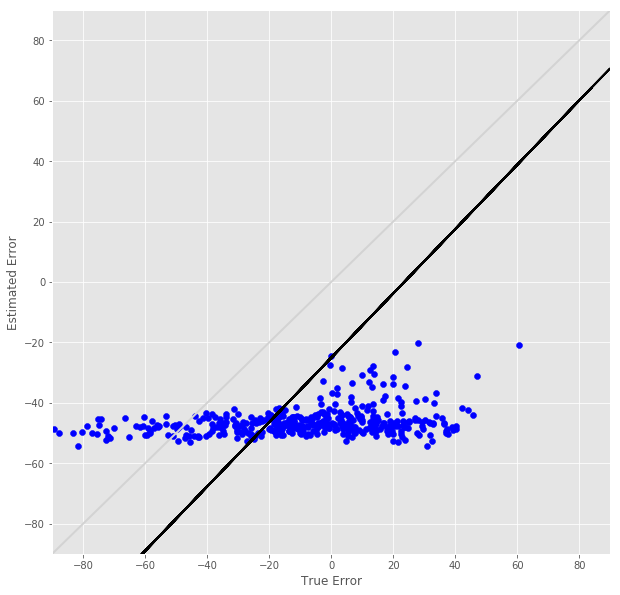

R^2 score for regression on RT: 0.0002
k = -0.0181


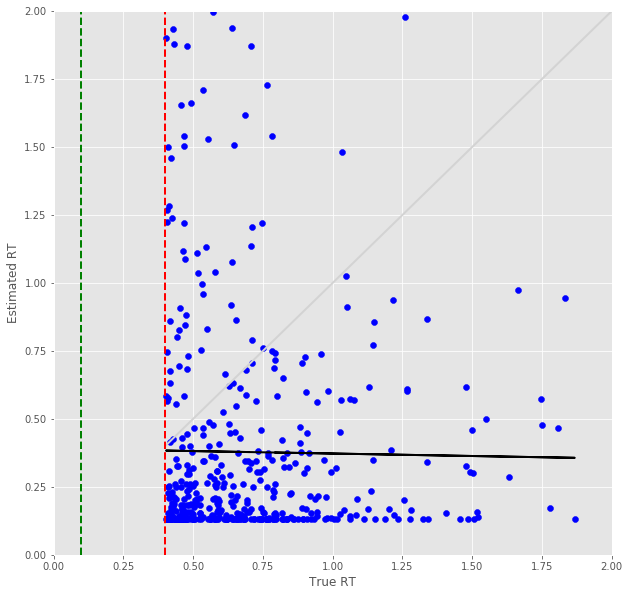

Error Prediction Score: 0.7963 RMSE
RT Prediction Score: 0.6651 RMSE
Error Prediction Corr: 0.6807
RT Prediction Corr: -0.0602
R^2 score for regression on Error: 0.4634
k = 1.0153


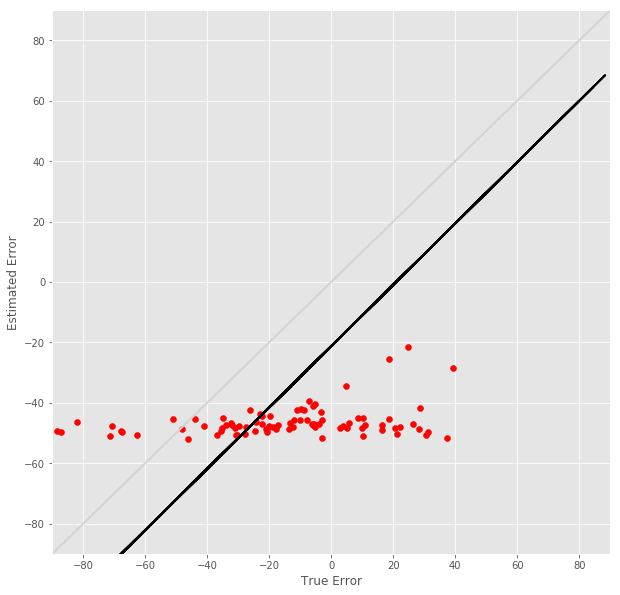

R^2 score for regression on RT: 0.0036
k = -0.0725


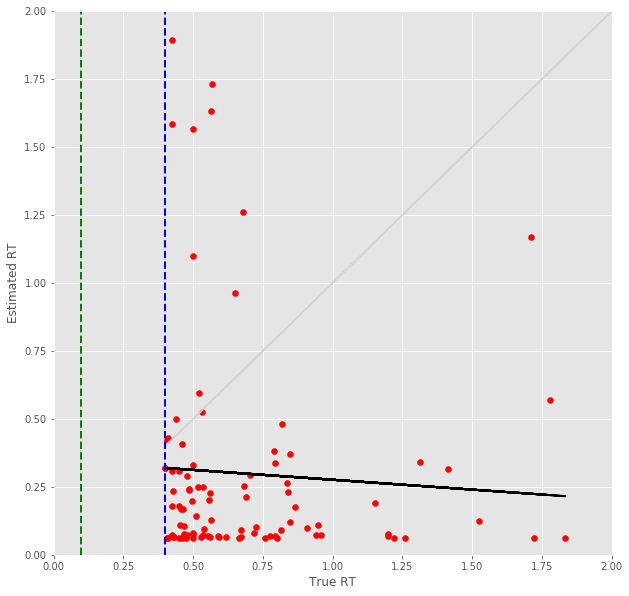

32 -step(s) forecast:
Test Score for 32 -steps forecast: 0.9993 RMSE
Predict Score for 32 -steps forecast: 0.9854 RMSE
Error Test Score for 32 -steps forecast: 0.8858 RMSE
RT Test Score for 32 -steps forecast: 0.5838 RMSE
Error Test Corr for 32 -steps forecast: 0.6499
RT Test Corr for 32 -steps forecast: -0.0128


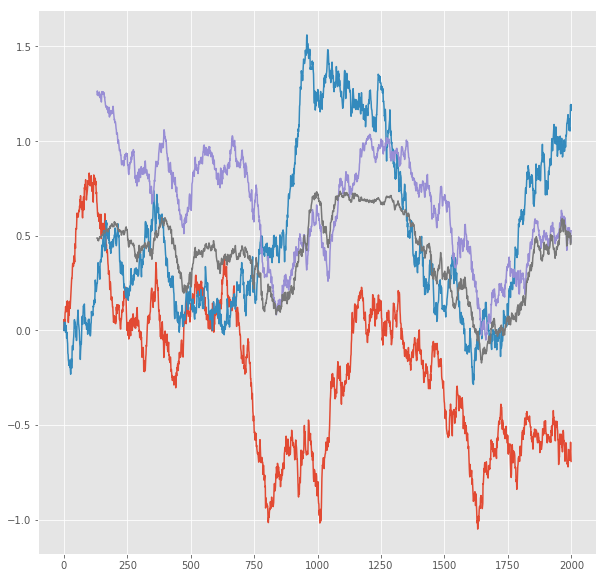

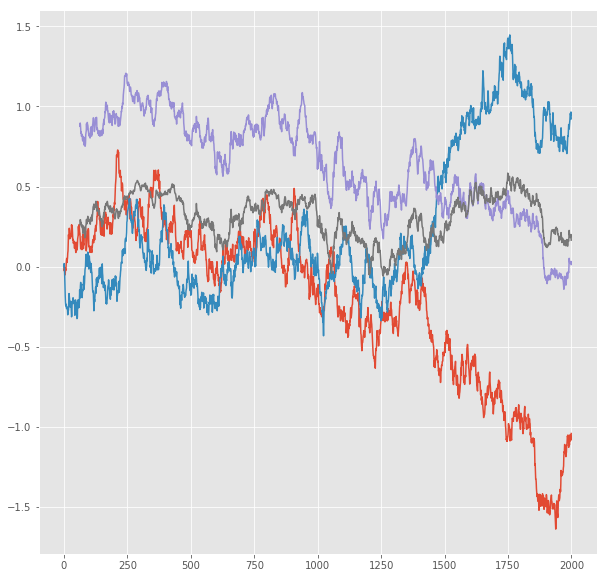

R^2 score for regression on Error: 0.4224
k = 1.0855


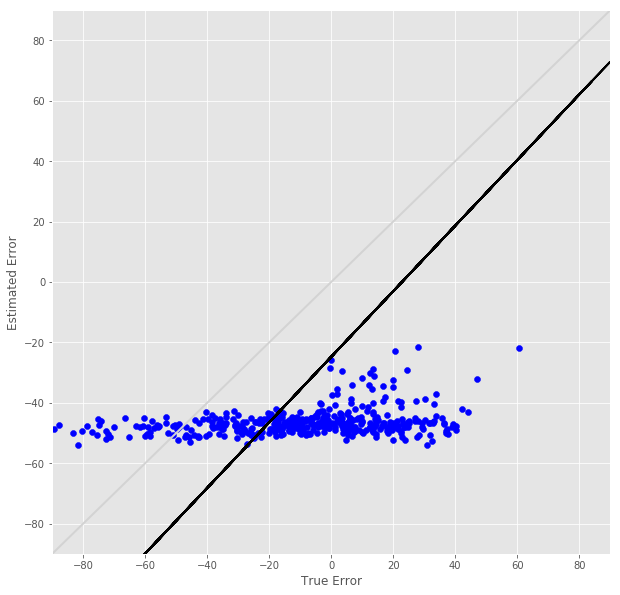

R^2 score for regression on RT: 0.0002
k = -0.0166


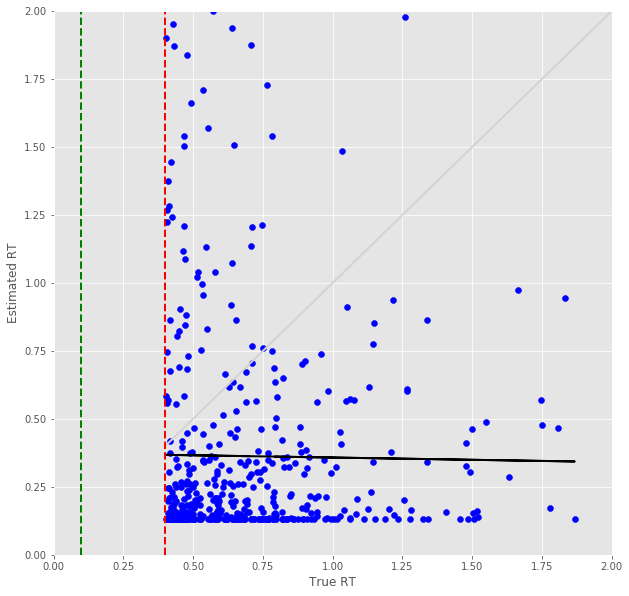

Error Prediction Score: 0.7963 RMSE
RT Prediction Score: 0.6626 RMSE
Error Prediction Corr: 0.6797
RT Prediction Corr: -0.0363
R^2 score for regression on Error: 0.4620
k = 1.0142


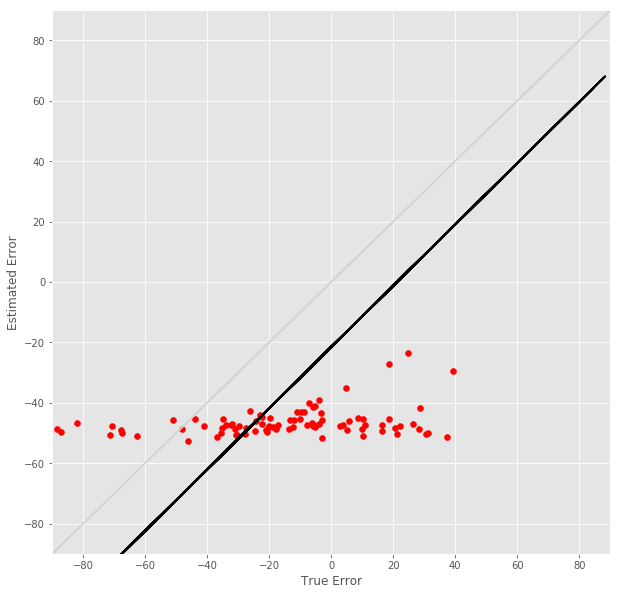

R^2 score for regression on RT: 0.0013
k = -0.0446


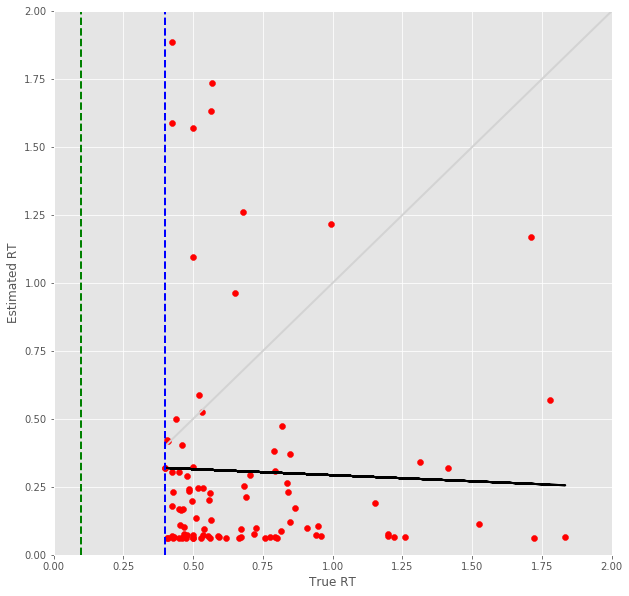

In [12]:
testScore, predictScore = [], []
NumEffectiveTest, ResponseTestScore, RTTestScore = [], [], []
NumEffectivePrediction, ResponsePredictionScore, RTPredictionScore = [], [], []
ResponseTestCorr, RTTestCorr, ResponsePredictionCorr, RTPredictionCorr = [], [], [], []

X_test_temp = testX
X_predict_temp = predictX

for FORECAST_STEP in range(1, FORECAST_MAX + 1):
    print('%d -step(s) forecast:' % (FORECAST_STEP))
    
    # use this function to prepare the train and test datasets for targeting
    
    testY, predictY = [], []
    for k in range(numSeries):
        kk = k * test_size
        for i in range(test_size - look_back - FORECAST_STEP + 1):
            testY.append(test[kk + i + look_back + FORECAST_STEP - 1, :])
    for k in range(numPredict):
        kk = k * lentmax
        for i in range(lentmax - look_back - FORECAST_STEP + 1):
            predictY.append(predict[kk + i + look_back + FORECAST_STEP - 1, :])
    testY = numpy.array(testY)
    predictY = numpy.array(predictY)

    # make predictions
    testPredict = model.predict(X_test_temp)
    predictPredict = model.predict(X_predict_temp)
    if FORECAST_STEP <= FORECAST_MAX:
        X_test_trouble = X_test_temp
        X_predict_trouble = X_predict_temp
        for l in range(look_back - 1):
            X_test_trouble[:, l, :] = X_test_trouble[:, l + 1, :]
            X_predict_trouble[:, l, :] = X_predict_trouble[:, l + 1, :]
        X_test_trouble[:, look_back - 1, :] = testPredict
        X_predict_trouble[:, look_back - 1, :] = predictPredict
        X_test_temp, X_predict_temp = [], []
        for i in range(numSeries):
            for j in range(test_size - look_back - FORECAST_STEP):
                k = i * (test_size - look_back - FORECAST_STEP + 1) + j
                X_test_temp.append(X_test_trouble[k])
        for i in range(numPredict):
            for j in range(lentmax - look_back - FORECAST_STEP):
                k = i * (lentmax - look_back - FORECAST_STEP + 1) + j
                X_predict_temp.append(X_predict_trouble[k])
        X_test_temp = numpy.array(X_test_temp)
        X_predict_temp = numpy.array(X_predict_temp)
        
    # invert predictions
    testPredict = scaler.inverse_transform(testPredict)
    testY = scaler.inverse_transform(testY)
    predictPredict = scaler.inverse_transform(predictPredict)
    predictY = scaler.inverse_transform(predictY)

    testScore.append(math.sqrt(mean_squared_error(testY, testPredict)))
    predictScore.append(math.sqrt(mean_squared_error(predictY, predictPredict)))
    print('Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, testScore[FORECAST_STEP - 1]))
    print('Predict Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, predictScore[FORECAST_STEP - 1]))
    
    # shift test predictions for plotting
    testPredictPlot = numpy.empty_like(Data)
    testPredictPlot[:, :, :] = numpy.nan
    for s in range(numSeries):
        for t in range(test_size - look_back - FORECAST_STEP + 1):
            testPredictPlot[s, t + TRAIN_SIZE + FORECAST_STEP - 1, :] = testPredict[t + s * (test_size - look_back - FORECAST_STEP + 1), :]

    # shift complete predictions for plotting
    predictPredictPlot = numpy.empty_like(Data_p)
    predictPredictPlot[:, :, :] = numpy.nan
    for s in range(numPredict):
        for t in range(TOTAL_TIME - look_back - FORECAST_STEP + 1):
            predictPredictPlot[s, t + look_back + FORECAST_STEP - 1, :] = predictPredict[t + s * (TOTAL_TIME - look_back - FORECAST_STEP + 1), :]
    
    # Output the estimation score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = trainPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break
            temp = testPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectiveTest.append(float(len(Err)) / numSeries)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponseTestScore.append(0)
        RTTestScore.append(0)
        ResponseTestCorr.append(0)
        RTTestCorr.append(0)
    else:
        ResponseTestScore.append(math.sqrt(sum(Err) / len(Err)))
        RTTestScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponseTestCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTTestCorr.append(S1.corr(S2))
    
    print('Error Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, ResponseTestScore[FORECAST_STEP - 1]))
    print('RT Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, RTTestScore[FORECAST_STEP - 1]))
    print('Error Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, ResponseTestCorr[FORECAST_STEP - 1]))
    print('RT Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, RTTestCorr[FORECAST_STEP - 1]))
    
    #lalala
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data[loc])
    plt.plot(testPredictPlot[loc])
    plt.show()
    
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data_p[loc])
    plt.plot(predictPredictPlot[loc])
    plt.show()
    #lalala
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'b')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'b')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='r')
        plt.show()
    
    # Output the prediction score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries, numSeries + numPredict):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = predictPredictPlot[s - numSeries, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectivePrediction.append(float(len(Err)) / numPredict)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponsePredictionScore.append(0)
        RTPredictionScore.append(0)
        ResponsePredictionCorr.append(0)
        RTPredictionCorr.append(0)
    else:
        ResponsePredictionScore.append(math.sqrt(sum(Err) / len(Err)))
        RTPredictionScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponsePredictionCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTPredictionCorr.append(S1.corr(S2))
            
    print('Error Prediction Score: %.4f RMSE' % (ResponsePredictionScore[FORECAST_STEP - 1]))
    print('RT Prediction Score: %.4f RMSE' % (RTPredictionScore[FORECAST_STEP - 1]))
    print('Error Prediction Corr: %.4f' % (ResponsePredictionCorr[FORECAST_STEP - 1]))
    print('RT Prediction Corr: %.4f' % (RTPredictionCorr[FORECAST_STEP - 1]))
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'r')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'r')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='b')
        plt.show()
    

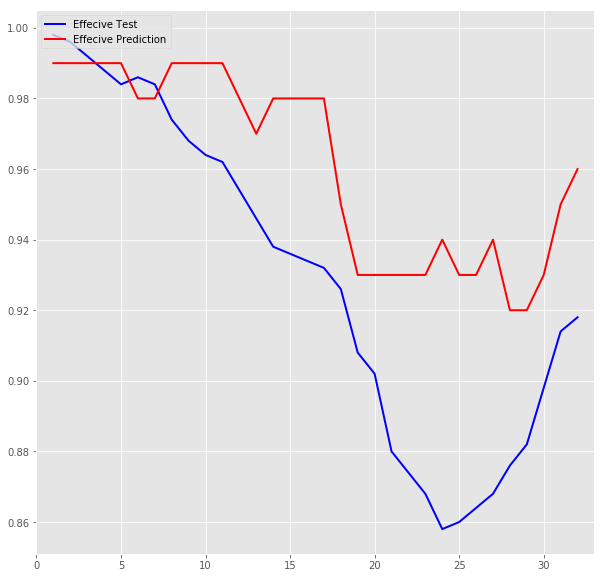

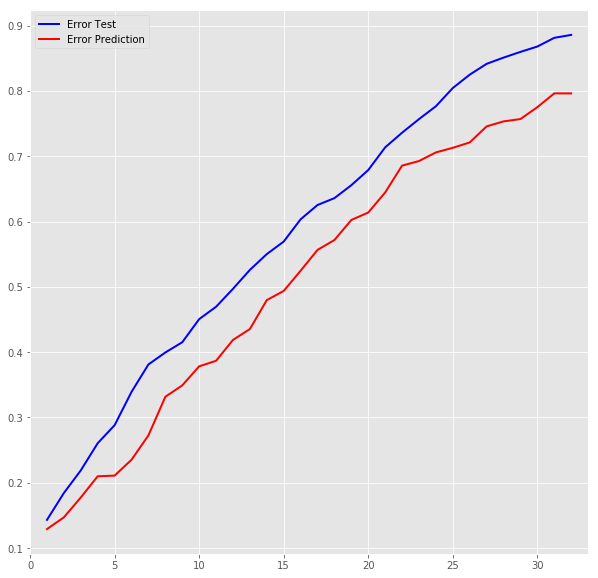

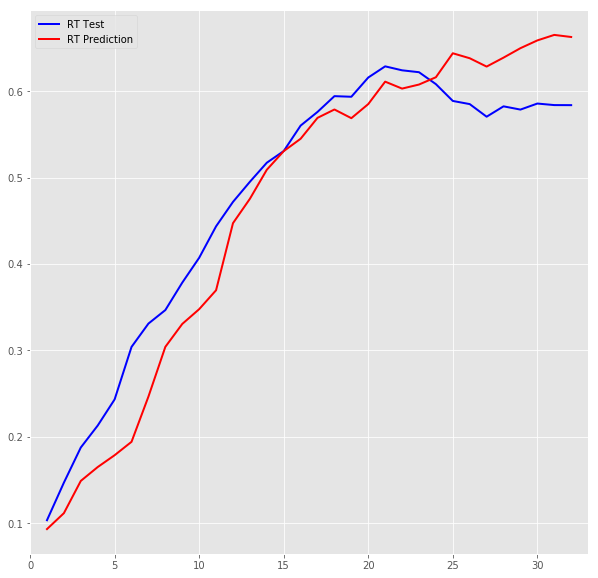

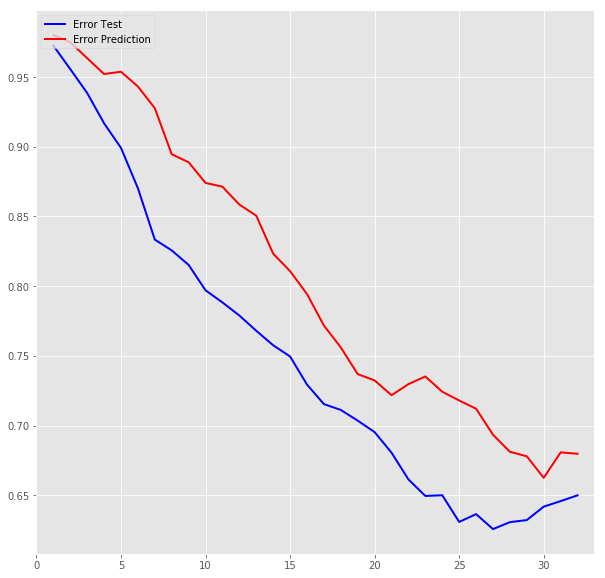

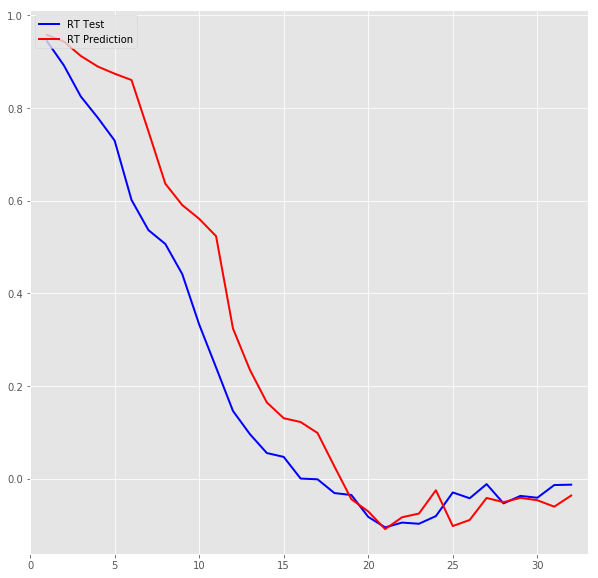

In [13]:
NumEffectiveTest = numpy.array(NumEffectiveTest)
ResponseTestScore = numpy.array(ResponseTestScore)
RTTestScore = numpy.array(RTTestScore)
ResponseTestCorr = numpy.array(ResponseTestCorr)
RTTestCorr = numpy.array(RTTestCorr)
NumEffectivePrediction = numpy.array(NumEffectivePrediction)
ResponsePredictionScore = numpy.array(ResponsePredictionScore)
RTPredictionScore = numpy.array(RTPredictionScore)
ResponsePredictionCorr = numpy.array(ResponsePredictionCorr)
RTPredictionCorr = numpy.array(RTPredictionCorr)

xx = numpy.arange(1, FORECAST_MAX + 1)

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
EffectiveTestPlot = plt.plot(xx, NumEffectiveTest, linewidth = 2, color = 'b', label = "Effecive Test")
EffectivePredictionPlot = plt.plot(xx, NumEffectivePrediction, linewidth = 2, color = 'r', label = "Effecive Prediction")
plt.legend(handles=[EffectiveTestPlot[0], EffectivePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestPlot = plt.plot(xx, ResponseTestScore, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionPlot = plt.plot(xx, ResponsePredictionScore, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestPlot[0], ResponsePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestPlot = plt.plot(xx, RTTestScore, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionPlot = plt.plot(xx, RTPredictionScore, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestPlot[0], RTPredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestCorrPlot = plt.plot(xx, ResponseTestCorr, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionCorrPlot = plt.plot(xx, ResponsePredictionCorr, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestCorrPlot[0], ResponsePredictionCorrPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestCorrPlot = plt.plot(xx, RTTestCorr, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionCorrPlot = plt.plot(xx, RTPredictionCorr, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestCorrPlot[0], RTPredictionCorrPlot[0]],loc="upper left")
plt.show()
